In [2]:
%matplotlib inline
import numpy as np
from matplotlib import pyplot as plt
from tqdm import tqdm

from gensim.models import Word2Vec

def intersection_align_gensim(m1, m2):
    common = list(set(m1.wv.key_to_index).intersection(set(m2.wv.key_to_index)))
    common.sort(key=lambda w: m1.wv.get_vecattr(w, "count") + m2.wv.get_vecattr(w, "count"), reverse=True)

    def align_model(model):
        vectors = np.array([model.wv[w] for w in common])
        model.wv.vectors = vectors
        model.wv.key_to_index = {w: i for i, w in enumerate(common)}
        model.wv.index_to_key = common
        return model

    return align_model(m1), align_model(m2)

def smart_procrustes_align_gensim(base, other):
    base, other = intersection_align_gensim(base, other)
    m = other.wv.vectors.T @ base.wv.vectors
    u, _, v = np.linalg.svd(m)
    ortho = u @ v
    other.wv.vectors = other.wv.vectors @ ortho
    return other

def cosine_distance(a, b):
    return (1 - np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))) / 2


## 5y splits

In [3]:
wave_1 = Word2Vec.load('../5ysplits_models/diachronic_wave_1_processed_model.bin')
wave_2 = Word2Vec.load('../5ysplits_models/diachronic_wave_2_processed_model.bin')
wave_3 = Word2Vec.load('../5ysplits_models/diachronic_wave_3_processed_model.bin')
wave_4 = Word2Vec.load('../5ysplits_models/diachronic_wave_4_processed_model.bin')
wave_5 = Word2Vec.load('../5ysplits_models/diachronic_wave_5_processed_model.bin')

In [4]:
import json

word_counts_wave_1 = json.load(
    open(
        "../5ysplits_models/diachronic_wave_1_processed_word_counts.json"
    )
)
word_counts_wave_2 = json.load(
    open(
        "../5ysplits_models/diachronic_wave_2_processed_word_counts.json"
    )
)
word_counts_wave_3 = json.load(
    open(
        "../5ysplits_models/diachronic_wave_3_processed_word_counts.json"
    )
)
word_counts_wave_4 = json.load(
    open(
        "../5ysplits_models/diachronic_wave_4_processed_word_counts.json"
    )
)
word_counts_wave_5 = json.load(
    open(
        "../5ysplits_models/diachronic_wave_5_processed_word_counts.json"
    )
)

word_counts_separate = [
    word_counts_wave_1,
    word_counts_wave_2,
    word_counts_wave_3,
    word_counts_wave_4,
    word_counts_wave_5,
]

In [5]:
waves = {0: wave_1, 1: wave_2, 2: wave_3, 3: wave_4, 4: wave_5}

In [6]:
models = [waves[key] for key in sorted(waves.keys())]

periods = sorted(waves.keys())

for i in reversed(range(1, len(models))):
    models[i - 1] = smart_procrustes_align_gensim(models[i], models[i - 1])

In [7]:
# create common vocab counts

# POS tags that make sense
POS_tags = ["noun", "adj", "propn", "verb"]

import re

vocab_sets = [set(model.wv.index_to_key) for model in models]
common_vocab_start = set.intersection(*vocab_sets)

common_vocab_counts_per_wave = {}

for wave_index, model in enumerate(models):
    wave_vocab = set(model.wv.index_to_key)
    common_vocab_counts_per_wave[wave_index] = {
        word: word_counts_separate[wave_index][word]
        for word in common_vocab_start
        if word in wave_vocab
    }

# Remove words from common_vocab_counts that match the punctuation regex and filter by other critera
punctuation_regex = re.compile(r"^[^\w\s]+$")
common_vocab_counts_per_wave = {
    wave_index: {
        word: count
        for word, count in common_vocab_counts_per_wave[wave_index].items()
        if not punctuation_regex.match(word.split("_", -1)[0])
        and not word.split("_")[0].isdigit()
        and not re.match(
            r"^\d+$", word.split("_")[0]
        )  # Additional check for numeric strings
        and word.split("_")[0].isalpha()
        and len(word.split("_")[0]) > 2
        and word.split("_")[1] in POS_tags
    }
    for wave_index in common_vocab_counts_per_wave
}

### Topical drift

In [23]:
def analyze_cumulative_drift(words, topic_name="Topic"):
    TOP_N = 20
    
    common_vocab = words

    drift_scores = {}
    drift_scores_cumulative = {word: [] for word in common_vocab}

    for i in range(len(models) - 1):
        for word in common_vocab:
            vec1 = models[i].wv[word]
            vec2 = models[i + 1].wv[word]
            dist = cosine_distance(vec1, vec2)
            if word not in drift_scores:
                drift_scores[word] = 0
            drift_scores[word] += dist
            drift_scores_cumulative[word].append(dist)

    top_drifters = sorted(drift_scores.items(), key=lambda x: x[1], reverse=True)[
        :TOP_N
    ]
    top_drifters_cumulative = sorted(
        drift_scores_cumulative.items(), key=lambda x: sum(x[1]), reverse=True
    )[:TOP_N]

    print([x for x in top_drifters[:TOP_N]])

    # Show top drifters with a bar plot
    words, scores = zip(*top_drifters)
    plt.figure(figsize=(10, 6))
    plt.barh(words, scores, color="skyblue")
    plt.xlabel("Summed Drift Score")
    plt.ylabel("Words")
    plt.title(f"Top {TOP_N} Drifting Words for {topic_name}")
    plt.gca().invert_yaxis()  # Invert y-axis to show the highest score at the top
    plt.tight_layout()
    plt.show()

    # Plot drift for top words
    period_labels = {
        0: "2000-2004",
        1: "2005-2009",
        2: "2010-2014",
        3: "2015-2019",
        4: "2020-2024",
    }
    plt.figure(figsize=(10, 6))

    for word, dists in top_drifters_cumulative:
        plt.plot(
            [period_labels[p] for p in periods[1:]],
            dists,
            label=word,
            marker="o",
            alpha=0.8,
        )

    plt.title(
        f"Top ${TOP_N}$ {topic_name} words by cumulative semantic drift for neighboring periods"
    )
    plt.xlabel("Period")
    plt.ylabel(f"Cosine distance between consecutive periods")
    plt.ylim(0, 0.4)
    plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1), fontsize="small")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [9]:
# TSNE functions

def get_most_similar_by_pos(
    word="maska_noun",
    pos="noun",
    top_candidates=100,
    filter_under=100,
    most_similar=20,
):
    most_similar_by_wave = {}
    for wave_index, model in enumerate(models):
        words_by_pos = [
            x
            for x in common_vocab_counts_per_wave[wave_index]
            if x.split("_")[1] == pos
            and not x.split("_")[0][:3] == word.split("_")[0][:3]
        ]
        similar_words = model.wv.most_similar(
            word, topn=top_candidates
        )  # Get more candidates initially
        filtered_similar_words = sorted(
            [
                (similar_word, score)
                for similar_word, score in similar_words
                if similar_word in words_by_pos
                and all(
                    [
                        common_vocab_counts_per_wave[idx][similar_word]
                        >= filter_under // 10
                        for idx in range(len(models))
                    ]
                )
                and not similar_word[:3] == word[:3]
            ],
            key=lambda x: x[1],
            reverse=False,
        )

        seen_prefixes = set()
        filtered_similar_words = [
            (word, score)
            for word, score in filtered_similar_words
            if word.split("_")[0][:3] not in seen_prefixes
            and not seen_prefixes.add(word.split("_")[0][:3])
        ]
        filtered_similar_words = sorted(
            filtered_similar_words, key=lambda x: x[1], reverse=True
        )[:most_similar]

        most_similar_by_wave[wave_index] = filtered_similar_words
        # print(f"Wave {wave_index + 1}:")
        print(
            f"Most similar to {word} in wave {wave_index + 1} are ",
            [x[0] for x in filtered_similar_words],
        )
        # print("==" * 20)

    return most_similar_by_wave


waves_tsne = {
    period: np.load(
        f"../5ysplits_models/tsne_embeddings_wave_{period + 1}.npy"
    )
    for period in periods
}

def plot_tsne_visualization(
    words, target_word="maska_noun", periods=None, waves=None, period_labels=None
):
    if periods is None or waves is None or period_labels is None:
        raise ValueError("Periods, waves, and period_labels must be provided.")

    fig, axes = plt.subplots(3, 2, figsize=(18, 12))
    axes = axes.flatten()

    for idx, period in enumerate(periods):
        # Extract words and their similarity scores for the current wave
        word_scores = {word: score for word, score in words[period]}

        word_labels = [target_word] + list(word_scores.keys())

        target_indices = [
            models[period].wv.key_to_index.get(w, None) for w in word_labels
        ]

        # Perform t-SNE to reduce dimensionality to 2D
        word_vectors_2d = waves_tsne[period]

        # Plot the words in 2D space
        ax = axes[idx]
        ax.scatter(
            word_vectors_2d[target_indices, 0],
            word_vectors_2d[target_indices, 1],
            c="blue",
            alpha=0.6,
        )

        # Annotate the points with word labels
        for i, word in enumerate(word_labels):
            if i == 0:
                ax.annotate(
                    word,
                    (
                        word_vectors_2d[target_indices[0], 0],
                        word_vectors_2d[target_indices[0], 1],
                    ),
                    fontsize=12,
                    fontweight="bold",
                    color="red",
                )
            else:
                ax.annotate(
                    word,
                    (
                        word_vectors_2d[target_indices[i], 0],
                        word_vectors_2d[target_indices[i], 1],
                    ),
                    fontsize=9,
                    alpha=0.75,
                )

        ax.set_title(
            f"2D Visualization of Words Closest to '{target_word}' in period "
            + str(period_labels[period])
        )
        ax.set_xlabel("t-SNE Dimension 1")
        ax.set_ylabel("t-SNE Dimension 2")
        ax.grid(True)

    # Hide any unused subplots
    for idx in range(len(periods), len(axes)):
        fig.delaxes(axes[idx])

    plt.tight_layout()
    plt.show()

### COVID drifters

In [25]:
covid_words = [
    "zdravlje_noun",
    "doktor_noun",
    "pacijent_noun",
    "simptom_noun",
    "miris_noun",
    "okus_noun",
    "pluća_noun",
    "disanje_noun",
    "respirator_noun",
    "kašalj_noun",
    "suh_adj",
    "prevencija_noun",
    "cjepivo_noun",
    "cijepljenje_noun",
    "nuspojava_noun",
    "sumamed_noun",
    "imunološki_adj",
    "smrt_noun",
    "hospitalizacija_noun",
    "intenzivna_adj",
    "njega_noun",
    "antitijela_noun",
    "testiranje_noun",
    "test_noun",
    "ventilacija_noun",
    "epidemija_noun",
    "pandemija_noun",
    "korona_noun",
    "virus_noun",
    "koronavirus_noun",
    "epidemiologija_noun",
    "širenje_noun",
    "pozitivan_adj",
    "novozaražen_adj",
    "zaražen_adj",
    "testiranje_noun",
    "test_noun",
    "slučaj_noun",
    "izolacija_noun",
    "samoizolacija_noun",
    "karantena_noun",
    "postotak_noun",
    "zaraznost_noun",
    "varijanta_noun",
    "mutacija_noun",
    "eksponencijalan_adj",
    "rast_noun",
    "antitijela_noun",
    "who_propn",
    "prevencija_noun",
    "pcr_noun",
    "karantena_noun",
    "izolacija_noun",
    "samoizolacija_noun",
    "mjera_noun",
    "stožer_noun",
    "zabrana_noun",
    "okupljanje_noun",
    "potvrda_noun",
    "maska_noun",
    "digitalizacija_noun",
    "testiranje_noun",
    "test_noun",
    "pcr_noun",
    "stožer_noun",
    "mjera_noun",
    "potvrda_noun",
    "zabrana_noun",
    "povjerenje_noun",
    "nadzor_noun",
    "novozaražen_adj",
    "zaražen_adj",
    "testiranje_noun",
    "mjera_noun",
    "stožer_noun",
    "potvrda_noun",
    "dezinformacija_noun",
    "infodemija_noun",
    "teorija_noun",
    "zavjera_noun",
    "povjerenje_noun",
    "who_propn",
    "mutacija_noun",
    "varijanta_noun",
    "mentalno_adj",
    "zdravlje_noun",
    "povjerenje_noun",
    "teorija_noun",
    "zavjera_noun",
    "dezinformacija_noun",
    "izolacija_noun",
    "samoizolacija_noun"
]

covid_words = set(covid_words)

for wave_index, word_counts_wave in enumerate(word_counts_separate):
    covid_word_count = sum(1 for word in covid_words if word in word_counts_wave)
    print(f"Number of words from the COVID words list in wave {wave_index + 1}: {covid_word_count}")

Number of words from the COVID words list in wave 1: 61
Number of words from the COVID words list in wave 2: 61
Number of words from the COVID words list in wave 3: 61
Number of words from the COVID words list in wave 4: 61
Number of words from the COVID words list in wave 5: 61


In [26]:
word_counts = []

for word in covid_words:
    counts = [word_counts_wave.get(word, 0) for word_counts_wave in word_counts_separate]
    word_counts.append(counts)
    print(f"{word}: {counts}")
    

covid_words = {word for i, word in enumerate(covid_words) if sum(word_counts[i]) >= 1000}

print("New length", len(covid_words))

cjepivo_noun: [1374, 5243, 9704, 26688, 512613]
disanje_noun: [364, 1428, 5934, 13590, 29138]
respirator_noun: [247, 756, 1194, 3920, 114041]
povjerenje_noun: [4118, 10264, 39283, 105901, 147473]
miris_noun: [979, 3764, 18777, 39904, 68941]
zaražen_adj: [1620, 2241, 4545, 9091, 228423]
zavjera_noun: [419, 1246, 5487, 12887, 29207]
teorija_noun: [1358, 4387, 20873, 46859, 67666]
mjera_noun: [14808, 37983, 135223, 333149, 1183897]
virus_noun: [3551, 8714, 19071, 42539, 457807]
ventilacija_noun: [121, 461, 1196, 2590, 11483]
dezinformacija_noun: [255, 483, 1657, 6361, 24953]
korona_noun: [298, 226, 511, 1728, 150707]
zdravlje_noun: [5970, 16785, 79108, 172405, 357621]
pozitivan_adj: [6995, 17501, 69935, 173989, 433892]
pandemija_noun: [1376, 2504, 2383, 4195, 496697]
imunološki_adj: [303, 747, 5313, 13303, 34043]
postotak_noun: [1877, 4885, 15811, 32329, 58620]
potvrda_noun: [2733, 7116, 24154, 50168, 133698]
okupljanje_noun: [1638, 5697, 18643, 43964, 130650]
okus_noun: [853, 2859, 21692

[('korona_noun', 0.7447885125875473), ('maska_noun', 0.6604717969894409), ('intenzivna_adj', 0.6344957649707794), ('respirator_noun', 0.6238415837287903), ('samoizolacija_noun', 0.6216126084327698), ('pandemija_noun', 0.6099677681922913), ('koronavirus_noun', 0.6003290712833405), ('karantena_noun', 0.5575032532215118), ('cijepljenje_noun', 0.5549052357673645), ('izolacija_noun', 0.5510454475879669), ('antitijela_noun', 0.5424691140651703), ('mutacija_noun', 0.5344499349594116), ('varijanta_noun', 0.5268047749996185), ('pcr_noun', 0.5229334831237793), ('hospitalizacija_noun', 0.517450600862503), ('eksponencijalan_adj', 0.5107402205467224), ('ventilacija_noun', 0.5094751119613647), ('zaražen_adj', 0.5061734020709991), ('who_propn', 0.49292251467704773), ('cjepivo_noun', 0.4884445071220398)]


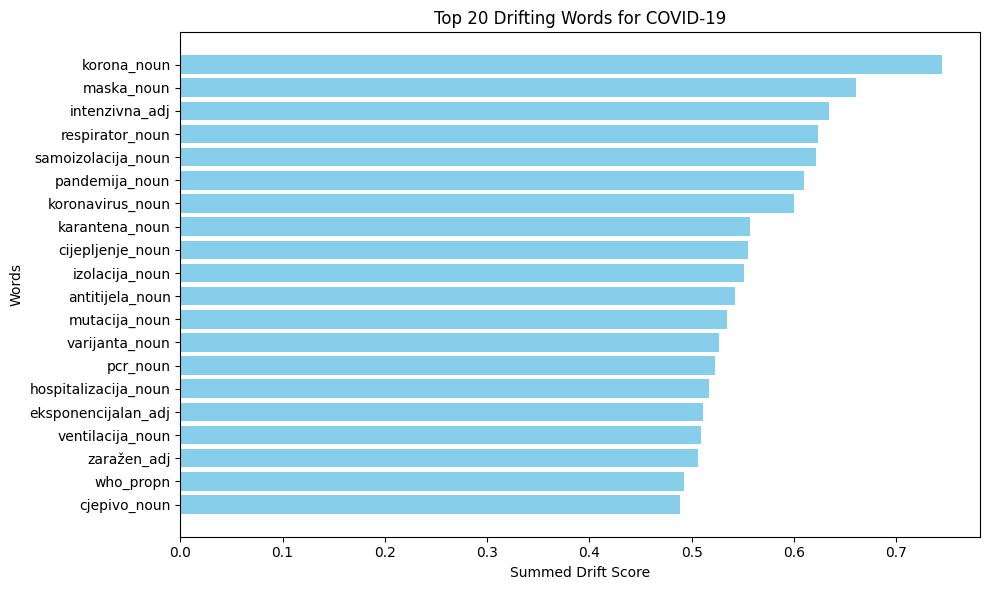

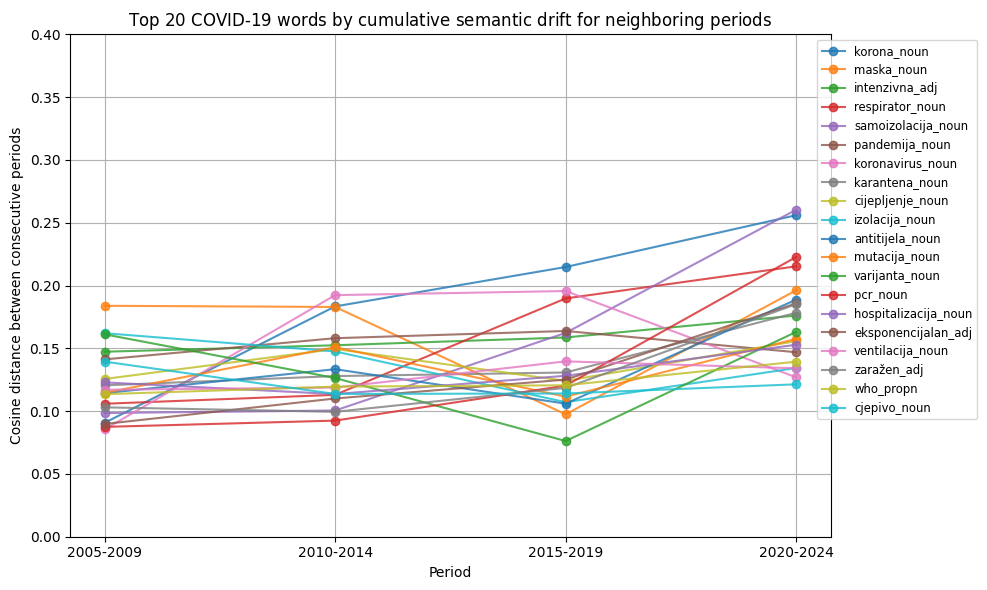

In [27]:
analyze_cumulative_drift(covid_words, topic_name="COVID-19")

### TOP 20 drifters surrounded by top 20 most similar words per wave

Word: korona_noun
Most similar to korona_noun in wave 1 are  ['ebola_noun', 'ospica_noun', 'gripi_noun', 'mišje_noun', 'klamidija_noun', 'upal_noun', 'lockdown_noun', 'anoreksija_noun', 'luditi_noun', 'umrlih_noun', 'dehidracija_noun', 'cjepiva_noun', 'sepsa_noun', 'zaraženost_noun', 'covid_noun', 'hipotermija_noun', 'salmonela_noun', 'lijeka_noun', 'osobe_noun', 'dojenčad_noun']
Most similar to korona_noun in wave 2 are  ['sars_noun', 'ospica_noun', 'kontraindikacija_noun', 'difterija_noun', 'simptomi_noun', 'aktivni_noun', 'gripi_noun', 'turističkih_noun', 'cjepiv_noun', 'mišje_noun', 'sojev_noun', 'stižu_noun', 'glaukom_noun', 'osobe_noun', 'slučajeva_noun', 'anemija_noun', 'lockdown_noun', 'preživljenje_noun', 'inkubacija_noun', 'covid_noun']
Most similar to korona_noun in wave 3 are  ['lockdown_noun', 'sars_noun', 'mišje_noun', 'koler_noun', 'virusi_noun', 'pandemija_noun', 'ebola_noun', 'procijepljenost_noun', 'ospica_noun', 'infekcija_noun', 'incidencija_noun', 'hepatitis_noun',

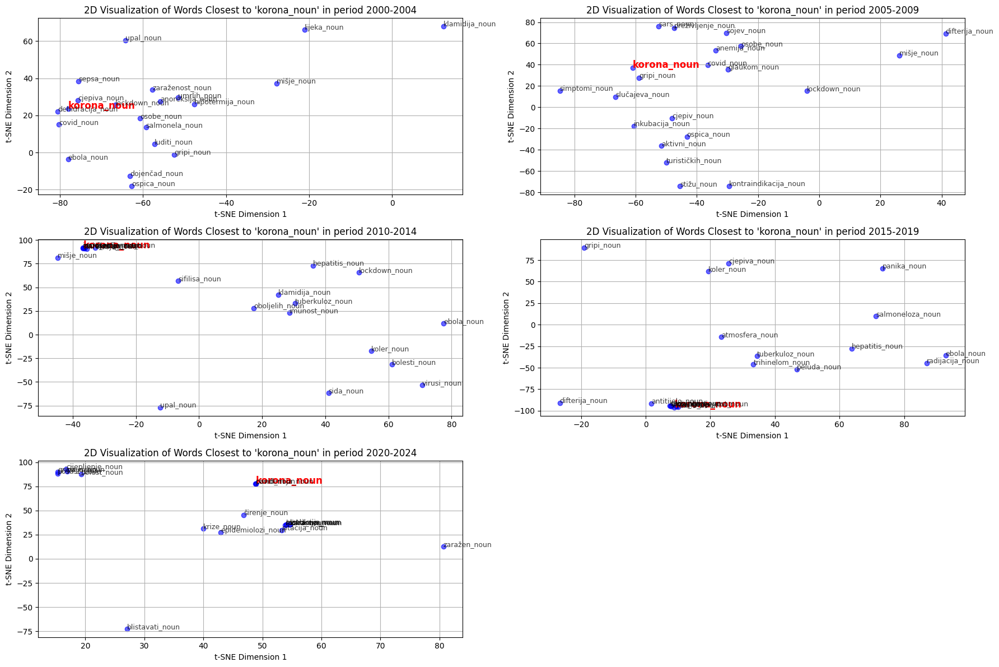




Word: maska_noun
Most similar to maska_noun in wave 1 are  ['kabanica_noun', 'ružičast_noun', 'kombinezon_noun', 'značka_noun', 'lampica_noun', 'šminka_noun', 'burka_noun', 'odijelo_noun', 'žohar_noun', 'stvarčica_noun', 'namjesto_noun', 'uniforma_noun', 'točkica_noun', 'naočale_noun', 'ventilator_noun', 'pritiskanje_noun', 'jeans_noun', 'bedž_noun', 'naljepnica_noun', 'nošenje_noun']
Most similar to maska_noun in wave 2 are  ['lice_noun', 'šilterica_noun', 'kombinezon_noun', 'šešir_noun', 'frak_noun', 'rekviziti_noun', 'štitnik_noun', 'kravat_noun', 'hlač_noun', 'zuba_noun', 'oklop_noun', 'perika_noun', 'kabanica_noun', 'marama_noun', 'resica_noun', 'plašte_noun', 'tanga_noun', 'raspoznavanje_noun', 'povez_noun', 'šablona_noun']
Most similar to maska_noun in wave 3 are  ['rukavica_noun', 'šminka_noun', 'šešira_noun', 'pancirka_noun', 'lockdown_noun', 'štitnik_noun', 'lico_noun', 'perika_noun', 'kabanica_noun', 'kostim_noun', 'kapa_noun', 'naočala_noun', 'ogrtač_noun', 'kišobrana_no

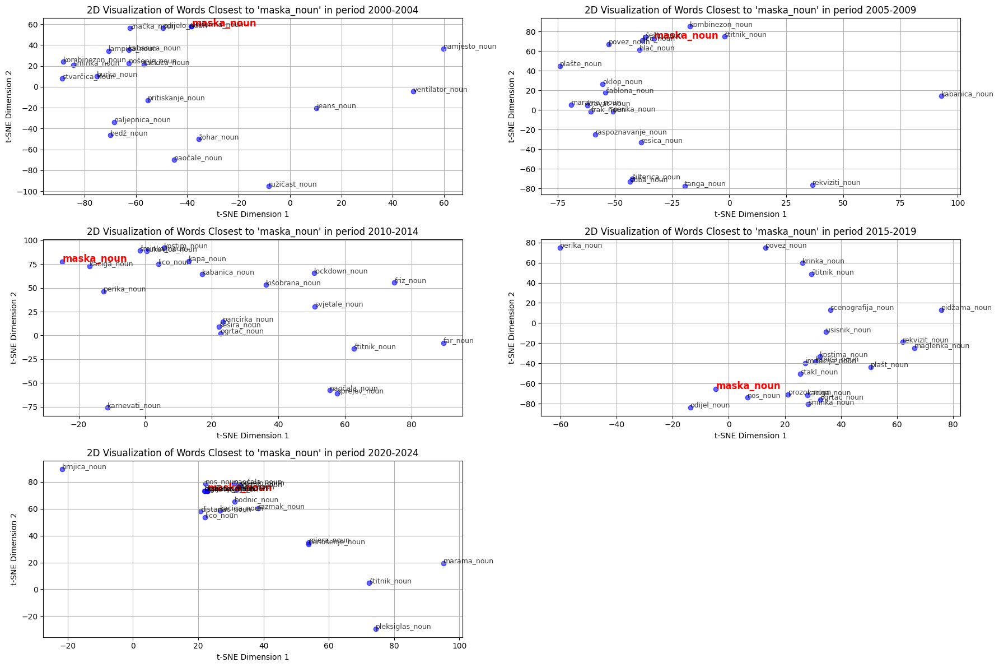




Word: intenzivna_adj
Most similar to intenzivna_adj in wave 1 are  ['tunelima_noun', 'tinejdžerka_noun', 'opekotina_noun', 'rafale_noun', 'šrapnel_noun', 'nadlijeća_noun', 'uspavljivanje_noun', 'kovčez_noun', 'magarc_noun', 'glečer_noun', 'letjelika_noun', 'helikoptera_noun', 'punkat_noun', 'skloništ_noun', 'artiljerija_noun', 'upasti_noun', 'noža_noun', 'puškaranje_noun', 'vojaran_noun', 'oklopnjak_noun']
Most similar to intenzivna_adj in wave 2 are  ['patroliranje_noun', 'nestalima_noun', 'pronalasko_noun', 'opsežnost_noun', 'pristizanje_noun', 'lociranje_noun', 'poslijepodneve_noun', 'motrenje_noun', 'puteva_noun', 'nadlijeća_noun', 'saznanja_noun', 'fotodokumentacija_noun', 'sklanjanje_noun', 'sediment_noun', 'preživjel_noun', 'detektiranje_noun', 'helikopterima_noun', 'očevide_noun', 'traganje_noun', 'mjerenja_noun']
Most similar to intenzivna_adj in wave 3 are  ['prokrvljenost_noun']
Most similar to intenzivna_adj in wave 4 are  ['aktivnost_noun', 'jačanje_noun', 'razminiranj_

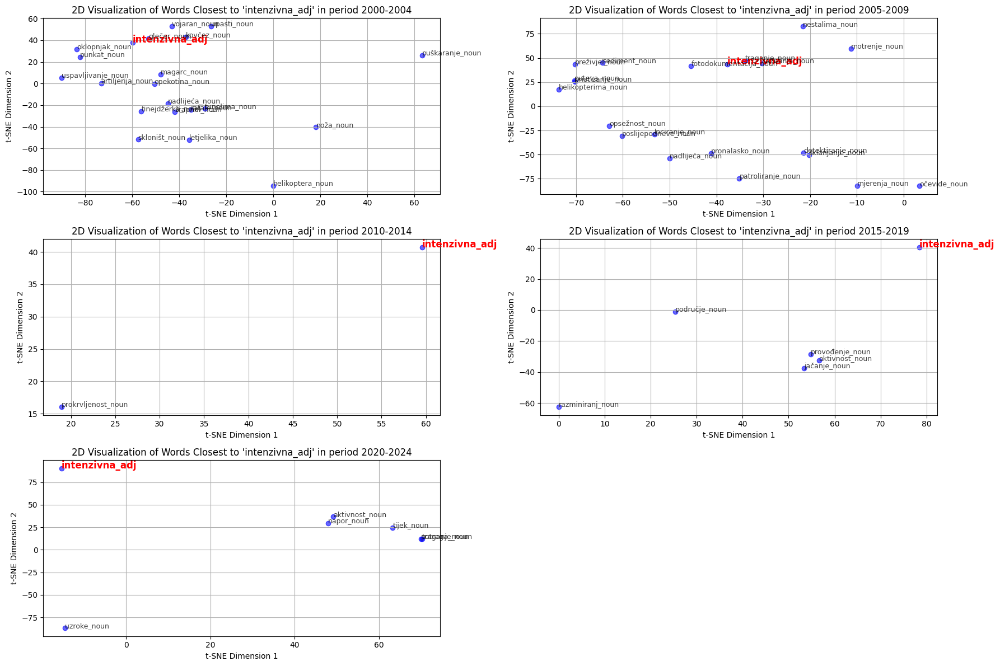




Word: respirator_noun
Most similar to respirator_noun in wave 1 are  ['onkologija_noun', 'mamografija_noun', 'eksplantacija_noun', 'koronarografija_noun', 'okulist_noun', 'nedonoščad_noun', 'punkcija_noun', 'osteoporoza_noun', 'serum_noun', 'rotarijanac_noun', 'ultrazvukom_noun', 'defibrilator_noun', 'gušterač_noun', 'rađaonica_noun', 'pacemaker_noun', 'kemoterapija_noun', 'fibrilacija_noun', 'limfom_noun', 'rožnica_noun', 'pužnica_noun']
Most similar to respirator_noun in wave 2 are  ['defibrilator_noun', 'nedonoščad_noun', 'koronarografija_noun', 'eksplantacija_noun', 'barokomora_noun', 'miokard_noun', 'meningitis_noun', 'kateter_noun', 'upal_noun', 'sepsa_noun', 'disanje_noun', 'hemodijaliza_noun', 'tuberkuloz_noun', 'pužnica_noun', 'liječenje_noun', 'okulist_noun', 'šećeraš_noun', 'maternika_noun', 'grlobolja_noun', 'komi_noun']
Most similar to respirator_noun in wave 3 are  ['dijaliga_noun', 'kbc_noun', 'infuzija_noun', 'sepsa_noun', 'neurokirurgija_noun', 'pedijatrija_noun', '

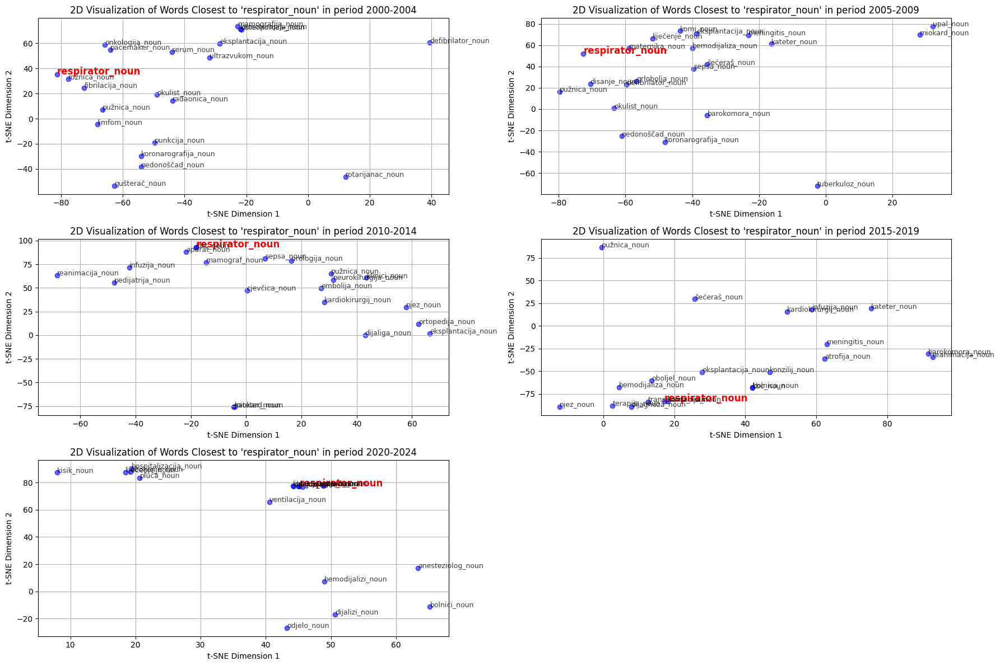




Word: samoizolacija_noun
Most similar to samoizolacija_noun in wave 1 are  ['lockdown_noun', 'brojki_noun', 'penalizacija_noun', 'alkoholizm_noun', 'dosjeu_noun', 'paritet_noun', 'marihuaan_noun', 'liječnicima_noun', 'neaktivnost_noun', 'nikakav_noun', 'kastracija_noun', 'zamagljivanje_noun', 'neopravdan_noun', 'testovi_noun', 'impotencija_noun', 'vijeme_noun', 'ispitanic_noun', 'ustanoviti_noun', 'obim_noun', 'pobačaja_noun']
Most similar to samoizolacija_noun in wave 2 are  ['izbjeglic_noun', 'marginaliziranje_noun', 'potiskivanje_noun', 'getoizacija_noun', 'postult_noun', 'tlačenje_noun', 'rastakanje_noun', 'saznavanje_noun', 'militarizacija_noun', 'nihilizam_noun', 'regresija_noun', 'ugnjetavanje_noun', 'ohrabrivanje_noun', 'nevoljkost_noun', 'nepriznavanje_noun', 'stigmatizacija_noun', 'globalizam_noun', 'multilateralizam_noun', 'subjektivitet_noun', 'radikalizacija_noun']
Most similar to samoizolacija_noun in wave 3 are  ['izolacionizam_noun', 'rezoluciji_noun', 'marginalizira

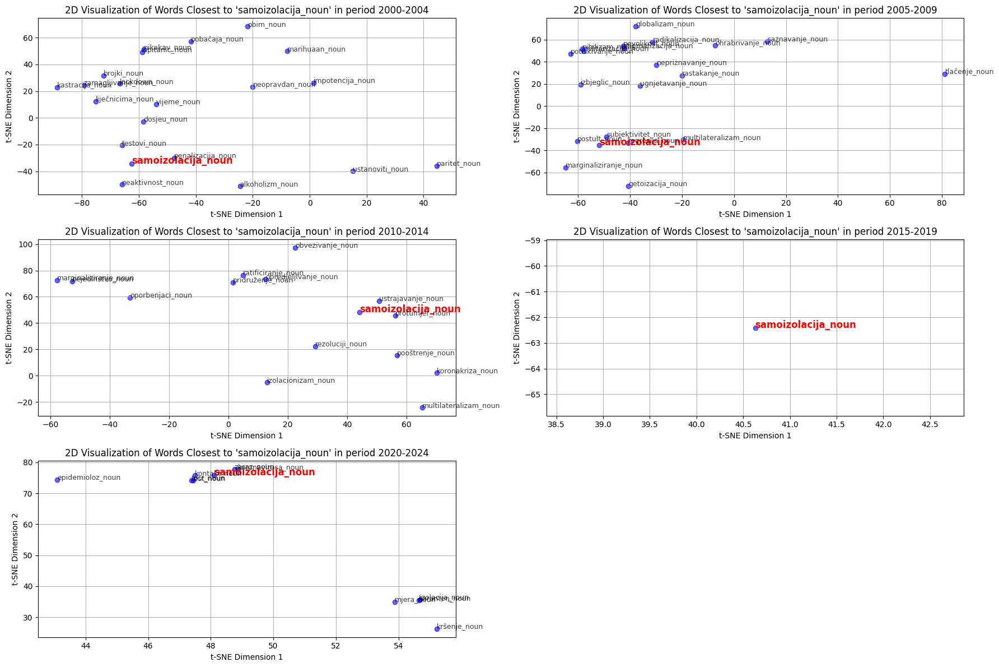




Word: pandemija_noun
Most similar to pandemija_noun in wave 1 are  ['lockdown_noun', 'ebola_noun', 'incidencija_noun', 'ospica_noun', 'virusa_noun', 'azija_noun', 'tsunamija_noun', 'epidemiolozi_noun', 'kravlji_noun', 'umrlih_noun', 'monsun_noun', 'recesija_noun', 'melanom_noun', 'obuzdavanje_noun', 'vijetnam_noun', 'ekstrem_noun', 'alkoholizm_noun', 'gripi_noun', 'specifikum_noun', 'gastritis_noun']
Most similar to pandemija_noun in wave 2 are  ['sars_noun', 'ebola_noun', 'gripi_noun', 'ospica_noun', 'pojavnost_noun', 'virusi_noun', 'mutacija_noun', 'malarija_noun', 'inkubacija_noun', 'zaražen_noun', 'patogen_noun', 'sifilis_noun', 'tuberkuloz_noun', 'lockdown_noun', 'difterija_noun', 'soj_noun', 'meningitis_noun', 'trihineloza_noun', 'tifus_noun', 'imunost_noun']
Most similar to pandemija_noun in wave 3 are  ['sars_noun', 'ebola_noun', 'ospica_noun', 'kuga_noun', 'virolog_noun', 'korona_noun', 'kriza_noun', 'imunost_noun', 'bolest_noun', 'zaražen_noun', 'antraks_noun', 'razmjer_no

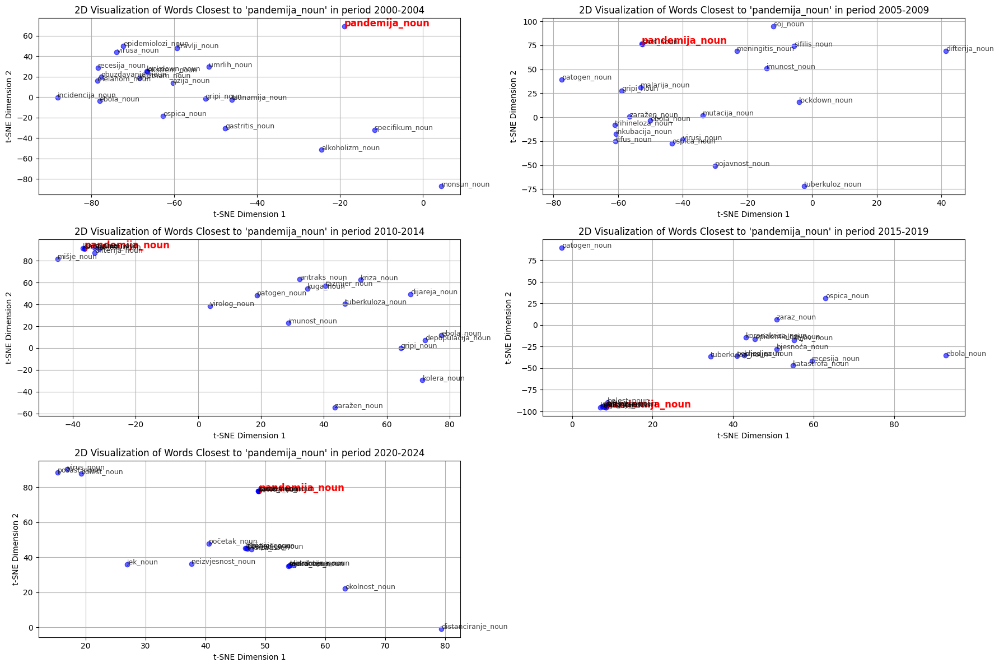




Word: koronavirus_noun
Most similar to koronavirus_noun in wave 1 are  ['ospica_noun', 'ebola_noun', 'sars_noun', 'tuberkuloza_noun', 'umrlih_noun', 'sifilisa_noun', 'klamidija_noun', 'incidencija_noun', 'hepatitis_noun', 'lockdown_noun', 'zaraženost_noun', 'mišje_noun', 'mikrobiolog_noun', 'vijetnam_noun', 'sida_noun', 'tsunamija_noun', 'leukemija_noun', 'aids_noun', 'gastritis_noun', 'hemodijalizi_noun']
Most similar to koronavirus_noun in wave 2 are  ['sars_noun', 'ebola_noun', 'kolera_noun', 'sojev_noun', 'incidencija_noun', 'inkubacija_noun', 'pandemija_noun', 'grupiranje_noun', 'pothranjenost_noun', 'trihineloza_noun', 'sifilis_noun', 'mortalitet_noun', 'izoliranje_noun', 'posljednica_noun', 'ospica_noun', 'ciroza_noun', 'patogen_noun', 'glaukom_noun', 'simptomi_noun', 'tlakaš_noun']
Most similar to koronavirus_noun in wave 3 are  ['pandemija_noun', 'ebola_noun', 'sars_noun', 'ospica_noun', 'meningitis_noun', 'bedrenica_noun', 'zaražen_noun', 'salmonel_noun', 'bjesnoća_noun', 

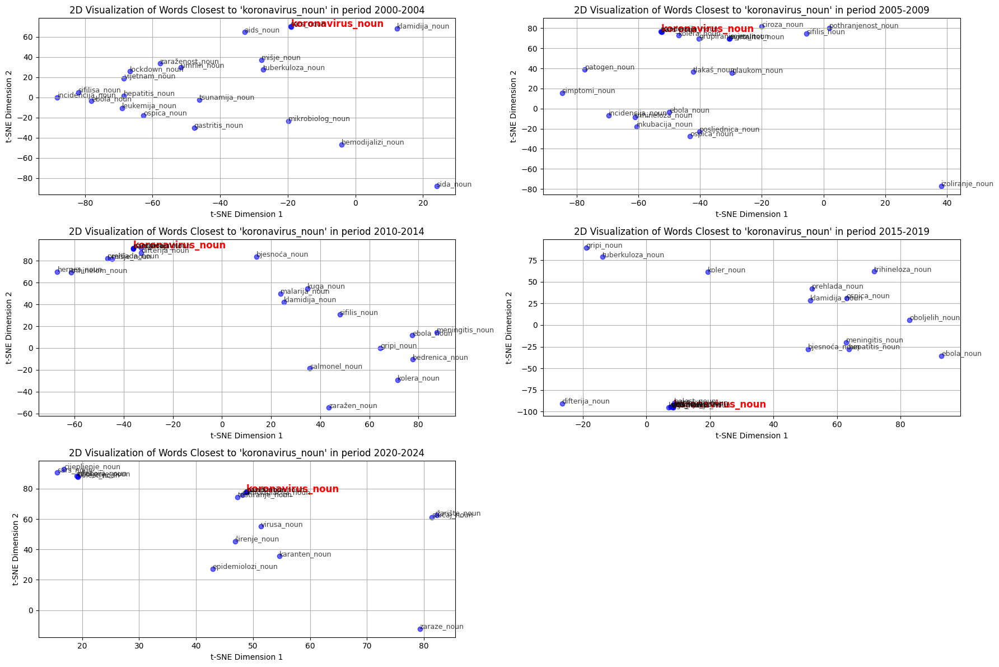




Word: karantena_noun
Most similar to karantena_noun in wave 1 are  ['simptome_noun', 'lockdown_noun', 'kastracija_noun', 'solaris_noun', 'samoizolacija_noun', 'ospica_noun', 'gripi_noun', 'sida_noun', 'kravlji_noun', 'ebola_noun', 'odmet_noun', 'pauzu_noun', 'aparatima_noun', 'dezinfekcija_noun', 'charter_noun', 'turistkinja_noun', 'testiranj_noun', 'oprezu_noun', 'zaraz_noun', 'mlađe_noun']
Most similar to karantena_noun in wave 2 are  ['zoo_noun', 'bjesnoća_noun', 'inkubacija_noun', 'vizita_noun', 'kunić_noun', 'ebola_noun', 'sojev_noun', 'salmoneloza_noun', 'koronavirus_noun', 'iskrcaj_noun', 'trihineloza_noun', 'herpes_noun', 'uzgajivačnica_noun', 'odstrel_noun', 'miševe_noun', 'nesilica_noun', 'gripa_noun', 'zaraza_noun', 'brežica_noun', 'čekaonika_noun']
Most similar to karantena_noun in wave 3 are  ['ebola_noun', 'bjesnoća_noun', 'vizita_noun', 'vojaran_noun', 'trihinel_noun', 'simptome_noun', 'stacionar_noun', 'vrućica_noun', 'infuzija_noun', 'aklimatizacija_noun', 'epidemio

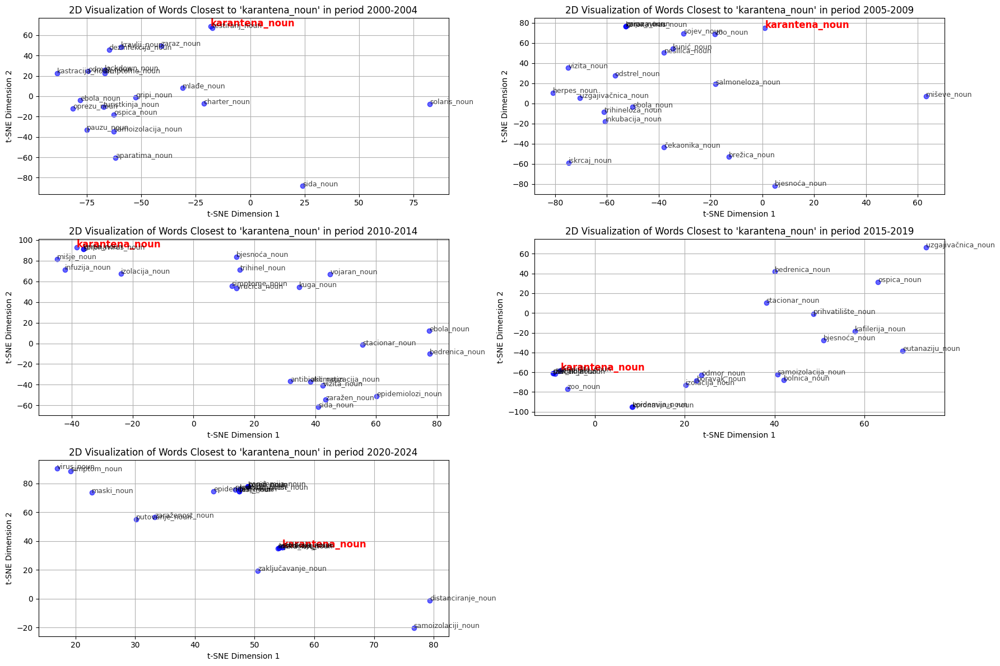




Word: cijepljenje_noun
Most similar to cijepljenje_noun in wave 1 are  ['pacijenata_noun', 'zajednici_noun', 'bjesnoća_noun', 'livaja_noun', 'masovno_noun', 'gmo_noun', 'sutra_noun', 'ospica_noun', 'zdravlj_noun', 'zanimljiviji_noun', 'ljudima_noun', 'covid_noun', 'dalmacije_noun', 'pcr_noun', 'zlostavljanja_noun', 'države_noun', 'oboljelih_noun', 'lijeka_noun', 'aktivni_noun', 'smatraju_noun']
Most similar to cijepljenje_noun in wave 2 are  ['gradovima_noun', 'difterija_noun', 'sojev_noun', 'cjepivo_noun', 'ospica_noun', 'inkubacija_noun', 'klamidija_noun', 'bjesnoća_noun', 'kontraindikacija_noun', 'livaja_noun', 'interferon_noun', 'covid_noun', 'sterilizacija_noun', 'nuspojava_noun', 'koronavirus_noun', 'masovno_noun', 'zajednici_noun', 'krpelj_noun', 'ebola_noun', 'peraditi_noun']
Most similar to cijepljenje_noun in wave 3 are  ['ospica_noun', 'difterija_noun', 'bjesnoća_noun', 'koronavirusa_noun', 'cjepiva_noun', 'hepatitis_noun', 'imunost_noun', 'masovno_noun', 'gradovima_noun'

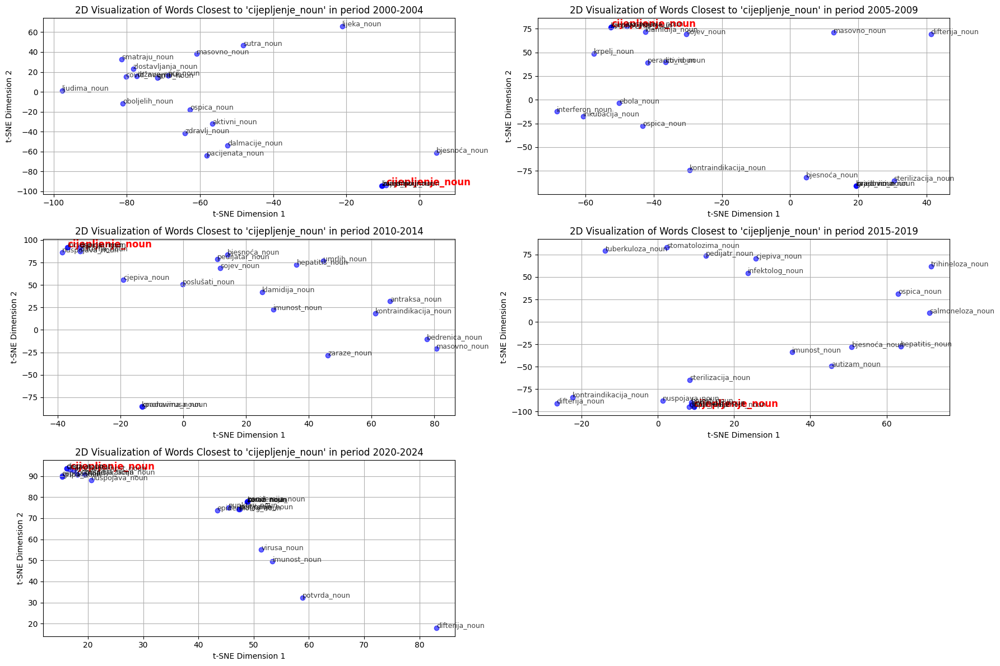




Word: izolacija_noun
Most similar to izolacija_noun in wave 1 are  ['lockdown_noun', 'ostajanje_noun', 'napetoste_noun', 'izvjesnost_noun', 'stubok_noun', 'normaliziranje_noun', 'spirala_noun', 'činitelj_noun', 'zagušenost_noun', 'karantena_noun', 'izazoviti_noun', 'odumiranje_noun', 'transmisija_noun', 'zadah_noun', 'naseljavanje_noun', 'otežavanje_noun', 'signala_noun', 'svrstavati_noun', 'niči_noun', 'grozota_noun']
Most similar to izolacija_noun in wave 2 are  ['sukobljavanje_noun', 'stresov_noun', 'šokov_noun', 'vakuum_noun', 'nestabilnost_noun', 'udaljavanje_noun', 'ljuljanje_noun', 'ukućanin_noun', 'sterilnost_noun', 'tlačenje_noun', 'neizbježnost_noun', 'stigmatizacija_noun', 'samilost_noun', 'giljotina_noun', 'izbjeglic_noun', 'potiskivanje_noun', 'znaci_noun', 'amerikanizacija_noun', 'podložnost_noun', 'tjeranje_noun']
Most similar to izolacija_noun in wave 3 are  ['ugodnost_noun', 'zid_noun', 'skučenost_noun', 'komfor_noun', 'ventilacija_noun', 'prokišnjavanje_noun', 'bor

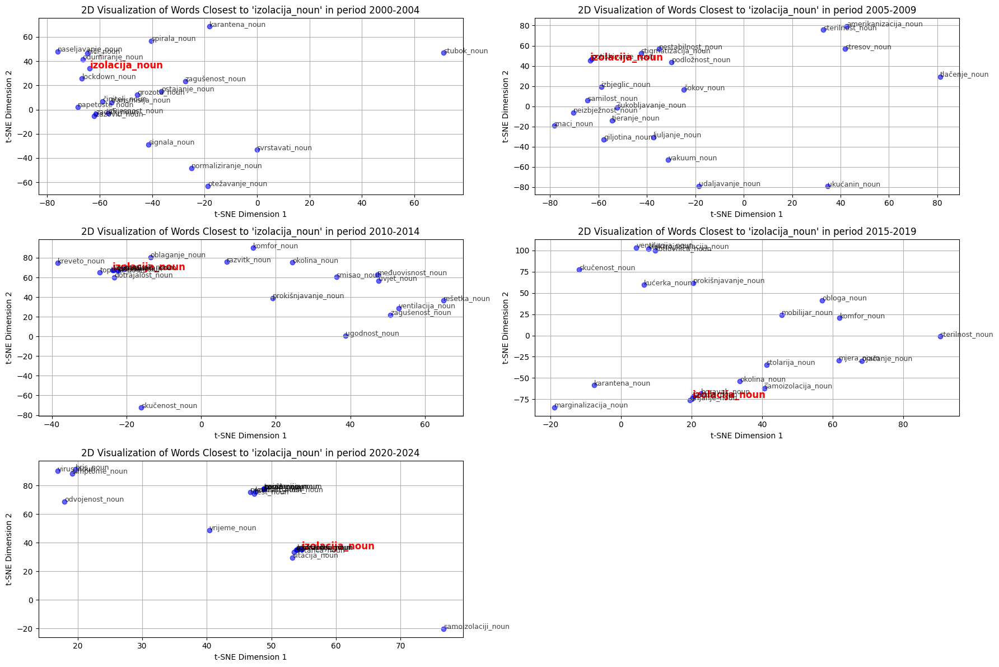




Word: antitijela_noun
Most similar to antitijela_noun in wave 1 are  ['koron_noun', 'retrovirus_noun', 'klamidija_noun', 'cjepiv_noun', 'herpes_noun', 'ciroza_noun', 'ćelavost_noun', 'sifilisa_noun', 'bolestima_noun', 'psorijaza_noun', 'kvržica_noun', 'imunost_noun', 'patogen_noun', 'sojev_noun', 'žilo_noun', 'ebola_noun', 'limfom_noun', 'marker_noun', 'miokard_noun', 'inhibitor_noun']
Most similar to antitijela_noun in wave 2 are  []
Most similar to antitijela_noun in wave 3 are  ['prion_noun', 'protutijelo_noun', 'kancerogen_noun', 'retrovirus_noun', 'virusi_noun', 'salmoneloza_noun', 'hemoglobin_noun']
Most similar to antitijela_noun in wave 4 are  ['protutijelo_noun', 'retrovirus_noun', 'imunost_noun']
Most similar to antitijela_noun in wave 5 are  ['imunost_noun', 'mutacija_noun', 'virus_noun', 'interferon_noun', 'patogen_noun', 'infekcija_noun', 'soj_noun', 'molekula_noun', 'herpes_noun', 'protein_noun', 'enzim_noun', 'bakterija_noun', 'spika_noun', 'organizam_noun']


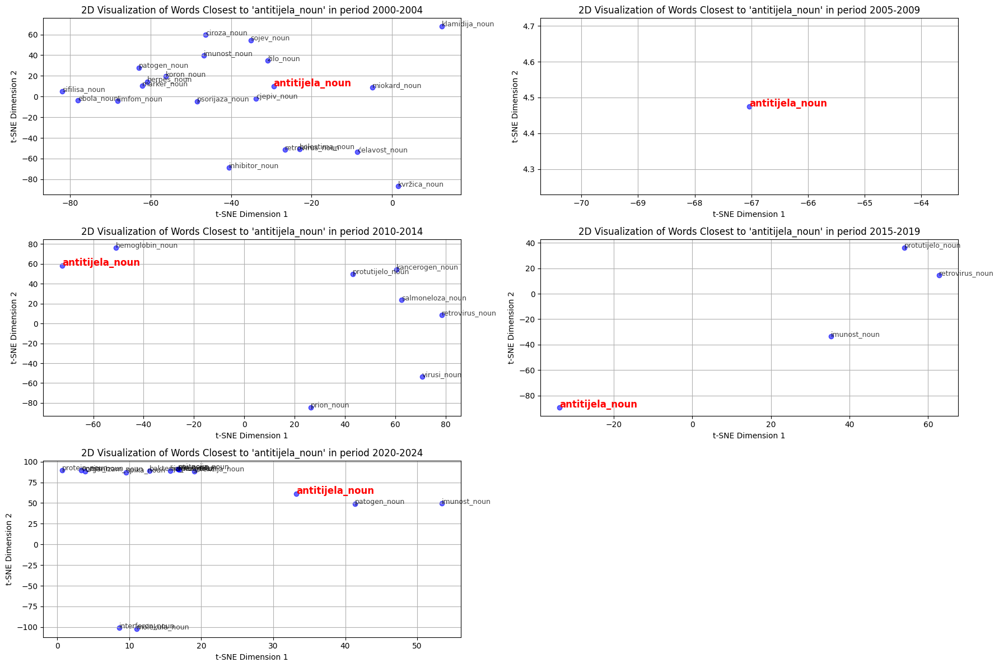




Word: mutacija_noun
Most similar to mutacija_noun in wave 1 are  ['akrilamid_noun', 'herpes_noun', 'aspirin_noun', 'retrovirus_noun', 'klamidija_noun', 'ćelavost_noun', 'estrogen_noun', 'kromosom_noun', 'patogen_noun', 'nuspojava_noun', 'enz_noun', 'celulit_noun', 'fetus_noun', 'gastritis_noun', 'cjepiv_noun', 'kofein_noun', 'kvržica_noun', 'neuron_noun', 'krvotok_noun', 'demencija_noun']
Most similar to mutacija_noun in wave 2 are  ['ebola_noun', 'kromosom_noun', 'sifilisa_noun', 'patogen_noun', 'retrovirus_noun', 'klamidija_noun', 'tuberkuloz_noun', 'encefalopatija_noun', 'imunost_noun', 'gljivica_noun', 'prion_noun', 'ospica_noun', 'virolog_noun', 'gojaznost_noun', 'malformacija_noun', 'degeneracija_noun', 'pojavnost_noun', 'melanom_noun', 'fibroza_noun', 'inkubacija_noun']
Most similar to mutacija_noun in wave 3 are  ['kromosom_noun', 'sojev_noun', 'ateroskleroza_noun', 'degeneracija_noun', 'retrovirus_noun', 'klamidija_noun', 'defekt_noun', 'prion_noun', 'preživljenje_noun', 'p

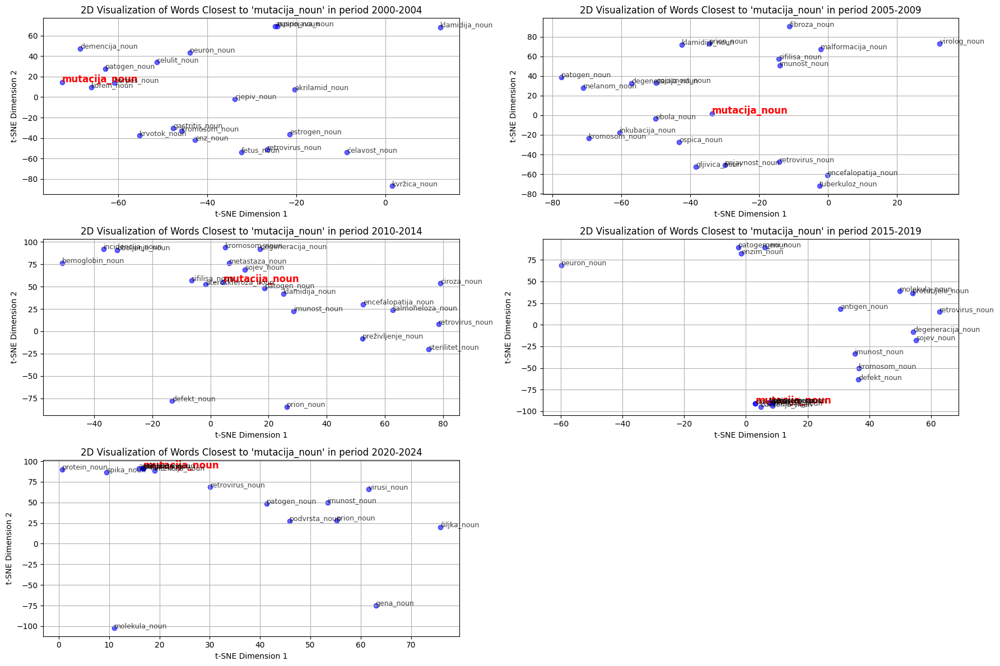




Word: varijanta_noun
Most similar to varijanta_noun in wave 1 are  ['opcija_noun', 'kalkulator_noun', 'mogućnost_noun', 'solucija_noun', 'isplativa_noun', 'narančast_noun', 'opipavanje_noun', 'onomu_noun', 'navada_noun', 'dolastak_noun', 'kapitalac_noun', 'tumačenj_noun', 'zone_noun', 'slučaj_noun', 'bolja_noun', 'motorizacija_noun', 'zagovornici_noun', 'inačica_noun', 'stvarčica_noun', 'halo_noun']
Most similar to varijanta_noun in wave 2 are  ['opcija_noun', 'solucija_noun', 'alternativa_noun', 'mogućnost_noun', 'verzija_noun', 'formacija_noun', 'postavka_noun', 'modifikacija_noun', 'jednadžba_noun', 'način_noun', 'automatizam_noun', 'ideja_noun', 'rješenje_noun', 'tip_noun', 'blaža_noun', 'inačica_noun', 'sklonija_noun', 'taktika_noun', 'matrica_noun', 'kraćenje_noun']
Most similar to varijanta_noun in wave 3 are  ['opcija_noun', 'solucija_noun', 'verzija_noun', 'inačica_noun', 'alternativa_noun', 'vrsta_noun', 'mogućnost_noun', 'rješenje_noun', 'kombiniranje_noun', 'ideja_noun',

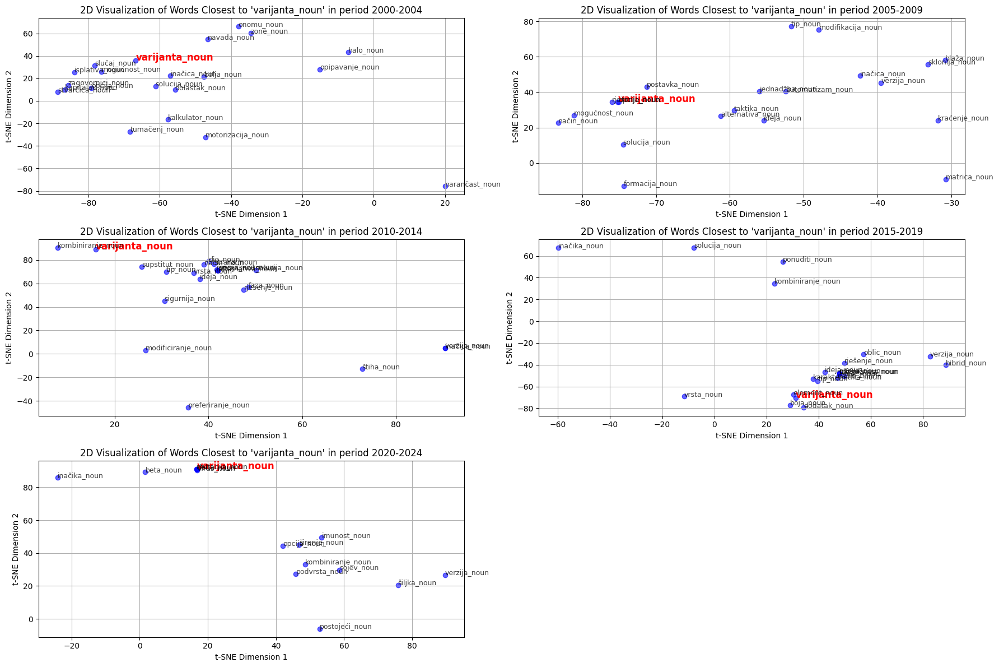




Word: pcr_noun
Most similar to pcr_noun in wave 1 are  ['detekcija_noun', 'klamidija_noun', 'biopsija_noun', 'algoritme_noun', 'okulist_noun', 'jajnik_noun', 'defibrilator_noun', 'serum_noun', 'marker_noun', 'limfom_noun', 'encefalopatija_noun', 'punkcija_noun', 'imunost_noun', 'retrovirus_noun', 'bris_noun', 'virusa_noun', 'ispitanic_noun', 'sifilisa_noun', 'hepatitis_noun', 'tuberkuloz_noun']
Most similar to pcr_noun in wave 2 are  ['fibrilacija_noun', 'encefalopatija_noun', 'citostatik_noun', 'patogen_noun', 'sojev_noun', 'difterija_noun', 'endokrinologija_noun', 'retrovirus_noun', 'algoritme_noun', 'antigen_noun', 'embriologija_noun', 'dijagnosticiranje_noun', 'imunologija_noun', 'inhibitor_noun', 'gene_noun', 'mikrobiologija_noun', 'kontraindikacija_noun', 'analizom_noun', 'toksičnost_noun', 'sifilisa_noun']
Most similar to pcr_noun in wave 3 are  ['carin_noun', 'pošiljaka_noun', 'klamidija_noun', 'bris_noun', 'dijagnostica_noun', 'salmoneloza_noun', 'citostatik_noun', 'protuti

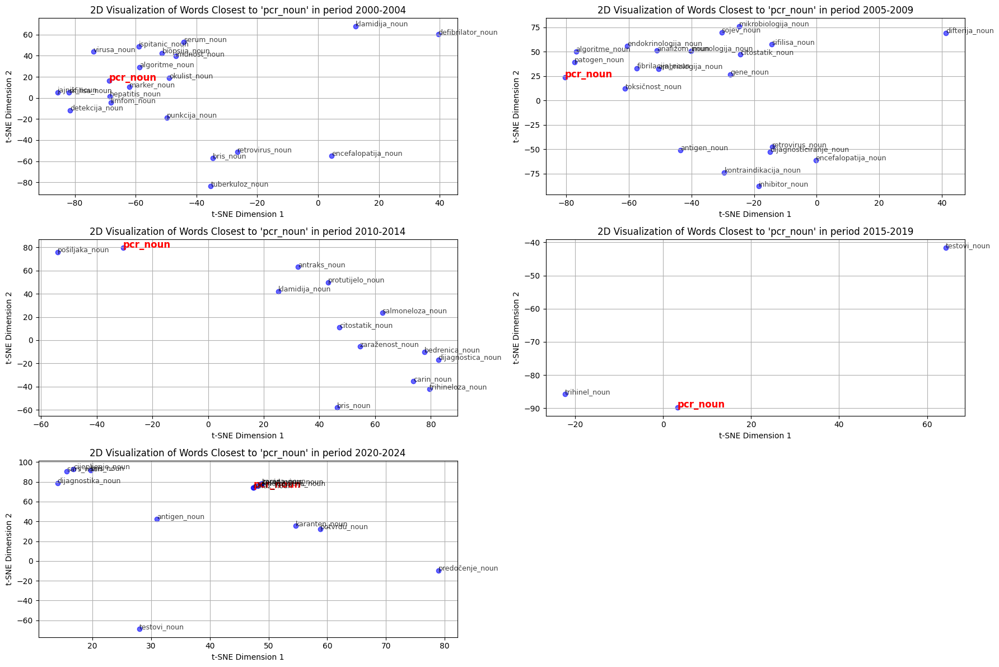




Word: hospitalizacija_noun
Most similar to hospitalizacija_noun in wave 1 are  ['kontraindikacija_noun', 'amputacija_noun', 'hemodijalizi_noun', 'zatajenje_noun', 'tlakaš_noun', 'kamenac_noun', 'gušterač_noun', 'ultrazvukom_noun', 'sljepoća_noun', 'atrofija_noun', 'fibrilacija_noun', 'dehidracija_noun', 'upal_noun', 'miokard_noun', 'sepsa_noun', 'serum_noun', 'anamneza_noun', 'okulist_noun', 'nesvjestica_noun', 'aritmija_noun']
Most similar to hospitalizacija_noun in wave 2 are  ['anamneza_noun', 'koronarografija_noun', 'uputnica_noun', 'ginekologa_noun', 'miokard_noun', 'oboljenj_noun', 'antibiotic_noun', 'traumatologiju_noun', 'gastroenterologija_noun', 'nesvjestica_noun', 'popovača_noun', 'pacijent_noun', 'okulist_noun', 'šećeraš_noun', 'protuotrov_noun', 'vrućica_noun', 'poroda_noun', 'punkcija_noun', 'infektolog_noun', 'embolija_noun']
Most similar to hospitalizacija_noun in wave 3 are  ['miokard_noun', 'hemodijalize_noun', 'traumatologiju_noun', 'pacijentica_noun', 'liječnik_n

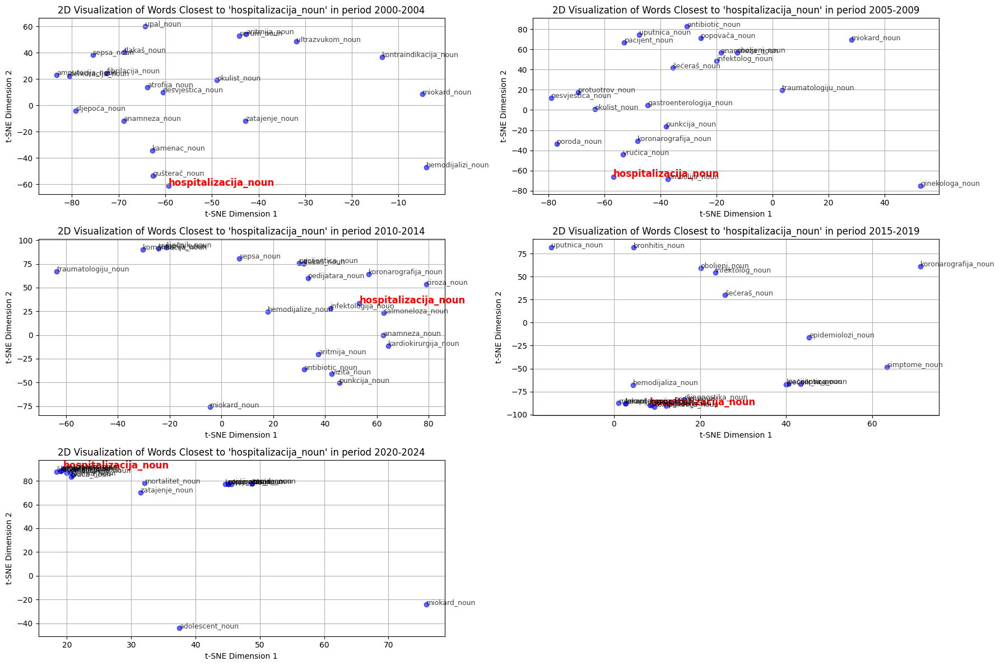




Word: eksponencijalan_adj
Most similar to eksponencijalan_adj in wave 1 are  ['incidencija_noun', 'lockdown_noun', 'virusa_noun', 'koronakriza_noun', 'melanom_noun', 'retrovirus_noun', 'mortalitet_noun', 'klamidija_noun', 'transmisija_noun', 'kastracija_noun', 'toksičnost_noun', 'sifilisa_noun', 'samoizolacija_noun', 'epidemiolozi_noun', 'rizic_noun', 'pojavnost_noun', 'imunost_noun', 'zaraz_noun', 'navik_noun', 'gojaznost_noun']
Most similar to eksponencijalan_adj in wave 2 are  ['europodručje_noun', 'lockdown_noun', 'generiranje_noun', 'fertilitet_noun', 'koron_noun', 'konvergencija_noun', 'dinamiziranje_noun', 'startup_noun', 'smanjenjem_noun', 'supstitucija_noun', 'proizvodnost_noun']
Most similar to eksponencijalan_adj in wave 3 are  ['koronakriza_noun', 'razvitk_noun', 'dinamiziranje_noun', 'dosezanje_noun', 'privremen_noun', 'gojaznost_noun', 'imunost_noun', 'europodručje_noun']
Most similar to eksponencijalan_adj in wave 4 are  ['rast_noun', 'koronakriza_noun', 'predviđanje_

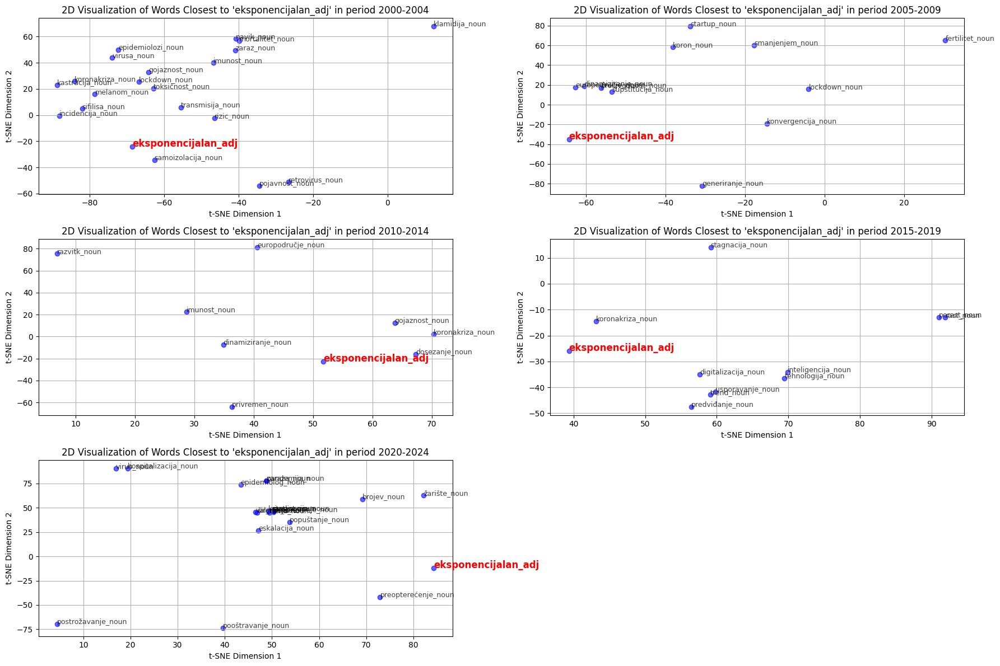




Word: ventilacija_noun
Most similar to ventilacija_noun in wave 1 are  ['roleta_noun', 'umivaonik_noun', 'okno_noun', 'armatura_noun', 'jacuzzi_noun', 'klimatizacija_noun', 'šaht_noun', 'lift_noun', 'najlon_noun', 'varenje_noun', 'sušilica_noun', 'utor_noun', 'krovov_noun', 'kišnica_noun', 'ličenje_noun', 'limarija_noun', 'odvod_noun', 'bušilica_noun', 'brisač_noun', 'vijak_noun']
Most similar to ventilacija_noun in wave 2 are  ['klimatizacija_noun', 'liftov_noun', 'ličenje_noun', 'limarija_noun', 'obloga_noun', 'kišnica_noun', 'katov_noun', 'drenaža_noun', 'dotrajalost_noun', 'odvod_noun', 'dovod_noun', 'potkrovlju_noun', 'štekat_noun', 'uređaja_noun', 'zastarjel_noun', 'jacuzzi_noun', 'smočnica_noun', 'pleksiglas_noun', 'filtriranje_noun', 'ljepilo_noun']
Most similar to ventilacija_noun in wave 3 are  ['klimatizacija_noun', 'cijevi_noun', 'elektroinstalacija_noun', 'oblaganje_noun', 'varenje_noun', 'otvor_noun', 'sušilica_noun', 'grijanje_noun', 'instalater_noun', 'radijator_noun

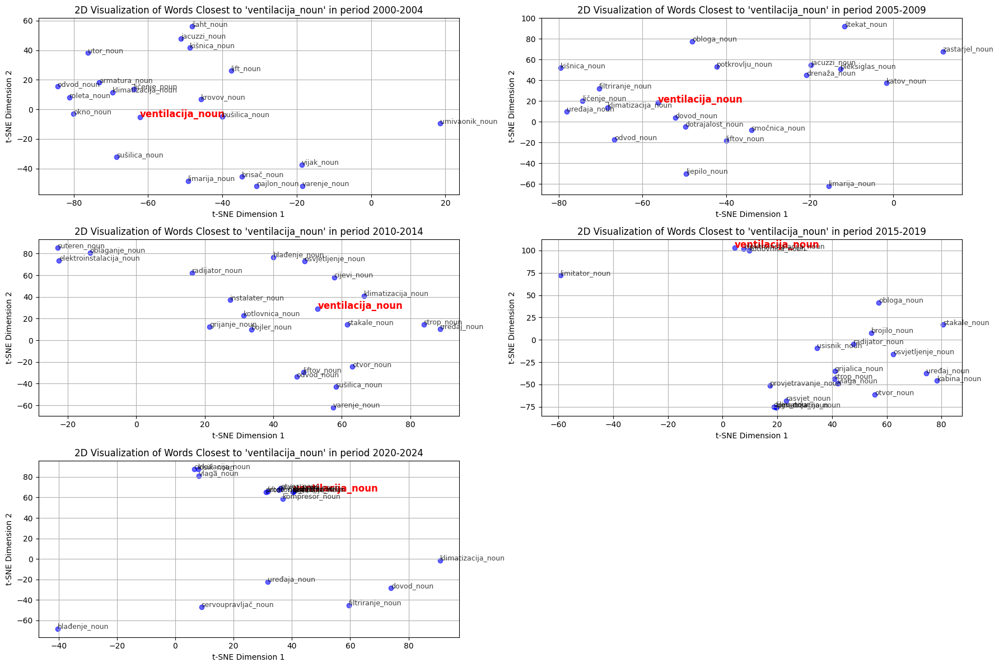




Word: zaražen_adj
Most similar to zaražen_adj in wave 1 are  ['sars_noun', 'hiv_noun', 'ospica_noun', 'trihinel_noun', 'umrlih_noun', 'ebola_noun', 'tuberkuloza_noun', 'incidencija_noun', 'hepatitis_noun', 'sifilisa_noun', 'malarija_noun', 'inkubacija_noun', 'hemodijalizi_noun', 'uzročnik_noun', 'encefalopatija_noun', 'soj_noun', 'mišje_noun', 'limfom_noun', 'melanom_noun', 'kravlje_noun']
Most similar to zaražen_adj in wave 2 are  ['ebola_noun', 'hiv_noun', 'sars_noun', 'salmoneloza_noun', 'bjesnoća_noun', 'sifilisa_noun', 'kolera_noun', 'bedrenica_noun', 'ospica_noun', 'inkubacija_noun', 'trihinel_noun', 'klamidija_noun', 'krpelj_noun', 'bris_noun', 'kuga_noun', 'gripi_noun', 'meningitis_noun', 'tuberkuloza_noun', 'tifus_noun', 'encefalopatija_noun']
Most similar to zaražen_adj in wave 3 are  ['ebola_noun', 'hiv_noun', 'bedrenica_noun', 'sars_noun', 'klamidija_noun', 'salmoneloza_noun', 'virusi_noun', 'umrlih_noun', 'herpes_noun', 'sifilis_noun', 'patogen_noun', 'prion_noun', 'kol

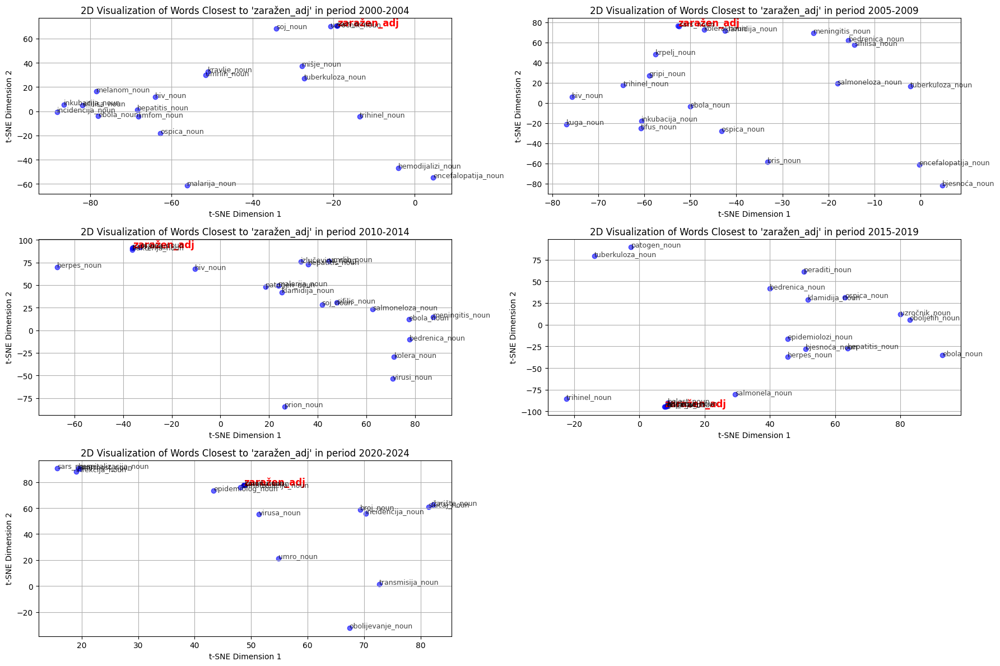




Word: who_propn
Most similar to who_propn in wave 1 are  ['sars_noun', 'tuberkuloza_noun', 'svjetska_noun', 'ebola_noun', 'hepatitis_noun', 'koler_noun', 'aids_noun', 'pandemija_noun', 'malarija_noun', 'ospica_noun', 'umrlih_noun', 'kong_noun', 'sifilisa_noun', 'vijetnam_noun', 'pluća_noun', 'virolog_noun', 'klamidija_noun', 'sida_noun', 'limfom_noun', 'hiv_noun']
Most similar to who_propn in wave 2 are  ['pandemija_noun', 'kolera_noun', 'ebola_noun', 'mutacija_noun', 'sars_noun', 'gripi_noun', 'ospica_noun', 'virusi_noun', 'klimatolog_noun', 'epidemioloz_noun', 'sifilis_noun', 'difterija_noun', 'patogen_noun', 'zaraza_noun', 'smrtnost_noun', 'salmoneloza_noun', 'soj_noun', 'hepatitis_noun', 'incidencija_noun', 'hemisfera_noun']
Most similar to who_propn in wave 3 are  ['ebola_noun', 'tuberkuloza_noun', 'sars_noun', 'kolera_noun', 'aids_noun', 'hepatitis_noun', 'dijareja_noun', 'ospica_noun', 'pretilost_noun', 'pandemija_noun', 'sojev_noun', 'sifilisa_noun', 'smrtnost_noun', 'incide

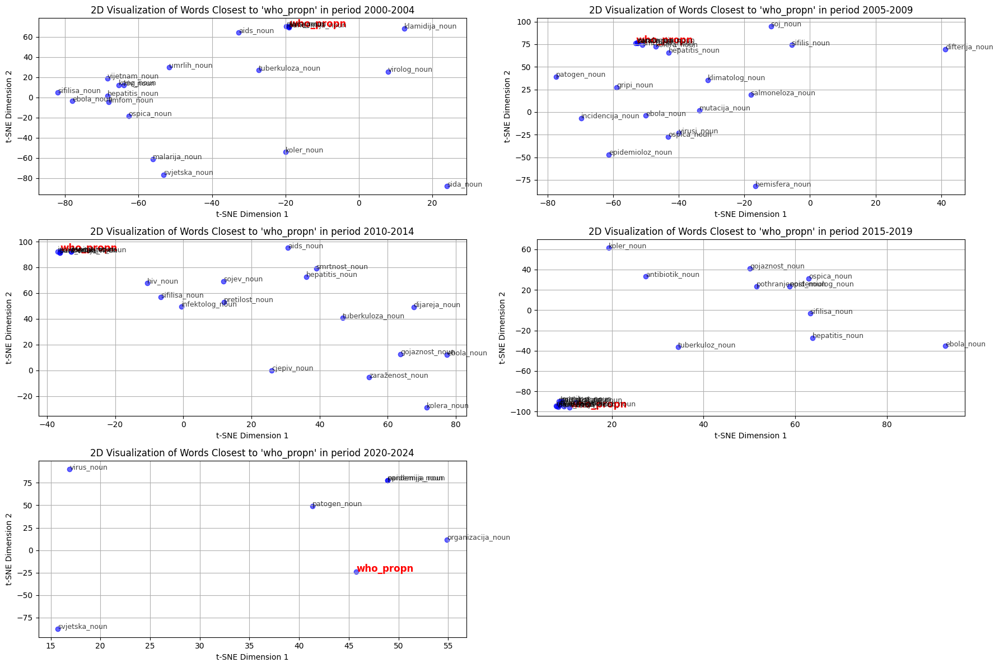




Word: cjepivo_noun
Most similar to cjepivo_noun in wave 1 are  ['serum_noun', 'hepatitis_noun', 'virusa_noun', 'mutacija_noun', 'inzulin_noun', 'malarija_noun', 'ebola_noun', 'sida_noun', 'aspirin_noun', 'ospica_noun', 'pcr_noun', 'nuspojava_noun', 'imunost_noun', 'bakterija_noun', 'interferon_noun', 'limfom_noun', 'kemoterapija_noun', 'citostatik_noun', 'dioksin_noun', 'osteoporoza_noun']
Most similar to cjepivo_noun in wave 2 are  ['nuspojava_noun', 'ospica_noun', 'difterija_noun', 'cijepljenje_noun', 'interferon_noun', 'pandemija_noun', 'doza_noun', 'serum_noun', 'lijekovi_noun', 'ebola_noun', 'patogen_noun', 'virusi_noun', 'placebo_noun', 'klamidija_noun', 'inkubacija_noun', 'gripi_noun', 'infektolog_noun', 'djelotvornost_noun', 'imunost_noun', 'soj_noun']
Most similar to cjepivo_noun in wave 3 are  ['cijepljenje_noun', 'difterija_noun', 'hepatitis_noun', 'ospica_noun', 'interferon_noun', 'nuspojava_noun', 'ljek_noun', 'bjesnoća_noun', 'citostatik_noun', 'klamidija_noun', 'patog

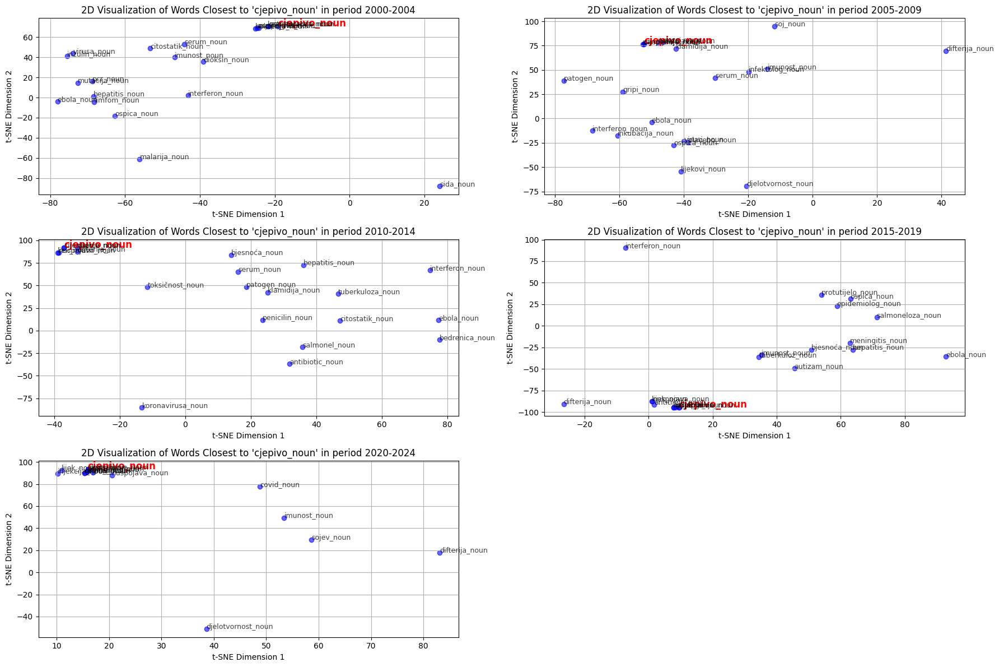

In [12]:
for target_word in [
    "korona_noun",
    "maska_noun",   
    "intenzivna_adj",
    "respirator_noun",
    "samoizolacija_noun",
    "pandemija_noun",
    "koronavirus_noun",
    "karantena_noun",
    "cijepljenje_noun",
    "izolacija_noun",
    "antitijela_noun",
    "mutacija_noun",
    "varijanta_noun",
    "pcr_noun",
    "hospitalizacija_noun",
    "eksponencijalan_adj",
    "ventilacija_noun",
    "zaražen_adj",
    "who_propn",
    "cjepivo_noun",
]:
    print(f"Word: {target_word}")
    print("==" * 20)
    plot_tsne_visualization(
        get_most_similar_by_pos(target_word, "noun", 1000, 200),
        target_word,
        periods,
        waves,
        period_labels={
            0: "2000-2004",
            1: "2005-2009",
            2: "2010-2014",
            3: "2015-2019",
            4: "2020-2024",
        },
    )
    print("\n\n")

### Technology drifters

In [28]:
tech_words = [
    "umjetan_adj",
    "inteligencija_noun",
    "ai_noun",
    "učenje_noun",
    "strojno_adj",
    "algoritam_noun",
    "podaci_noun",
    "podatak_noun",
    "računalo_noun",
    "automatizacija_noun",
    "robotika_noun",
    "chatbot_noun",
    "revolucija_noun",
    "etika_noun",
    "prava_adj",
    "objava_noun",
    "story_noun",
    "lajk_noun",
    "dijeljenje_noun",
    "share_noun",
    "označavanje_noun",
    "profil_noun",
    "praćenje_noun",
    "hashtag_noun",
    "ovisnost_noun",
    "bot_noun",
    "cyberbullying_noun",
    "mržnja_noun",
    "dezinformacija_noun",
    "privatnost_noun",
    "nadzor_noun",
    "influencer_noun",
    "viralan_adj",
    "selfie_noun",
    "mentalan_adj",
    "zdravlje_noun",
    "vjerodajnica_noun",
    "privola_noun",
    "aplikacija_noun",
    "primjena_noun",
    "viralan_adj",
    "poslužitelj_noun"
]

tech_words = set(tech_words)

for wave_index, word_counts_wave in enumerate(word_counts_separate):
    tech_word_count = sum(1 for word in tech_words if word in word_counts_wave)
    print(f"Number of words from the TECH words list in wave {wave_index + 1}: {tech_word_count}")

word_counts = []

for word in tech_words:
    counts = [word_counts_wave.get(word, 0) for word_counts_wave in word_counts_separate]
    word_counts.append(counts)
    print(f"{word}: {counts}")

tech_words = {word for i, word in enumerate(tech_words) if sum(word_counts[i]) >= 1000}

print("New length", len(tech_words))

Number of words from the TECH words list in wave 1: 41
Number of words from the TECH words list in wave 2: 41
Number of words from the TECH words list in wave 3: 41
Number of words from the TECH words list in wave 4: 41
Number of words from the TECH words list in wave 5: 41
story_noun: [11, 23, 50, 191, 798]
dijeljenje_noun: [200, 707, 4520, 11814, 20055]
influencer_noun: [33, 17, 63, 3864, 11402]
primjena_noun: [3366, 6727, 25171, 63508, 93008]
chatbot_noun: [2, 3, 20, 602, 4300]
računalo_noun: [1855, 6902, 28613, 45760, 48475]
označavanje_noun: [165, 355, 1103, 3395, 5859]
automatizacija_noun: [36, 51, 523, 3379, 5526]
dezinformacija_noun: [255, 483, 1657, 6361, 24953]
objava_noun: [2041, 6772, 32887, 126073, 293744]
algoritam_noun: [9, 18, 254, 1126, 2140]
lajk_noun: [35, 37, 1074, 5848, 9916]
zdravlje_noun: [5970, 16785, 79108, 172405, 357621]
mentalan_adj: [657, 2219, 9010, 25213, 68777]
hashtag_noun: [12, 14, 448, 2081, 2219]
poslužitelj_noun: [58, 118, 594, 1095, 2237]
inteligen

[('ai_noun', 0.7158440053462982), ('prava_adj', 0.714877724647522), ('poslužitelj_noun', 0.6705842912197113), ('selfie_noun', 0.660748615860939), ('hashtag_noun', 0.6431465595960617), ('story_noun', 0.6145486831665039), ('algoritam_noun', 0.5749845206737518), ('bot_noun', 0.5670568346977234), ('vjerodajnica_noun', 0.5635256767272949), ('chatbot_noun', 0.5310031473636627), ('viralan_adj', 0.5278126895427704), ('umjetan_adj', 0.5144928097724915), ('inteligencija_noun', 0.5067028999328613), ('označavanje_noun', 0.49866995215415955), ('privola_noun', 0.49588653445243835), ('dijeljenje_noun', 0.49169567227363586), ('influencer_noun', 0.49082231521606445), ('revolucija_noun', 0.47812777757644653), ('podaci_noun', 0.4736297130584717), ('etika_noun', 0.470263808965683)]


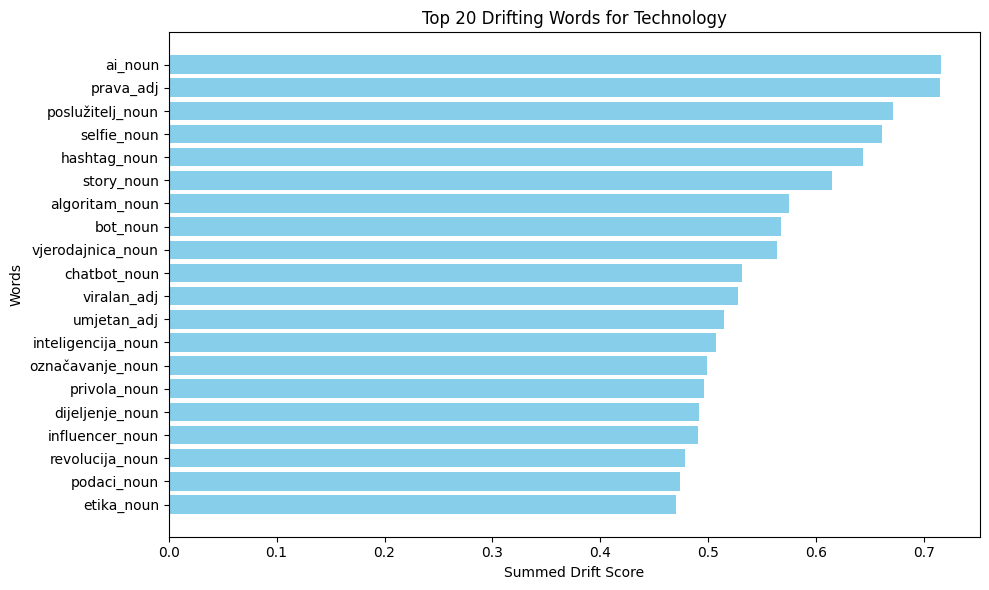

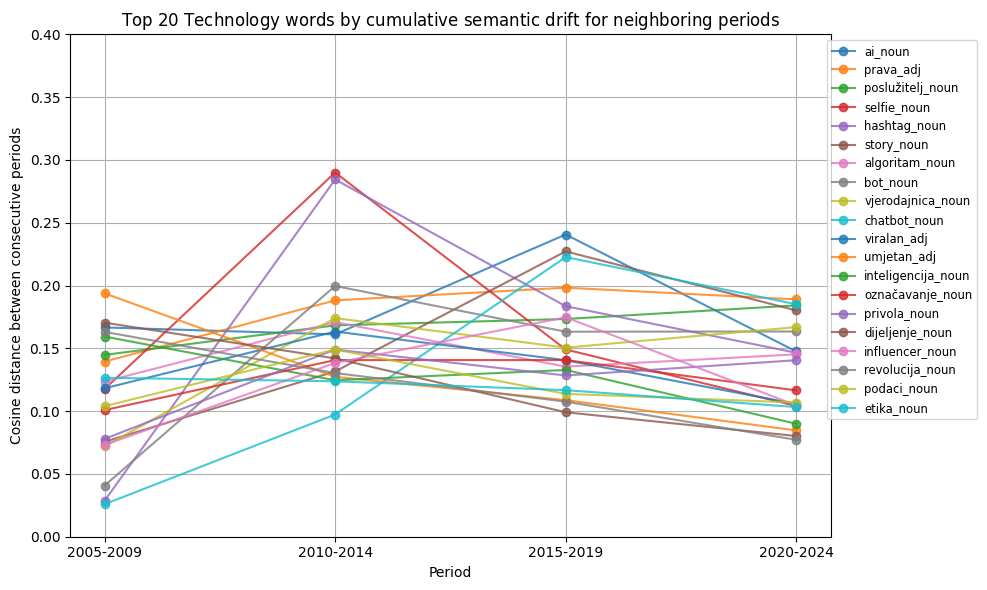

In [29]:
analyze_cumulative_drift(tech_words, "Technology")

### TOP 20 tech drifters surrounded by top 20 most similar words per wave

Word: ai_noun
Most similar to ai_noun in wave 1 are  ['malko_noun', 'samoobrani_noun', 'pravil_noun', 'preljuba_noun', 'objema_noun', 'nejak_noun', 'seksizam_noun', 'stupnjeve_noun', 'astrofizičar_noun', 'proturječnost_noun', 'hladnokrvnost_noun', 'dobričina_noun', 'direktiv_noun', 'euroskeptika_noun', 'lepršavost_noun', 'šablona_noun', 'distinkcija_noun', 'reklo_noun', 'tvrdo_noun', 'čes_noun']
Most similar to ai_noun in wave 2 are  ['špijunaži_noun', 'reporteri_noun', 'dosjea_noun', 'aktivistima_noun', 'vojnikinja_noun', 'džihadist_noun', 'zaključcima_noun', 'razoružavanje_noun', 'paper_noun', 'briefing_noun', 'regrutiranje_noun', 'sugovornicima_noun', 'videokonferencija_noun', 'pentagon_noun', 'dokumenti_noun', 'diplomata_noun', 'izvještave_noun', 'eksperti_noun', 'kcna_noun']
Most similar to ai_noun in wave 3 are  ['jevi_noun', 'procesuiranje_noun', 'neizručivanje_noun', 'hacker_noun', 'podnesc_noun', 'domazet_noun', 'suđenj_noun', 'militarizacija_noun']
Most similar to ai_noun in 

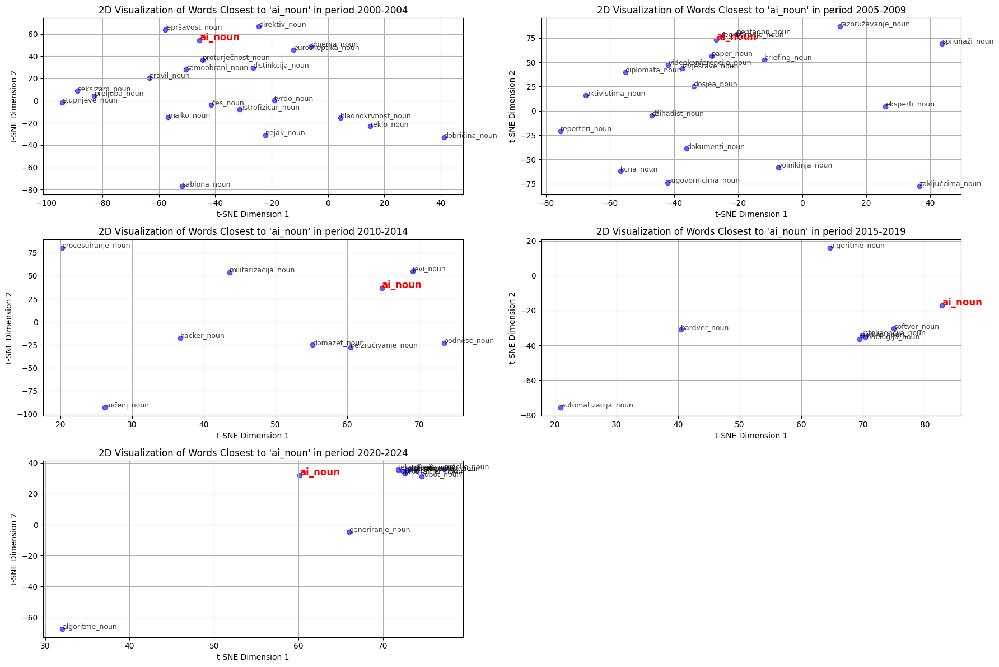




Word: prava_adj
Most similar to prava_adj in wave 1 are  ['žalopojka_noun', 'bolaj_noun', 'filozofiranje_noun', 'sukus_noun', 'gliba_noun', 'rasul_noun', 'cinik_noun', 'alibija_noun', 'razmišljanj_noun', 'zatvorenost_noun', 'motivator_noun', 'gungula_noun', 'samokritika_noun', 'ponajmanje_noun', 'anonimus_noun', 'defenziv_noun', 'fama_noun', 'globala_noun', 'pikanterija_noun', 'neuspjehe_noun']
Most similar to prava_adj in wave 2 are  ['žabokrečina_noun', 'kuknjava_noun', 'reklo_noun', 'bauk_noun', 'vjetrometina_noun', 'jalovost_noun', 'uzbuđenj_noun', 'poklapanje_noun', 'otud_noun', 'uistinu_noun', 'njima_noun', 'užurbanost_noun', 'situcija_noun', 'prespektiva_noun', 'očitija_noun', 'samozadovoljstvo_noun', 'potenciranje_noun', 'blef_noun', 'ushit_noun', 'smiraj_noun']
Most similar to prava_adj in wave 3 are  ['istina_noun', 'način_noun', 'hepiend_noun', 'smisao_noun', 'život_noun', 'jednak_noun', 'sintagmu_noun', 'uostal_noun', 'štošta_noun', 'bogme_noun', 'mada_noun', 'kakv_noun'

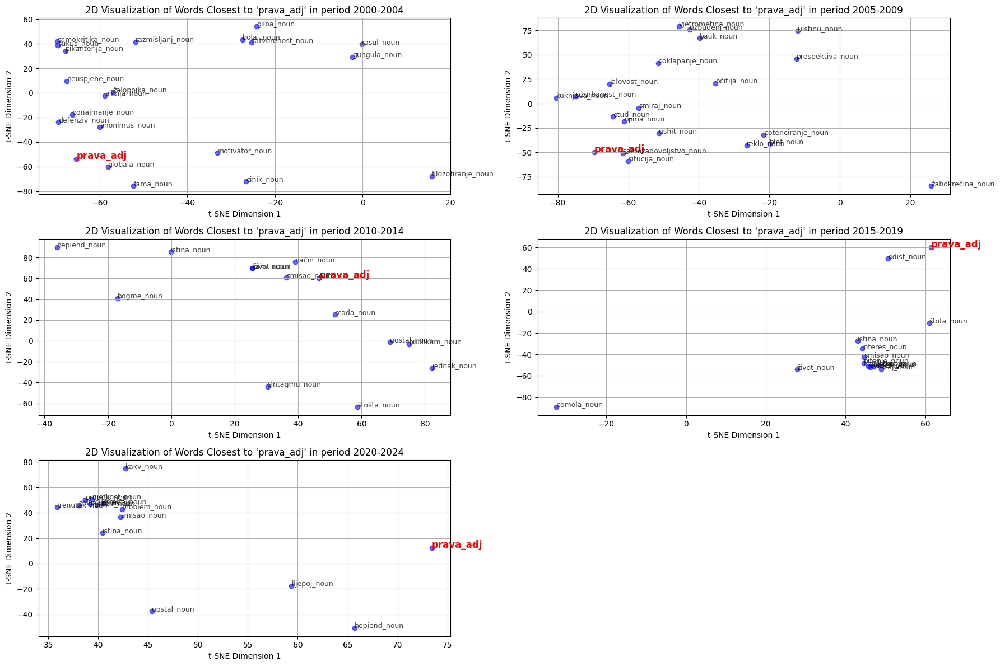




Word: poslužitelj_noun
Most similar to poslužitelj_noun in wave 1 are  ['operator_noun', 'pisač_noun', 'dlanovnik_noun', 'sučelje_noun', 'kopiranje_noun', 'halo_noun', 'lcd_noun', 'download_noun', 'usb_noun', 'streaming_noun', 'multimedija_noun', 'čitač_noun', 'učilica_noun', 'smart_noun', 'pružatelj_noun', 'originale_noun', 'čip_noun', 'vhs_noun', 'datoteka_noun', 'instaliranje_noun']
Most similar to poslužitelj_noun in wave 2 are  ['spravica_noun', 'pružatelj_noun', 'softwar_noun', 'pozivatelj_noun', 'kasetofon_noun', 'fotokopiranje_noun', 'unajmljivanje_noun', 'telefaks_noun', 'redovit_noun', 'lozinka_noun', 'hacker_noun', 'dlanovnik_noun', 'website_noun', 'kalkulator_noun', 'administrator_noun', 'adresar_noun', 'glačanje_noun', 'knjigovođa_noun', 'streaming_noun', 'sekretarica_noun']
Most similar to poslužitelj_noun in wave 3 are  ['dlanovnik_noun', 'računalo_noun', 'adresar_noun', 'direktorij_noun', 'modem_noun', 'provider_noun', 'server_noun', 'internet_noun', 'datoteka_noun',

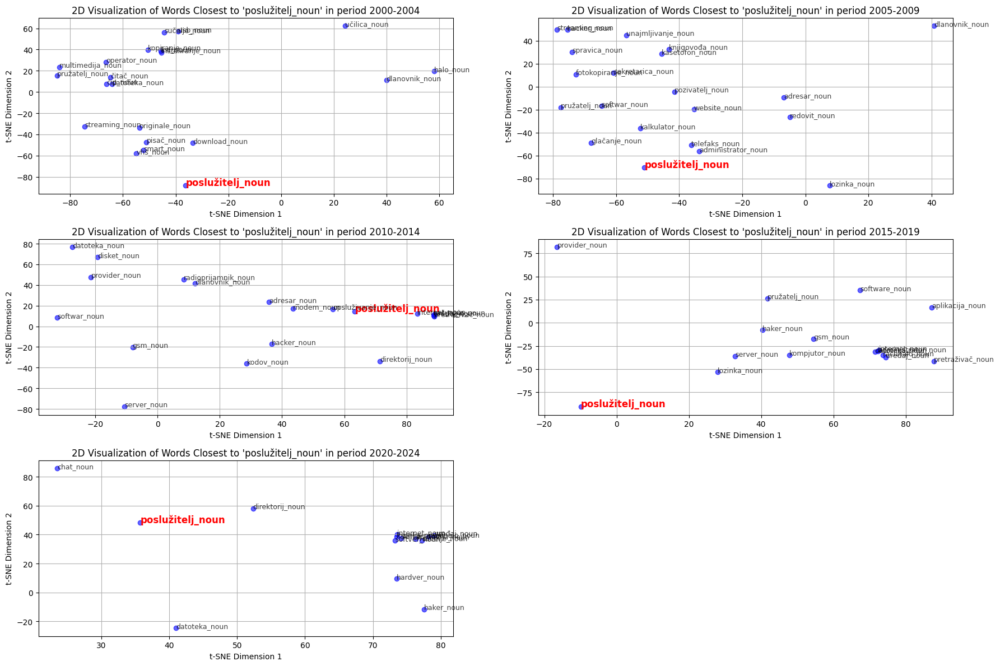




Word: selfie_noun
Most similar to selfie_noun in wave 1 are  ['emotikon_noun', 'grašo_noun']
Most similar to selfie_noun in wave 2 are  ['škvadra_noun', 'štofa_noun', 'podcast_noun', 'nečem_noun']
Most similar to selfie_noun in wave 3 are  ['poziranje_noun', 'bikinija_noun', 'mobitela_noun', 'profil_noun', 'twitter_noun', 'fotografije_noun', 'toples_noun', 'badić_noun', 'stražnjica_noun', 'youtubeu_noun', 'voajer_noun', 'videozapis_noun', 'blic_noun', 'obožavateljima_noun', 'emotikon_noun', 'autogram_noun']
Most similar to selfie_noun in wave 4 are  ['bikinija_noun', 'kamera_noun', 'badić_noun', 'tanga_noun', 'poljubac_noun', 'toples_noun', 'fotograf_noun', 'mobitel_noun', 'objektiv_noun', 'kupać_noun', 'videozapis_noun', 'fanov_noun', 'snimka_noun', 'obožavateljima_noun', 'emotikon_noun', 'autoportret_noun', 'poza_noun']
Most similar to selfie_noun in wave 5 are  ['poziranje_noun', 'badić_noun', 'prizor_noun', 'autogram_noun', 'pratitelj_noun', 'bikinija_noun', 'kamera_noun', 'foto

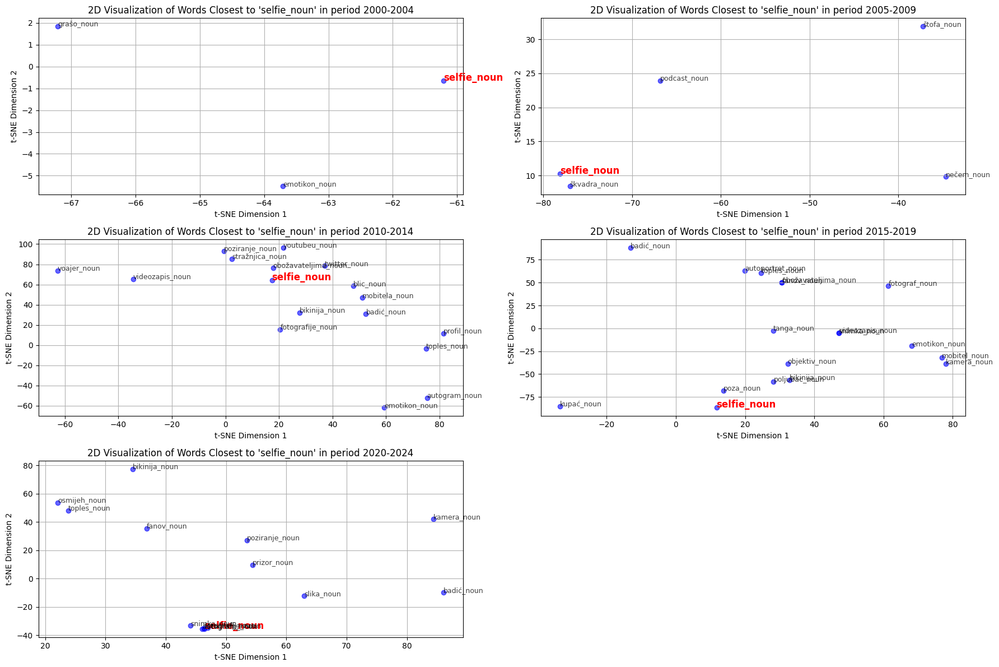




Word: hashtag_noun
Most similar to hashtag_noun in wave 1 are  []
Most similar to hashtag_noun in wave 2 are  []
Most similar to hashtag_noun in wave 3 are  ['twitter_noun', 'profil_noun', 'aplikacija_noun', 'emotikon_noun', 'lajk_noun', 'blog_noun', 'link_noun', 'mailing_noun', 'fotka_noun', 'videe_noun', 'stranica_noun', 'kriptovaluta_noun', 'internet_noun', 'youtubeu_noun', 'website_noun', 'podcast_noun', 'korisnik_noun', 'forumima_noun', 'tražilica_noun']
Most similar to hashtag_noun in wave 4 are  ['pratitelj_noun', 'profil_noun', 'twitter_noun', 'emotikon_noun', 'fotografija_noun', 'lajk_noun', 'post_noun', 'videe_noun', 'mreža_noun', 'stranicu_noun', 'slogan_noun']
Most similar to hashtag_noun in wave 5 are  ['emotikon_noun', 'lajk_noun', 'videozapis_noun', 'profil_noun', 'objava_noun', 'twitter_noun', 'fotografija_noun', 'slogan_noun', 'pratiteljica_noun', 'opis_noun', 'youtubeu_noun', 'isječki_noun']


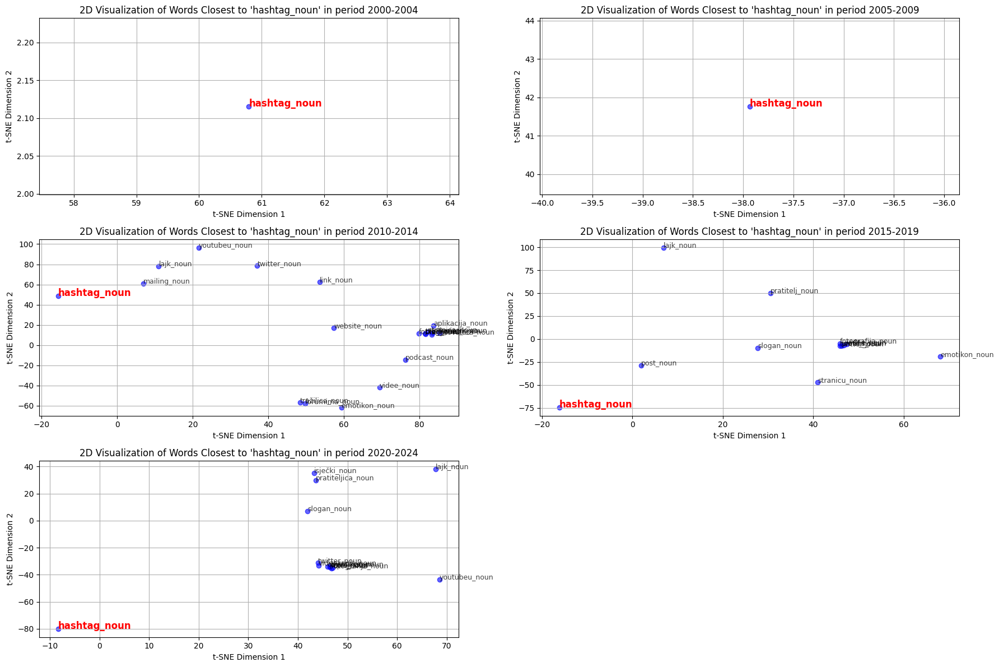




Word: story_noun
Most similar to story_noun in wave 1 are  []
Most similar to story_noun in wave 2 are  []
Most similar to story_noun in wave 3 are  []
Most similar to story_noun in wave 4 are  ['fotografija_noun', 'videe_noun', 'fanov_noun', 'obožavateljima_noun']
Most similar to story_noun in wave 5 are  ['profil_noun', 'pratitelj_noun', 'emotikon_noun', 'opis_noun', 'videozapis_noun', 'fotomontaža_noun', 'obožavateljima_noun', 'isječki_noun', 'objaviti_noun', 'influencerica_noun', 'blog_noun', 'komentar_noun', 'fan_noun']


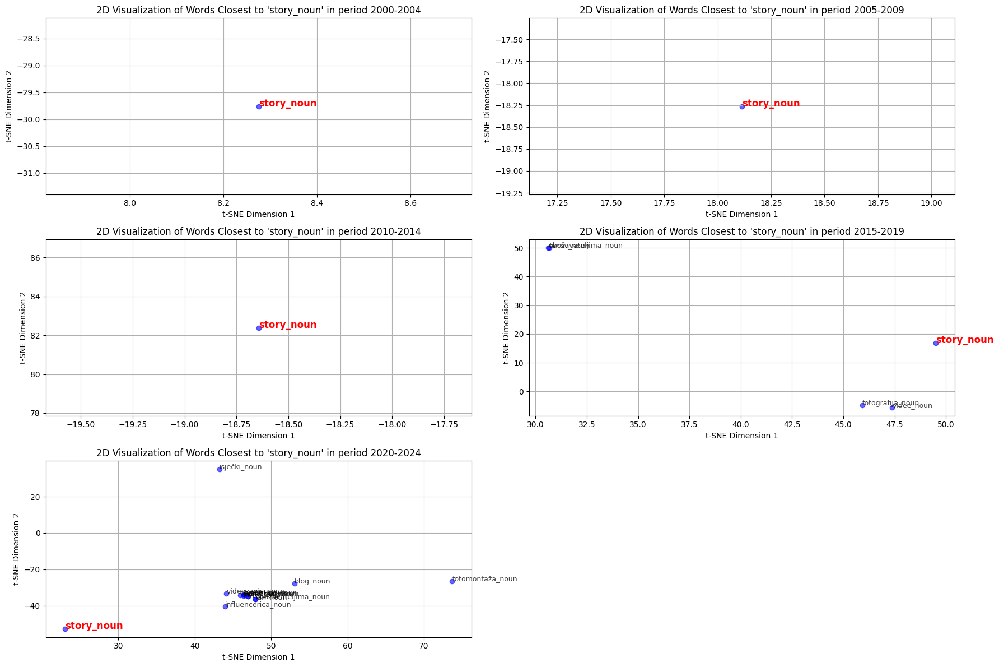




Word: algoritam_noun
Most similar to algoritam_noun in wave 1 are  ['adhd_noun']
Most similar to algoritam_noun in wave 2 are  ['startup_noun', 'institucionalizacija_noun', 'poučavanje_noun', 'muzejom_noun', 'populariziranje_noun', 'umnožavanje_noun', 'odist_noun', 'podučavanje_noun', 'vidov_noun', 'inženjerstvo_noun', 'koronakriza_noun', 'metodika_noun', 'kataloz_noun', 'konkuretnost_noun', 'tečajevi_noun', 'lockdown_noun', 'komunikologija_noun']
Most similar to algoritam_noun in wave 3 are  ['dekodiranje_noun', 'izračunavanje_noun', 'kartografija_noun', 'kodov_noun', 'softver_noun', 'slajd_noun', 'direktorij_noun', 'modeliranje_noun']
Most similar to algoritam_noun in wave 4 are  ['inteligencija_noun', 'softver_noun', 'tehnologija_noun', 'dekodiranje_noun', 'koncepat_noun', 'alat_noun']
Most similar to algoritam_noun in wave 5 are  ['inteligencija_noun', 'generiranje_noun', 'alat_noun', 'softver_noun', 'tehnologija_noun', 'sučelje_noun', 'automatizacija_noun']


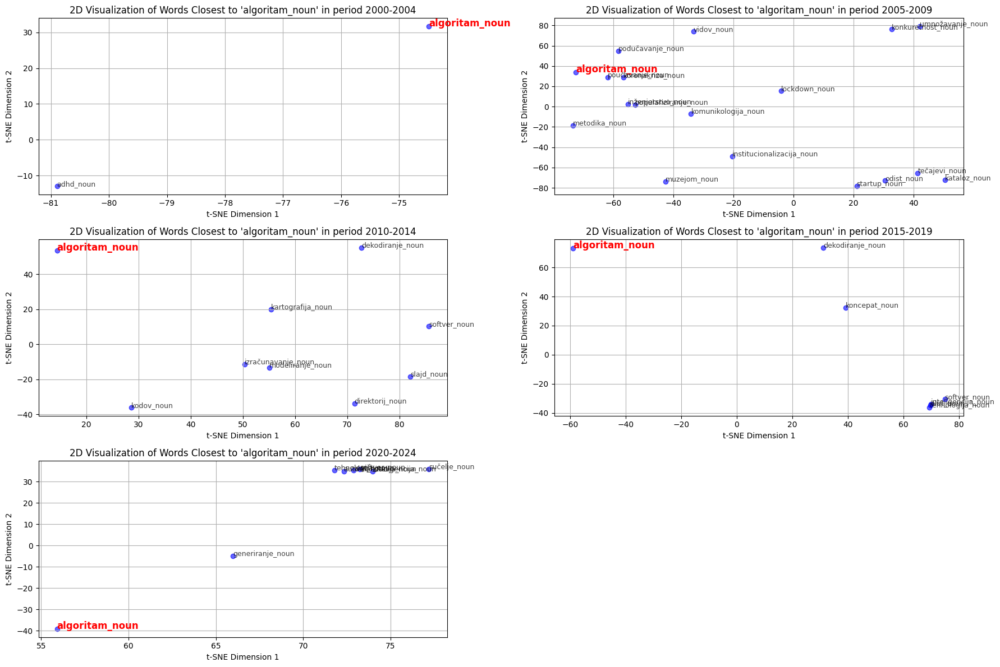




Word: bot_noun
Most similar to bot_noun in wave 1 are  []
Most similar to bot_noun in wave 2 are  []
Most similar to bot_noun in wave 3 are  ['hacker_noun', 'algoritme_noun', 'direktorij_noun', 'kriptovaluta_noun', 'dlanovnik_noun', 'kodov_noun', 'softver_noun', 'internet_noun', 'provider_noun', 'website_noun']
Most similar to bot_noun in wave 4 are  ['algoritme_noun', 'robot_noun', 'chat_noun', 'softver_noun', 'haker_noun', 'internet_noun']
Most similar to bot_noun in wave 5 are  ['algoritme_noun', 'internet_noun', 'hacker_noun', 'softver_noun', 'mailing_noun', 'manipulacija_noun', 'prevarant_noun', 'dezinformiranje_noun']


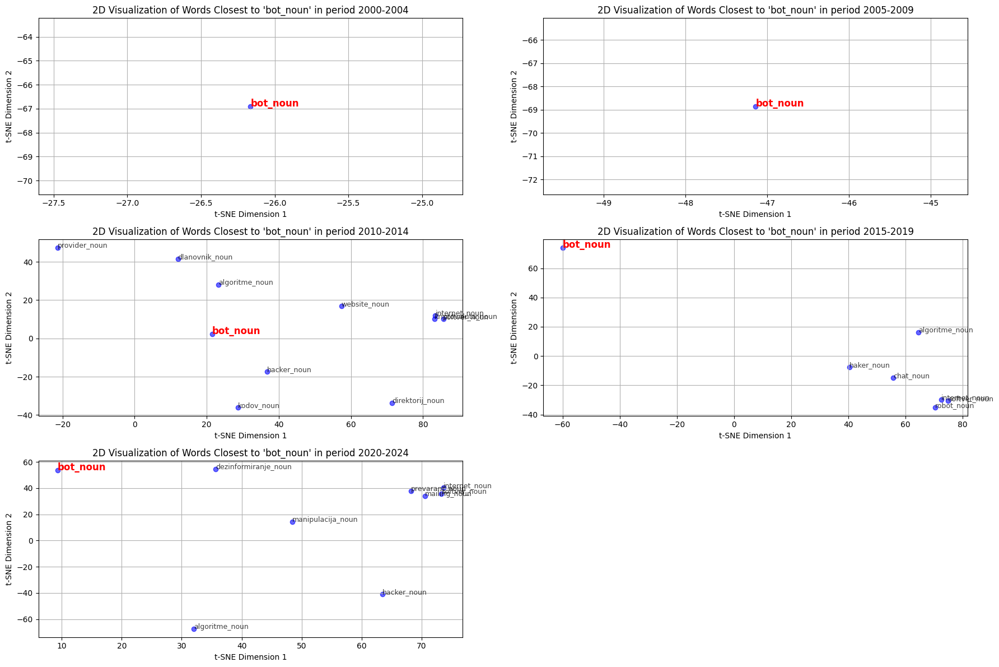




Word: vjerodajnica_noun
Most similar to vjerodajnica_noun in wave 1 are  ['otpravnik_noun', 'javier_noun', 'delegacije_noun', 'diplomata_noun', 'brzojav_noun', 'putin_noun', 'monsinjor_noun', 'samit_noun', 'doručk_noun', 'ataše_noun', 'emir_noun', 'pozdrava_noun', 'sobranje_noun', 'kongresnik_noun', 'odlikovanje_noun', 'ambasador_noun', 'rabina_noun', 'parlamentarc_noun', 'telegram_noun', 'useljeništvo_noun']
Most similar to vjerodajnica_noun in wave 2 are  ['otpravnik_noun', 'kolind_noun', 'diplomata_noun', 'useljeništvo_noun', 'podtajnik_noun', 'parafiranje_noun', 'ataše_noun', 'konzulica_noun', 'kancelarke_noun', 'ministrika_noun', 'veleposlanica_noun', 'internacionale_noun', 'nuncijatura_noun', 'uručivanje_noun', 'primateljica_noun', 'supotpis_noun', 'delegacije_noun', 'briefing_noun', 'javier_noun', 'povelje_noun']
Most similar to vjerodajnica_noun in wave 3 are  ['telefaks_noun', 'adresar_noun', 'ovjera_noun', 'fotokopija_noun', 'tiskanica_noun', 'pismeno_noun', 'formular_noun

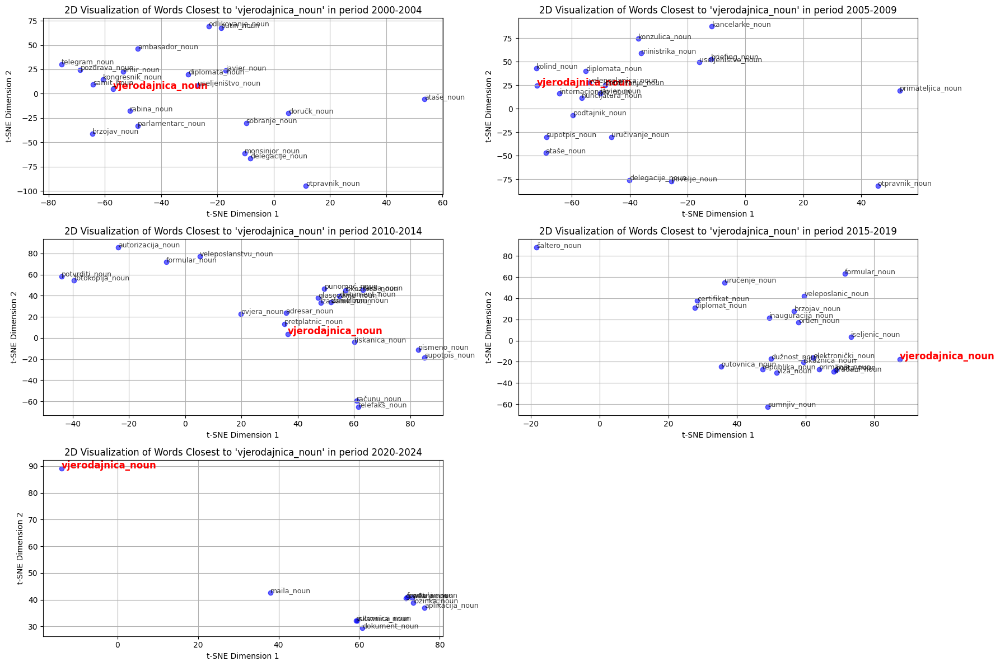




Word: chatbot_noun
Most similar to chatbot_noun in wave 1 are  []
Most similar to chatbot_noun in wave 2 are  []
Most similar to chatbot_noun in wave 3 are  []
Most similar to chatbot_noun in wave 4 are  ['inteligencija_noun', 'sučelje_noun', 'aplikacija_noun', 'algoritme_noun']
Most similar to chatbot_noun in wave 5 are  ['inteligencija_noun', 'algoritme_noun', 'softver_noun', 'programer_noun', 'robot_noun', 'sučelje_noun', 'generiranje_noun', 'aplikacija_noun']


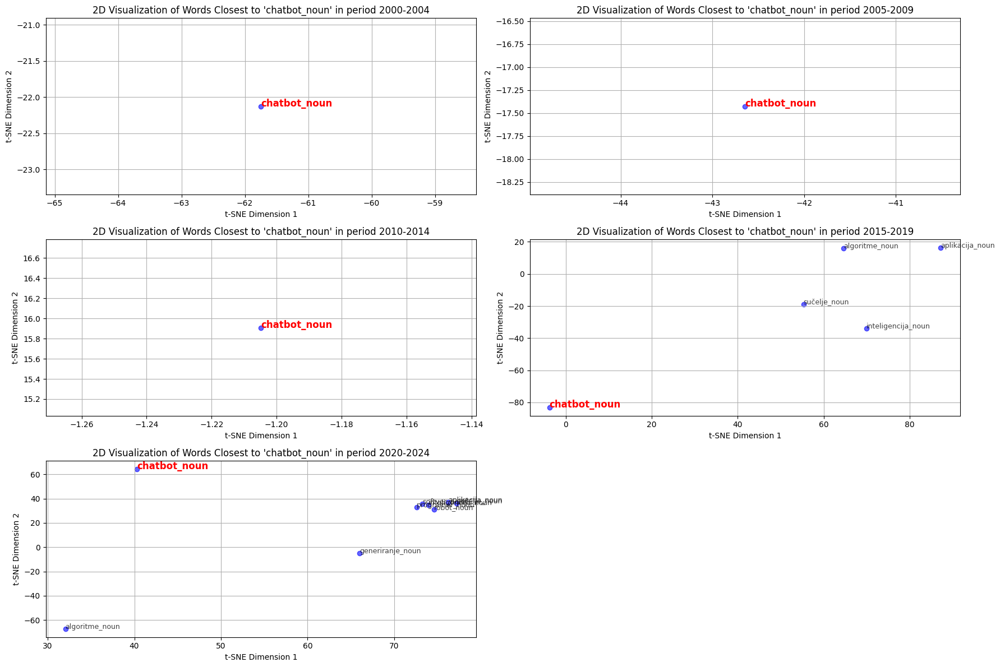




Word: viralan_adj
Most similar to viralan_adj in wave 1 are  ['fim_noun', 'lajk_noun', 'superjunak_noun', 'ken_noun', 'toples_noun', 'duplerica_noun', 'badić_noun', 'youtubeu_noun', 'naposlijetku_noun', 'gramofon_noun', 'bond_noun', 'influencerica_noun', 'posjetnica_noun', 'spodoba_noun', 'užitk_noun', 'nadimka_noun', 'kaskader_noun', 'tastatura_noun', 'sex_noun', 'bezveze_noun']
Most similar to viralan_adj in wave 2 are  ['sjećaš_noun', 'maženje_noun', 'podcast_noun']
Most similar to viralan_adj in wave 3 are  ['youtubeu_noun', 'konobar_noun', 'hit_noun', 'podcast_noun', 'vide_noun', 'lajk_noun', 'emotikon_noun', 'internet_noun', 'snimku_noun', 'web_noun', 'kriptovaluta_noun']
Most similar to viralan_adj in wave 4 are  ['konobar_noun', 'hit_noun', 'youtubeu_noun', 'lajk_noun', 'sprdnja_noun', 'snimka_noun', 'twitter_noun', 'internet_noun', 'videozapis_noun', 'pratitelj_noun', 'fotografija_noun']
Most similar to viralan_adj in wave 5 are  ['youtubeu_noun', 'hit_noun', 'lajk_noun', '

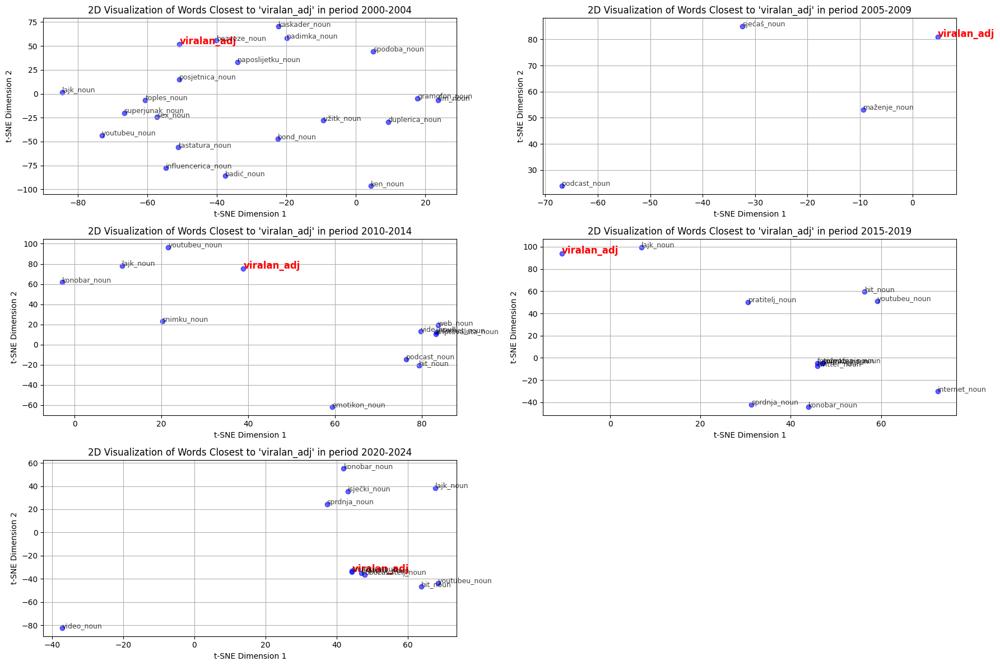




Word: umjetan_adj
Most similar to umjetan_adj in wave 1 are  ['pužnica_noun', 'trajnost_noun', 'erekcija_noun', 'liposukcija_noun', 'ugradnja_noun', 'skalpel_noun', 'nečistoća_noun', 'maternika_noun', 'tetoviranje_noun', 'pacemaker_noun', 'granula_noun', 'loj_noun', 'hrskavica_noun', 'srža_noun', 'kamenčić_noun', 'kateter_noun', 'utroba_noun', 'glodavc_noun', 'fetus_noun', 'kolagen_noun']
Most similar to umjetan_adj in wave 2 are  ['oplodnja_noun', 'pužnica_noun', 'zametak_noun', 'implantacija_noun', 'neplodnost_noun', 'posteljica_noun', 'drenaža_noun', 'jajašac_noun', 'gnojivo_noun', 'sperma_noun', 'epruveta_noun', 'ugrađivanje_noun', 'embriologija_noun', 'punkcija_noun', 'odstranjivanje_noun', 'začet_noun', 'herbicid_noun', 'organizm_noun', 'trljanje_noun', 'kolagen_noun']
Most similar to umjetan_adj in wave 3 are  ['oplodnja_noun', 'pužnica_noun', 'nanotehnologija_noun', 'gnojivo_noun', 'embrija_noun', 'implantacija_noun', 'ugrađivanje_noun', 'inteligencija_noun', 'sperme_noun', 

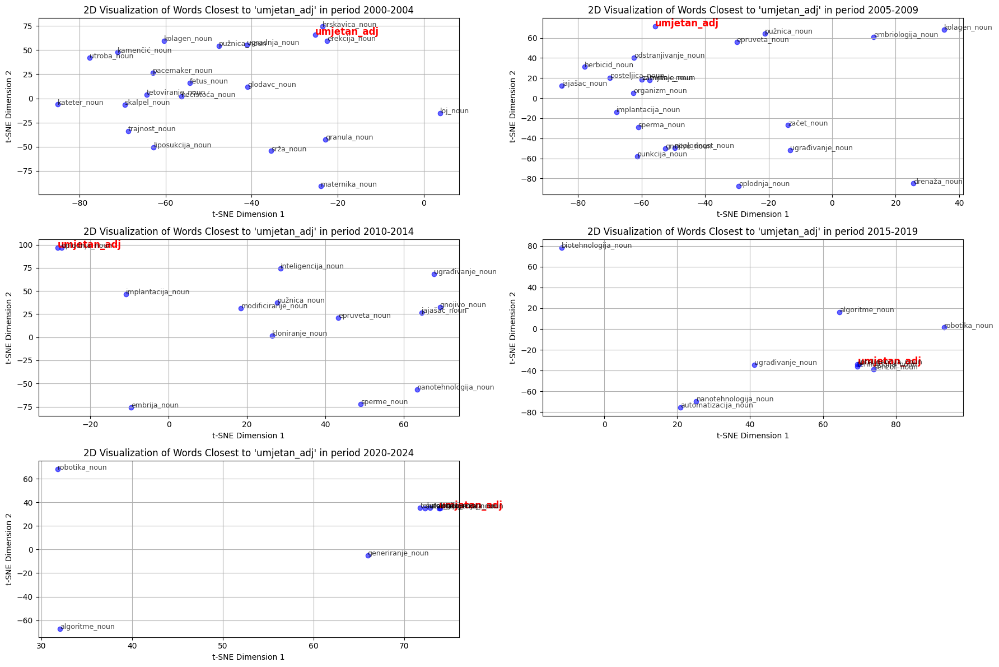




Word: inteligencija_noun
Most similar to inteligencija_noun in wave 1 are  ['kvocijent_noun', 'razlikovanje_noun', 'masturbacija_noun', 'cjepiv_noun', 'homeopatija_noun', 'doživljavanje_noun', 'empatija_noun', 'orgazm_noun', 'instinkt_noun', 'univerzum_noun', 'radišnost_noun', 'astrologija_noun', 'jasnoća_noun', 'evolucija_noun', 'ovulacija_noun', 'redefinicija_noun', 'vokabular_noun', 'habitus_noun', 'racionalnost_noun', 'karakterizacija_noun']
Most similar to inteligencija_noun in wave 2 are  ['kvocijent_noun', 'empatija_noun', 'nadarenost_noun', 'opažanje_noun', 'habitus_noun', 'tolerantnost_noun', 'racionalnost_noun', 'upućenost_noun', 'senzibilnost_noun', 'kromosom_noun', 'individualnost_noun', 'orgazm_noun', 'obzirnost_noun', 'znanj_noun', 'marljivost_noun', 'doživljavanje_noun', 'erudicija_noun', 'dobronamjernost_noun', 'smisl_noun', 'bićima_noun']
Most similar to inteligencija_noun in wave 3 are  ['kvocijent_noun', 'sposobnost_noun', 'upućenost_noun', 'racionalnost_noun', 'e

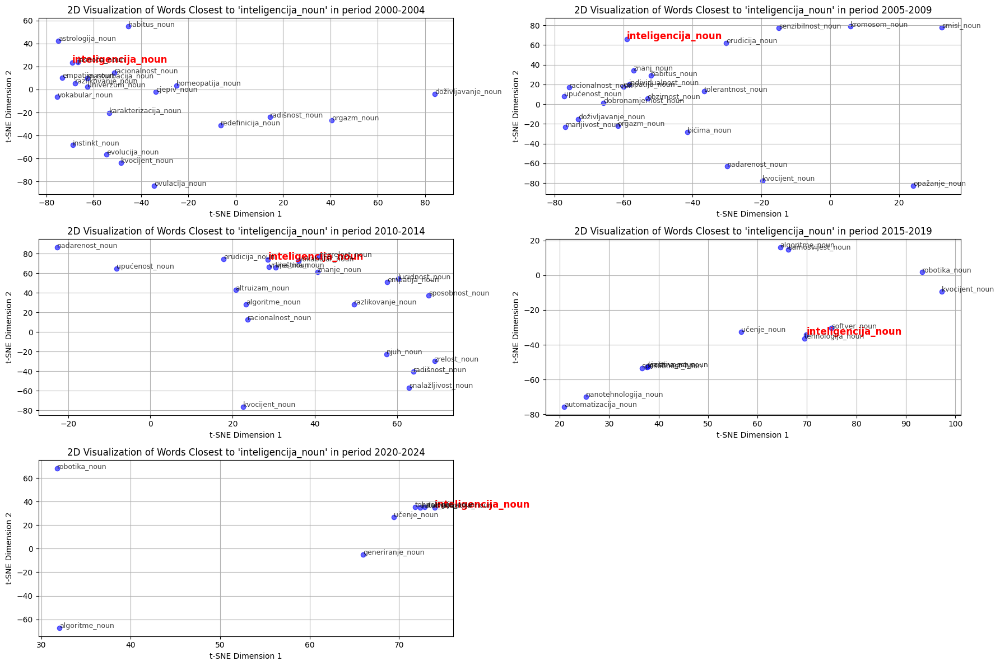




Word: označavanje_noun
Most similar to označavanje_noun in wave 1 are  ['deklariranje_noun', 'dobrobita_noun', 'uputstvo_noun', 'akat_noun', 'kakvoć_noun', 'certifikacija_noun', 'gustoć_noun', 'veterinarstvo_noun', 'mikrolokacija_noun', 'sastojc_noun', 'organizm_noun', 'hranidba_noun', 'higijen_noun', 'herbicid_noun', 'artiklo_noun', 'jačoj_noun', 'obuhvat_noun', 'razvrstavanje_noun', 'atest_noun', 'zagađivač_noun']
Most similar to označavanje_noun in wave 2 are  ['deklariranje_noun', 'certifikacija_noun', 'onečišćavanje_noun', 'evidentiranje_noun', 'sukladnost_noun', 'uredbom_noun', 'izvornost_noun', 'kakvoć_noun', 'obuhvat_noun', 'donošenjem_noun', 'mehanizmima_noun', 'europsk_noun', 'detektiranje_noun', 'novotarija_noun', 'direktivo_noun', 'harmonizacija_noun', 'arhiviranje_noun', 'lijepljenje_noun', 'ujednačavanje_noun', 'uzus_noun']
Most similar to označavanje_noun in wave 3 are  ['deklariranje_noun', 'evidentiranje_noun', 'sukladnost_noun', 'standardizacija_noun', 'razlikovanj

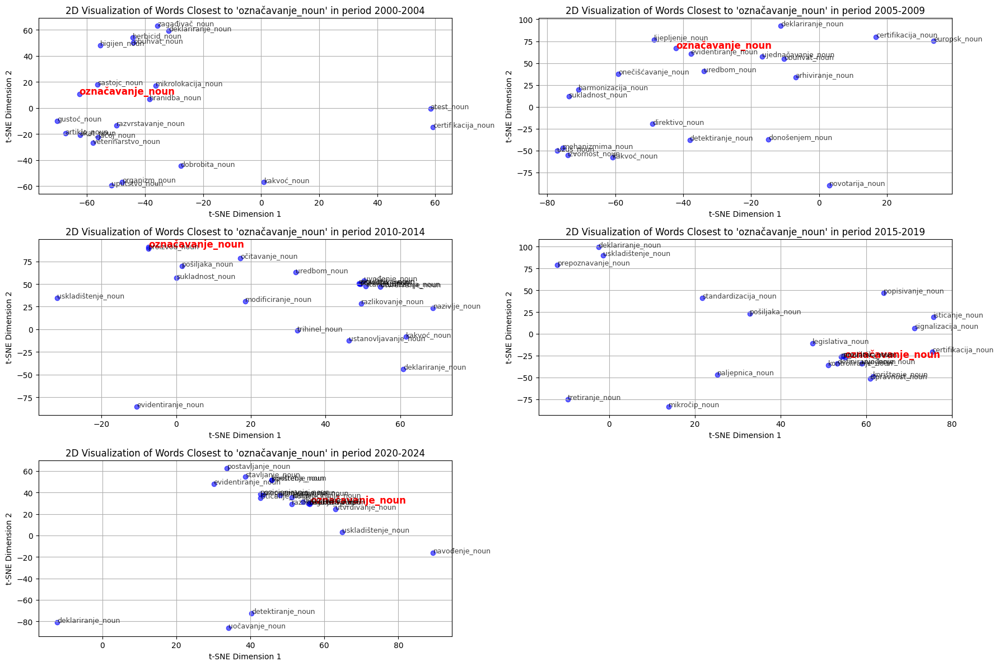




Word: privola_noun
Most similar to privola_noun in wave 1 are  ['staratelj_noun', 'timoav_noun', 'očevidnik_noun', 'autorizacija_noun', 'ovlaštenje_noun', 'screening_noun', 'nedostac_noun', 'pozivatelj_noun', 'ljekarnik_noun', 'suglazaj_noun', 'formular_noun', 'nevoljkost_noun', 'disketa_noun', 'nekažnjavanje_noun', 'strož_noun', 'elektronski_noun', 'neobjavljivanje_noun', 'darovanje_noun', 'omekšavanje_noun', 'dostavljanje_noun']
Most similar to privola_noun in wave 2 are  ['uvjetovanje_noun', 'obvezivanje_noun', 'izrijeak_noun', 'direktivo_noun', 'konzultiranje_noun', 'suodlučivanje_noun', 'zahtijevanje_noun', 'sugovornicima_noun', 'pedijatr_noun', 'povjerljivost_noun', 'najavljivanje_noun', 'uput_noun', 'nestručnjak_noun', 'formular_noun', 'tutor_noun', 'tiskanica_noun', 'ovjera_noun', 'staratelj_noun', 'fotokopija_noun', 'protuusluga_noun']
Most similar to privola_noun in wave 3 are  ['pohrana_noun', 'non_noun', 'odobrenje_noun', 'ustanoviti_noun', 'suglasnost_noun', 'supotpis_n

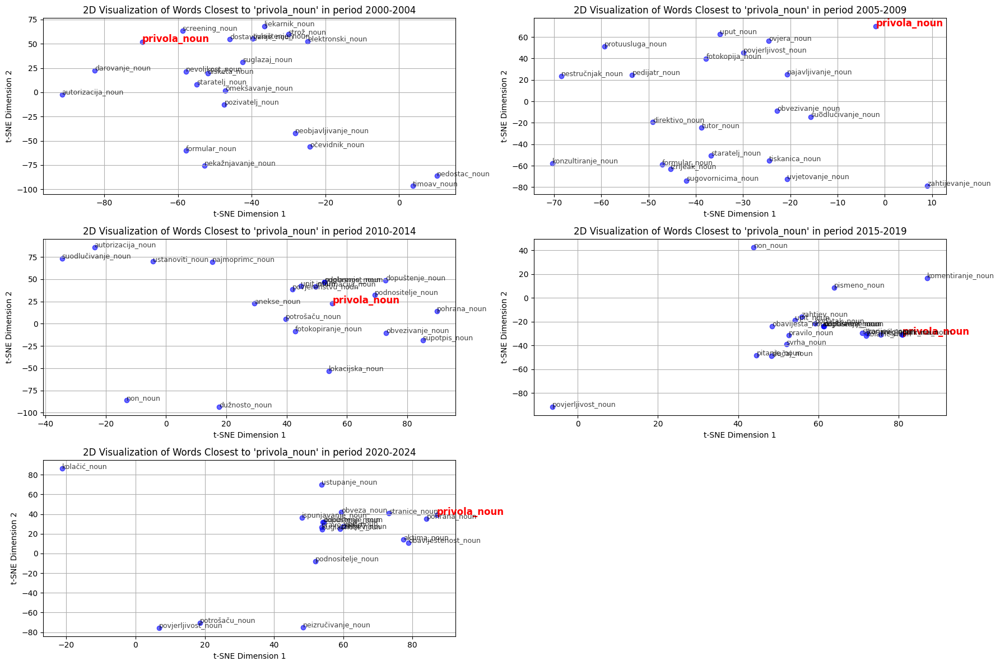




Word: dijeljenje_noun
Most similar to dijeljenje_noun in wave 1 are  ['uravnoteženost_noun', 'svjesnost_noun', 'efekat_noun', 'pikanterija_noun', 'doživljavanje_noun', 'neravnopravnost_noun', 'upućenost_noun', 'esencija_noun', 'umetanje_noun', 'sužavanje_noun', 'celofan_noun', 'tuđoj_noun', 'dolaženje_noun', 'revidiranje_noun', 'sažaljenje_noun', 'srozavanje_noun', 'kritičnost_noun', 'požuda_noun', 'dajem_noun', 'zarađivanje_noun']
Most similar to dijeljenje_noun in wave 2 are  ['nazivanje_noun', 'pojašnjavanje_noun', 'lek_noun', 'stvaranjem_noun', 'zagovaranje_noun', 'doniranje_noun', 'pridobivanje_noun', 'zakidanje_noun', 'odgovaranje_noun', 'sortiranje_noun', 'nuđenje_noun', 'dada_noun', 'uspoređivanje_noun', 'posjetiok_noun', 'lijepljenje_noun', 'razmjean_noun', 'obvezivanje_noun', 'najavljivanje_noun', 'analiziranje_noun', 'mobiteli_noun']
Most similar to dijeljenje_noun in wave 3 are  ['dolaženje_noun', 'korištenje_noun', 'poklanjanje_noun', 'susretanje_noun', 'internet_noun',

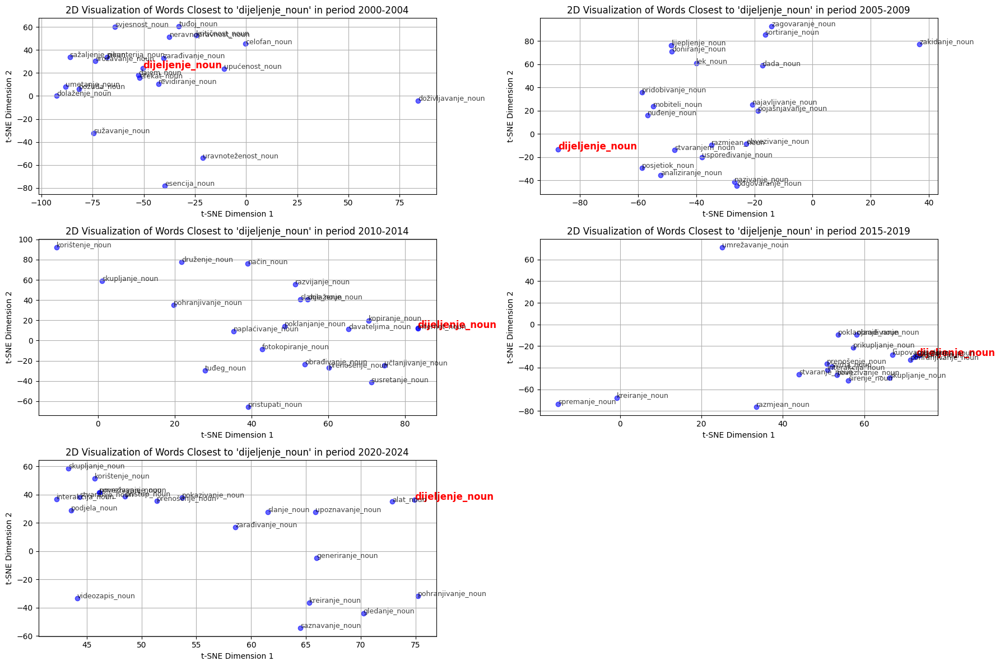




Word: influencer_noun
Most similar to influencer_noun in wave 1 are  ['bloger_noun', 'naposlijetku_noun', 'reklo_noun', 'dobričina_noun', 'vizual_noun', 'lajk_noun']
Most similar to influencer_noun in wave 2 are  []
Most similar to influencer_noun in wave 3 are  []
Most similar to influencer_noun in wave 4 are  ['oglašivač_noun', 'bloger_noun', 'brend_noun', 'brand_noun', 'marketing_noun', 'videe_noun', 'pratitelj_noun', 'profesionalac_noun', 'kreator_noun', 'pretplatnik_noun']
Most similar to influencer_noun in wave 5 are  ['kreator_noun', 'bloger_noun', 'brendov_noun', 'oglašivač_noun', 'guru_noun', 'reklama_noun', 'uradc_noun', 'pratitelj_noun']


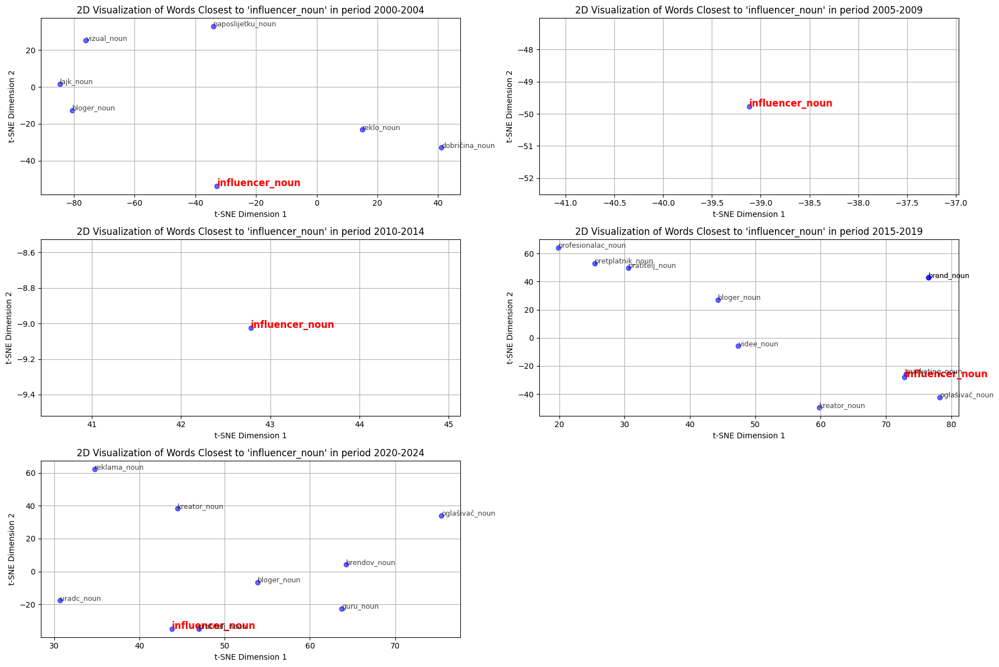




Word: revolucija_noun
Most similar to revolucija_noun in wave 1 are  ['socijalizam_noun', 'diktatura_noun', 'dinastija_noun', 'emancipacija_noun', 'berlin_noun', 'apartheid_noun', 'hegemonija_noun', 'doktrina_noun', 'gibanje_noun', 'totalitarizam_noun', 'desetljeć_noun', 'samoupravljanje_noun', 'višestranačje_noun', 'boljševizam_noun', 'svrgavanje_noun', 'puč_noun', 'uzdizanje_noun', 'unionist_noun', 'komunizam_noun', 'križar_noun']
Most similar to revolucija_noun in wave 2 are  ['socijalizam_noun', 'zbacivanje_noun', 'ustanak_noun', 'marksizam_noun', 'prevrat_noun', 'bunt_noun', 'era_noun', 'relikt_noun', 'imperija_noun', 'sveučilištarac_noun', 'balvan_noun', 'hegemonija_noun', 'epoha_noun', 'svrgavanje_noun', 'amerikanizacija_noun', 'slamanje_noun', 'kolonizacija_noun', 'emancipacija_noun', 'puč_noun', 'vođe_noun']
Most similar to revolucija_noun in wave 3 are  ['zbacivanje_noun', 'pobunu_noun', 'ustanak_noun', 'represija_noun', 'svrgavanje_noun', 'globalizam_noun', 'cionist_noun'

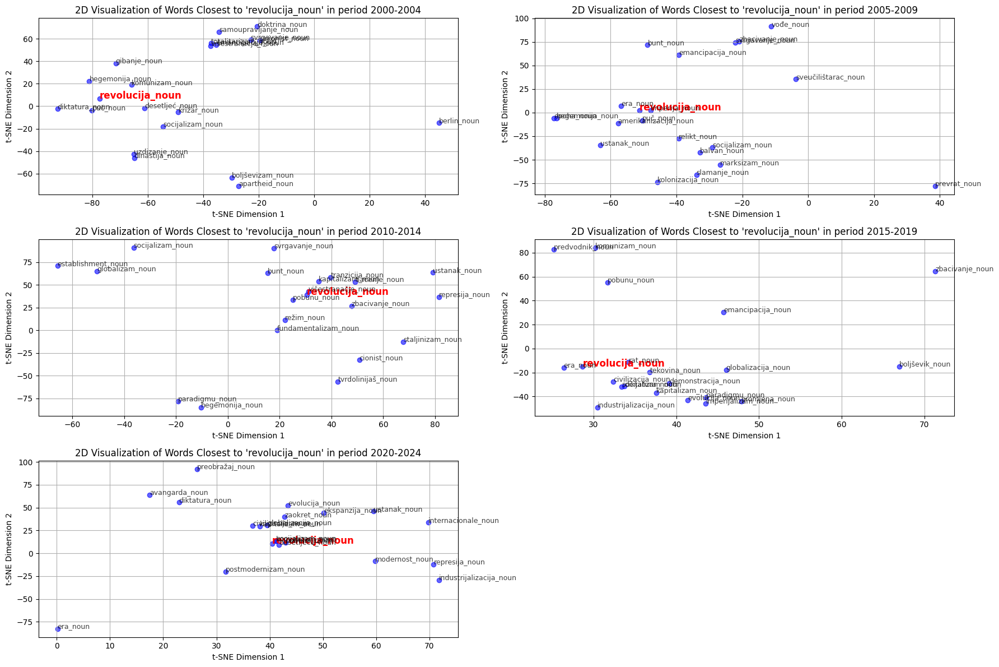




Word: podaci_noun
Most similar to podaci_noun in wave 1 are  ['index_noun', 'anket_noun', 'covid_noun', 'nerazmjer_noun', 'pozivatelj_noun', 'nejavljanje_noun', 'registr_noun', 'osobe_noun', 'nepravilnoste_noun', 'neinformiranost_noun', 'epidemiolozi_noun', 'izmjenama_noun', 'gubici_noun', 'obuhvat_noun', 'državi_noun', 'analitika_noun', 'lanjska_noun', 'nezaposleni_noun', 'pokrivenost_noun', 'incidencija_noun']
Most similar to podaci_noun in wave 2 are  ['očevidnik_noun', 'rasprostranjenost_noun', 'grafikon_noun', 'nejavljanje_noun', 'potvrdu_noun', 'istraživanjem_noun', 'insolventnost_noun', 'metodologija_noun', 'klasifikacija_noun', 'tabela_noun', 'porasta_noun', 'evidencija_noun', 'registr_noun', 'umrlih_noun', 'raširenost_noun', 'objavljen_noun', 'pokazatelj_noun', 'izračunavanje_noun', 'nesrazmjer_noun', 'naovati_noun']
Most similar to podaci_noun in wave 3 are  ['pokazatelj_noun', 'evidencija_noun', 'izračun_noun', 'očevidnik_noun', 'informacija_noun', 'analiza_noun', 'anketi

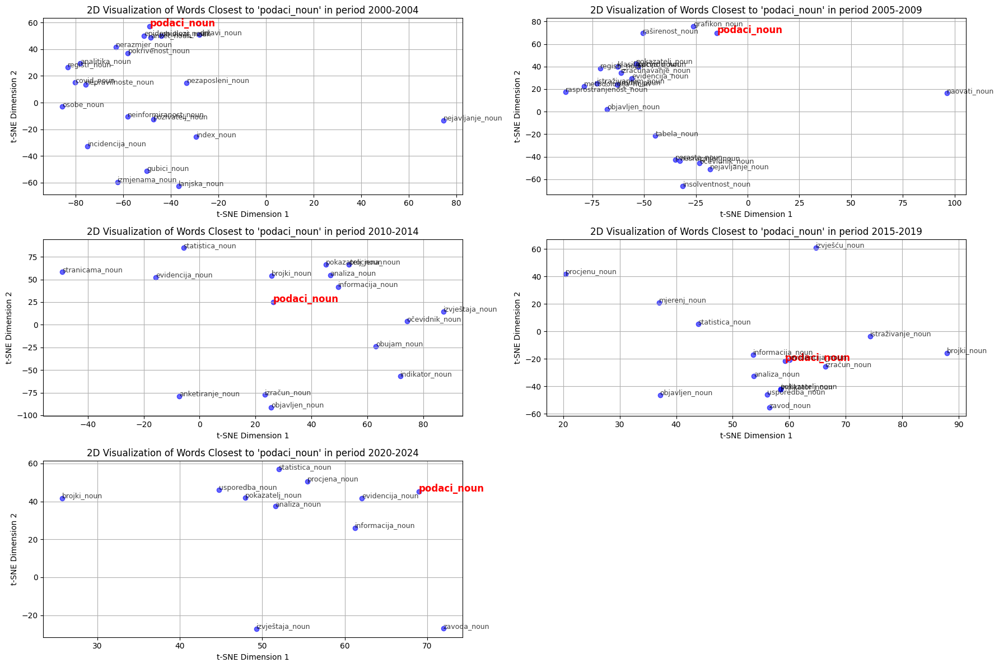




Word: etika_noun
Most similar to etika_noun in wave 1 are  ['marksizam_noun', 'hinduizam_noun', 'dogma_noun', 'tijeka_noun', 'geografija_noun', 'smislenost_noun', 'demografija_noun', 'kodeks_noun', 'europejstvo_noun', 'uvodničar_noun', 'pluralizam_noun', 'motrište_noun', 'embriologija_noun', 'komunikologija_noun', 'legislativa_noun', 'dominikanac_noun', 'raspravljanje_noun', 'terminologija_noun', 'usmjerenost_noun', 'filologija_noun']
Most similar to etika_noun in wave 2 are  ['poučavanje_noun', 'nazivlje_noun', 'liječništvo_noun', 'kodeks_noun', 'moralnost_noun', 'uzus_noun', 'čestitost_noun', 'pluralizam_noun', 'sestrinstvo_noun', 'nihilizam_noun', 'ophođenje_noun', 'kolegijalnost_noun', 'snošljivost_noun', 'negacija_noun', 'dobronamjernost_noun', 'kanon_noun', 'metafizika_noun', 'katedru_noun', 'feminizam_noun', 'spolov_noun']
Most similar to etika_noun in wave 3 are  ['čestitost_noun', 'liječništvo_noun', 'postulat_noun', 'logika_noun', 'kodeks_noun', 'objektivnost_noun', 'filoz

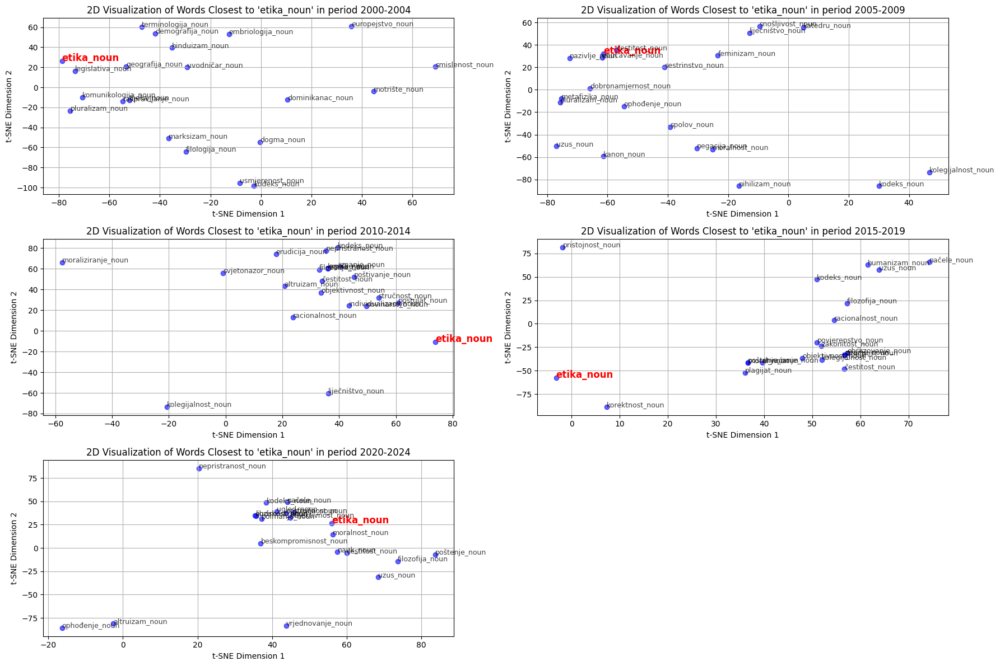

In [15]:
for target_word in [
    "ai_noun",
    "prava_adj",
    "poslužitelj_noun",
    "selfie_noun",
    "hashtag_noun",
    "story_noun",
    "algoritam_noun",
    "bot_noun",
    "vjerodajnica_noun",
    "chatbot_noun",
    "viralan_adj",
    "umjetan_adj",
    "inteligencija_noun",
    "označavanje_noun",
    "privola_noun",
    "dijeljenje_noun",
    "influencer_noun",
    "revolucija_noun",
    "podaci_noun",
    "etika_noun",
]:
    print(f"Word: {target_word}")
    print("==" * 20)
    plot_tsne_visualization(
        get_most_similar_by_pos(target_word, "noun", 1000, 200),
        target_word,
        periods,
        waves,
        period_labels={
            0: "2000-2004",
            1: "2005-2009",
            2: "2010-2014",
            3: "2015-2019",
            4: "2020-2024",
        },
    )
    print("\n\n")

In [30]:
eu_words = [
    "europa_propn",
    "unija_noun",
    "bruxelles_propn",
    "parlament_noun",
    "komisija_noun",
    "ek_propn",
    "schengen_propn",
    "članstvo_noun",
    "pregovor_noun",
    "pregovori_noun",
    "proširenje_noun",
    "članica_noun",
    "euroskepticizam_noun",
    "euroentuzijazam_noun",
    "suverenitet_noun",
    "integracija_noun",
    "eurozona_noun",
    "eu_propn",
    "euro_noun",
    "fondovi_noun",
    "fond_noun",
    "projekti_noun",
    "npoo_noun",
    "tranzicija_noun",
    "tržište_noun"
]


eu_words = set(eu_words)

for wave_index, word_counts_wave in enumerate(word_counts_separate):
    eu_word_count = sum(1 for word in eu_words if word in word_counts_wave)
    print(f"Number of words from the TECH words list in wave {wave_index + 1}: {eu_word_count}")

word_counts = []

for word in eu_words:
    counts = [word_counts_wave.get(word, 0) for word_counts_wave in word_counts_separate]
    word_counts.append(counts)
    print(f"{word}: {counts}")

eu_words = {word for i, word in enumerate(eu_words) if sum(word_counts[i]) >= 1000}

print("New length", len(eu_words))

Number of words from the TECH words list in wave 1: 25
Number of words from the TECH words list in wave 2: 25
Number of words from the TECH words list in wave 3: 25
Number of words from the TECH words list in wave 4: 25
Number of words from the TECH words list in wave 5: 25
projekti_noun: [27, 79, 86, 128, 182]
pregovor_noun: [9169, 32515, 79139, 161045, 198713]
bruxelles_propn: [3313, 7790, 32273, 86230, 84832]
članica_noun: [8492, 21919, 80383, 214478, 323887]
eurozona_noun: [199, 1043, 21063, 31149, 48610]
schengen_propn: [137, 298, 923, 10375, 18280]
proširenje_noun: [2494, 6712, 13670, 31109, 49585]
npoo_noun: [6, 5, 11, 14, 2954]
članstvo_noun: [5292, 9890, 29232, 62015, 89273]
parlament_noun: [8219, 17371, 75595, 210889, 219839]
tržište_noun: [13148, 44552, 156118, 318187, 448561]
suverenitet_noun: [626, 1148, 4761, 16248, 25307]
fond_noun: [7814, 21355, 83391, 173785, 217169]
unija_noun: [12791, 27586, 109197, 271807, 340725]
ek_propn: [469, 1484, 7716, 19912, 22948]
europa_pro

[('euroskepticizam_noun', 0.5351920425891876), ('tranzicija_noun', 0.4880464971065521), ('schengen_propn', 0.4798060655593872), ('ek_propn', 0.4469148516654968), ('proširenje_noun', 0.4245767593383789), ('eurozona_noun', 0.4020739495754242), ('suverenitet_noun', 0.39010775089263916), ('integracija_noun', 0.3856295049190521), ('bruxelles_propn', 0.3766467273235321), ('npoo_noun', 0.35622380673885345), ('članstvo_noun', 0.3486515283584595), ('komisija_noun', 0.33659398555755615), ('fond_noun', 0.3169224262237549), ('parlament_noun', 0.2685862183570862), ('pregovor_noun', 0.25397732853889465), ('unija_noun', 0.2494109869003296), ('članica_noun', 0.2408488392829895), ('europa_propn', 0.2331920564174652), ('eu_propn', 0.2202184498310089), ('euro_noun', 0.2092900574207306)]


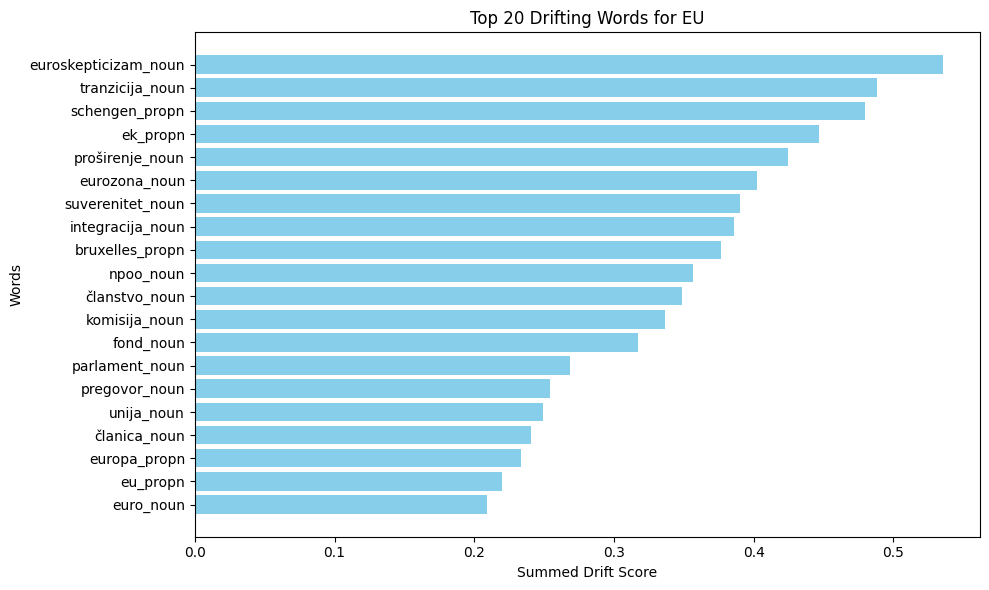

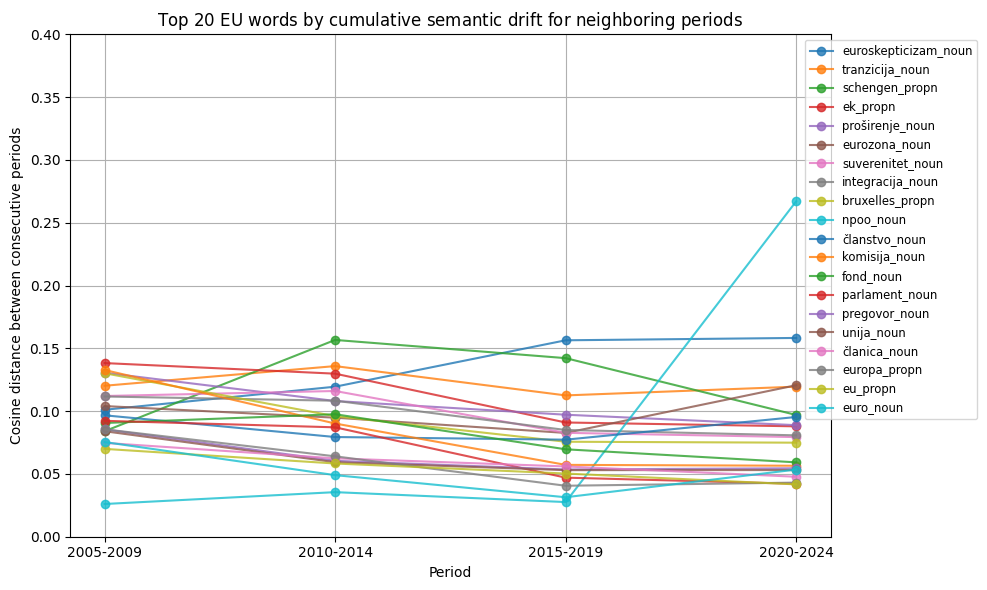

In [31]:
analyze_cumulative_drift(eu_words, "EU")

### Top 20 EU drifters with 20 most similar words around

Word: euroskepticizam_noun
Most similar to euroskepticizam_noun in wave 1 are  ['narativ_noun', 'izolacionizam_noun', 'populizam_noun', 'globalizam_noun', 'hegemonija_noun', 'oligarhija_noun', 'nacionalizm_noun', 'dodvoravanje_noun', 'ignorancija_noun', 'orijentaciji_noun', 'dinamiziranje_noun', 'opredijeljenost_noun', 'odist_noun', 'zaklinjanje_noun', 'politka_noun', 'zagovaranje_noun', 'forsiranje_noun', 'normalnost_noun', 'demokratičnost_noun', 'uzus_noun']
Most similar to euroskepticizam_noun in wave 2 are  ['bipolarizacija_noun', 'trijumfalizam_noun', 'izolacionizam_noun', 'zatvorenost_noun', 'ksenofobija_noun', 'pragmatizam_noun', 'neoliberalizam_noun', 'retorica_noun', 'potiskivanje_noun', 'zazor_noun', 'silnica_noun', 'međuovisnost_noun', 'radikalizacija_noun', 'oportunizam_noun', 'centralizam_noun', 'globalizam_noun', 'dihotomija_noun', 'normalnost_noun', 'nejedinstvo_noun', 'nihilizam_noun']
Most similar to euroskepticizam_noun in wave 3 are  ['samoizolacija_noun', 'izolacion

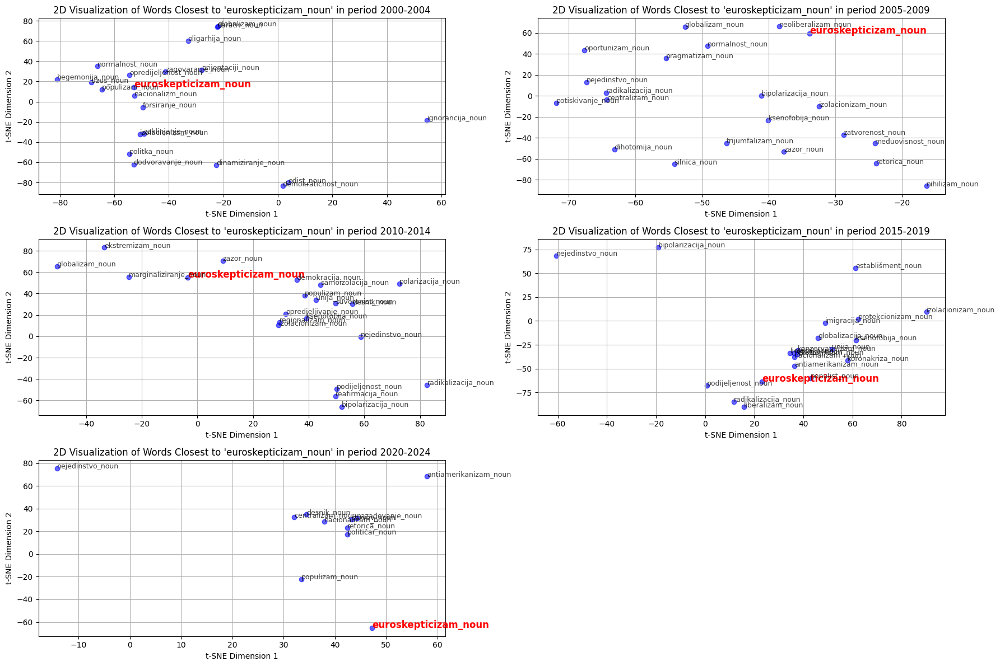




Word: tranzicija_noun
Most similar to tranzicija_noun in wave 1 are  ['depolitizacija_noun', 'harmonizacija_noun', 'kohezija_noun', 'nejednakost_noun', 'agenda_noun', 'ciljeav_noun', 'dinamiziranje_noun', 'dokidanje_noun', 'homogenizacija_noun', 'narativ_noun', 'institucionalizacija_noun', 'mastodont_noun', 'reindustrijalizacija_noun', 'trendovi_noun', 'eliminiranje_noun', 'oživotvorenje_noun', 'legislativa_noun', 'suodlučivanje_noun', 'besperspektivnost_noun', 'samoupravljanje_noun']
Most similar to tranzicija_noun in wave 2 are  ['neoliberalizam_noun', 'relikt_noun', 'nazadovanje_noun', 'fragmentacija_noun', 'samoupravljanje_noun', 'deregulacija_noun', 'agenda_noun', 'hegemonija_noun', 'osiromašenje_noun', 'amerikanizacija_noun', 'činitelj_noun', 'trom_noun', 'ovladavanje_noun', 'međuovisnost_noun', 'multilateralizam_noun', 'višestranačje_noun', 'oligarhija_noun', 'supersila_noun', 'simbolički_noun', 'liderstvo_noun']
Most similar to tranzicija_noun in wave 3 are  ['europeizacija_

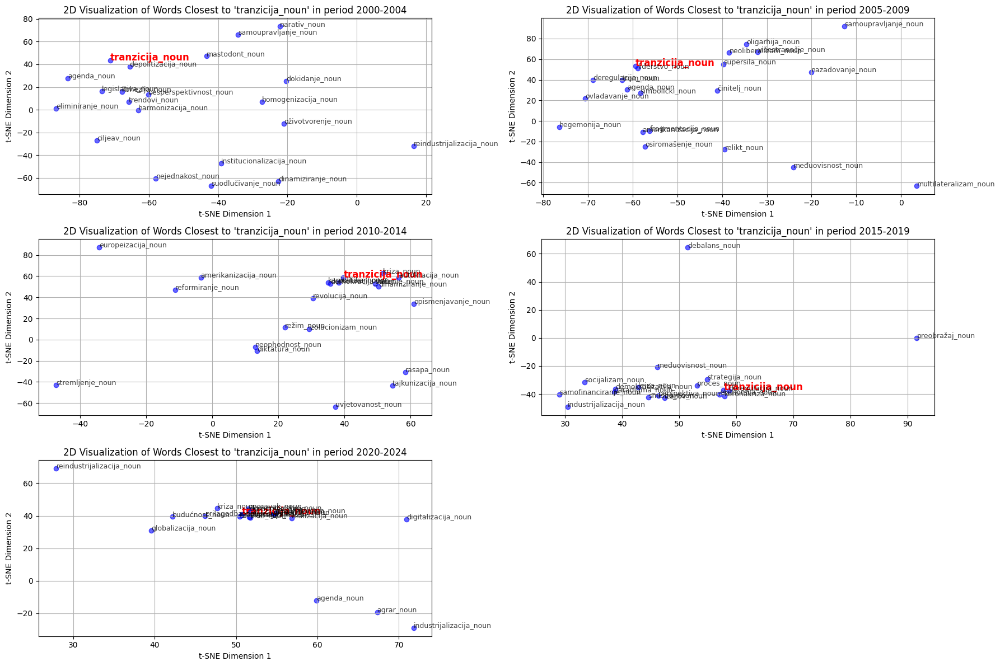




Word: schengen_propn
Most similar to schengen_propn in wave 1 are  ['ulasak_noun', 'razdruživanje_noun', 'omekšavanje_noun', 'ratificiranje_noun', 'referenduam_noun', 'dobrosusjedstvo_noun', 'useljavanje_noun', 'izazoviti_noun', 'neutralnost_noun', 'ocijena_noun', 'harmonizacija_noun', 'uvjetovanost_noun', 'federaciju_noun', 'otežavanje_noun', 'tumačenjima_noun', 'normaliziranje_noun', 'dokidanje_noun', 'zagovornici_noun', 'monet_noun', 'lockdown_noun']
Most similar to schengen_propn in wave 2 are  ['nečlanica_noun', 'republikom_noun', 'ozemlje_noun', 'skorija_noun', 'ratificiranje_noun', 'federaciju_noun', 'unija_noun', 'dobrosusjedstvo_noun', 'operacionalizacija_noun', 'arbitražom_noun', 'pravcem_noun', 'italija_noun', 'otpočinjanje_noun', 'razdruživanje_noun', 'parafiranje_noun', 'deblokiranje_noun', 'neizbježnost_noun', 'referenduam_noun', 'ultimatume_noun', 'zemlja_noun']
Most similar to schengen_propn in wave 3 are  ['komisije_noun', 'ulasak_noun', 'delegacije_noun', 'članica_

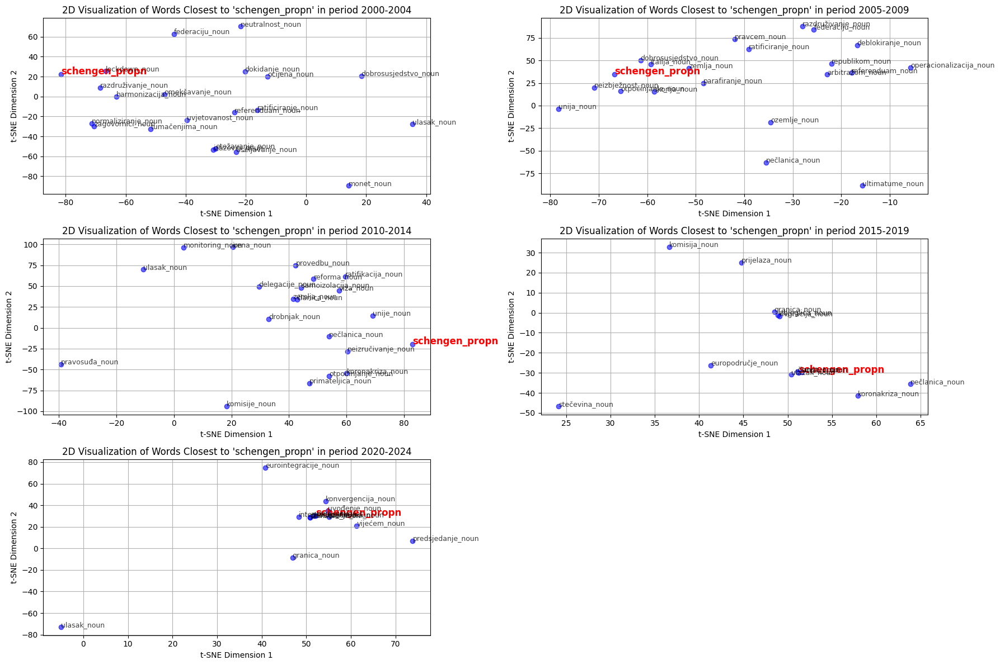




Word: ek_propn
Most similar to ek_propn in wave 1 are  ['konvergencija_noun', 'rop_noun', 'ratificiranje_noun', 'ulasak_noun', 'delegacije_noun', 'ministrima_noun', 'psp_noun', 'agenda_noun', 'harmonizacija_noun', 'javier_noun', 'meritum_noun', 'paper_noun', 'ombudsman_noun', 'prevlaka_noun', 'aklamacija_noun', 'žužul_noun', 'sukladnost_noun', 'aspirant_noun', 'unija_noun', 'supotpis_noun']
Most similar to ek_propn in wave 2 are  ['komisija_noun', 'delegacije_noun', 'unija_noun', 'screening_noun', 'deblokiranje_noun', 'arbitražom_noun', 'ratificiranje_noun', 'otpočinjanje_noun', 'izrijeak_noun', 'veleposlanic_noun', 'pravnici_noun', 'posredništvo_noun', 'roaming_noun', 'raspraviti_noun', 'povjerenic_noun', 'nadopun_noun', 'protumjer_noun', 'operacionalizacija_noun', 'ulasak_noun', 'legislativa_noun']
Most similar to ek_propn in wave 3 are  ['unija_noun', 'komisije_noun', 'monitoring_noun', 'delegacije_noun', 'politak_noun', 'vlada_noun', 'operacionalizacija_noun', 'eurointegracije_n

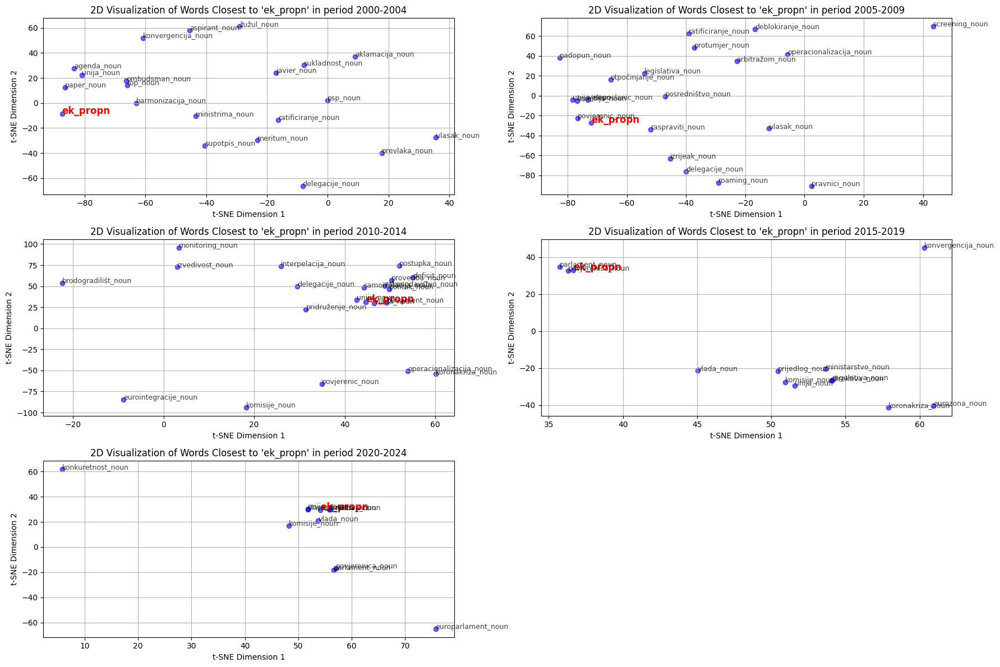




Word: proširenje_noun
Most similar to proširenje_noun in wave 1 are  ['nečlanica_noun', 'agenda_noun', 'aspirant_noun', 'ulasak_noun', 'psp_noun', 'harmonizacija_noun', 'zaključivanje_noun', 'završavanje_noun', 'rezerviranost_noun', 'petnaestorica_noun', 'perspektiv_noun', 'otpočinjanje_noun', 'useljavanje_noun', 'unija_noun', 'ratificiranje_noun', 'izazoviti_noun', 'operacionalizacija_noun', 'ocijena_noun', 'vlad_noun', 'direktivo_noun']
Most similar to proširenje_noun in wave 2 are  ['skorija_noun', 'deblokiranje_noun', 'perspektiv_noun', 'parafiranje_noun', 'otpočinjanje_noun', 'unija_noun', 'ratificiranje_noun', 'olakšavanje_noun', 'nadopun_noun', 'osuvremenjavanje_noun', 'republikom_noun', 'posredništvo_noun', 'agenda_noun', 'kooperativnost_noun', 'operacionalizacija_noun', 'normaliziranje_noun', 'sužavanje_noun', 'usuglašavanje_noun', 'finaciranje_noun', 'oživotvorenje_noun']
Most similar to proširenje_noun in wave 3 are  ['izgradnja_noun', 'širenje_noun', 'moderniziranje_noun

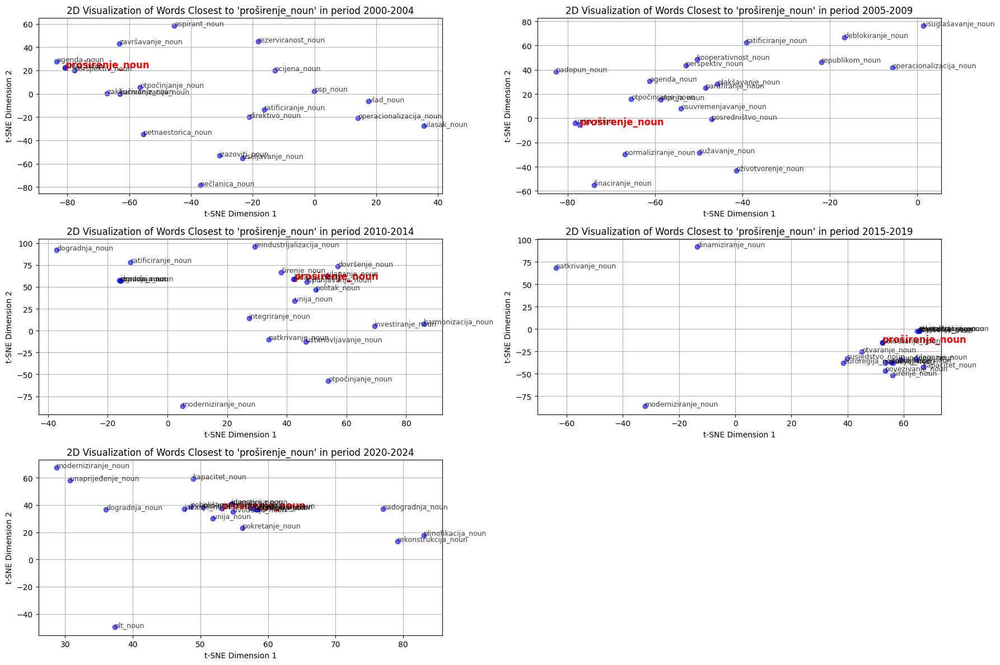




Word: eurozona_noun
Most similar to eurozona_noun in wave 1 are  ['udvostručenje_noun', 'koronakriza_noun', 'debalans_noun', 'devalvacija_noun', 'ulasak_noun', 'bilijun_noun', 'capit_noun', 'fertilitet_noun', 'suficit_noun', 'buking_noun', 'nečlanica_noun', 'bnp_noun', 'ocijena_noun', 'paritet_noun', 'kvartal_noun', 'konsolidiranje_noun', 'makroekonomist_noun', 'deregulacija_noun', 'usporavanje_noun', 'zaduživanja_noun']
Most similar to eurozona_noun in wave 2 are  ['aprecijacija_noun', 'koronakriza_noun', 'bdp_noun', 'franc_noun', 'inflacija_noun', 'refinanciranje_noun', 'bnp_noun', 'devalvacija_noun', 'debalans_noun', 'rezervi_noun', 'usporavanje_noun', 'capit_noun', 'izvoznica_noun', 'fertilitet_noun', 'paritet_noun', 'rast_noun', 'buking_noun', 'uravnoteženje_noun', 'stopa_noun', 'unija_noun']
Most similar to eurozona_noun in wave 3 are  ['unija_noun', 'kriza_noun', 'koronakriza_noun', 'devalvacija_noun', 'valuta_noun', 'zone_noun', 'recesija_noun', 'inflacija_noun', 'aprecijaci

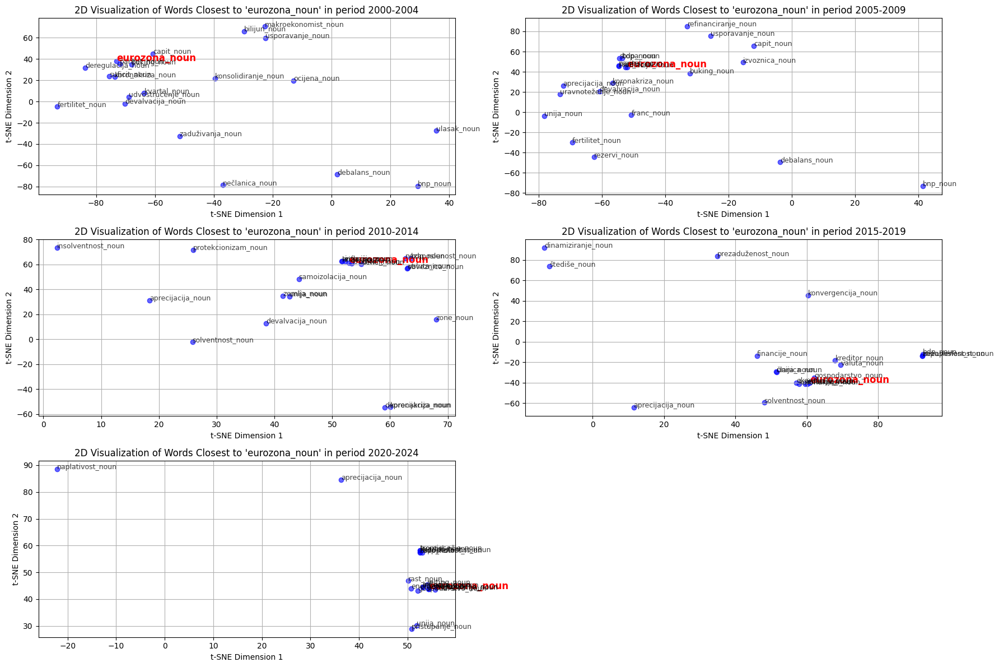




Word: suverenitet_noun
Most similar to suverenitet_noun in wave 1 are  ['cjelovitost_noun', 'dobrosusjedstvo_noun', 'subjektivitet_noun', 'uzajamnost_noun', 'separatizam_noun', 'hegemonija_noun', 'neutralnost_noun', 'unaprijeđenje_noun', 'oligarhija_noun', 'izručivanje_noun', 'getoizacija_noun', 'tumačenjima_noun', 'cementiranje_noun', 'supsidijarnost_noun', 'fundamentalizam_noun', 'sporenje_noun', 'redefiniranje_noun', 'uštrb_noun', 'izolacionizam_noun', 'umjerenost_noun']
Most similar to suverenitet_noun in wave 2 are  ['cjelovitost_noun', 'subjektivitet_noun', 'aneksija_noun', 'jurisdikcija_noun', 'hegemonija_noun', 'separatizam_noun', 'ozemlje_noun', 'izolacionizam_noun', 'bezvlašće_noun', 'postult_noun', 'jednakopravnost_noun', 'rastakanje_noun', 'dobrosusjedstvo_noun', 'europeizacija_noun', 'tekovina_noun', 'militarizacija_noun', 'podrivanje_noun', 'deklaraciji_noun', 'rezoluciji_noun', 'realitet_noun']
Most similar to suverenitet_noun in wave 3 are  ['cjelovitost_noun', 'teri

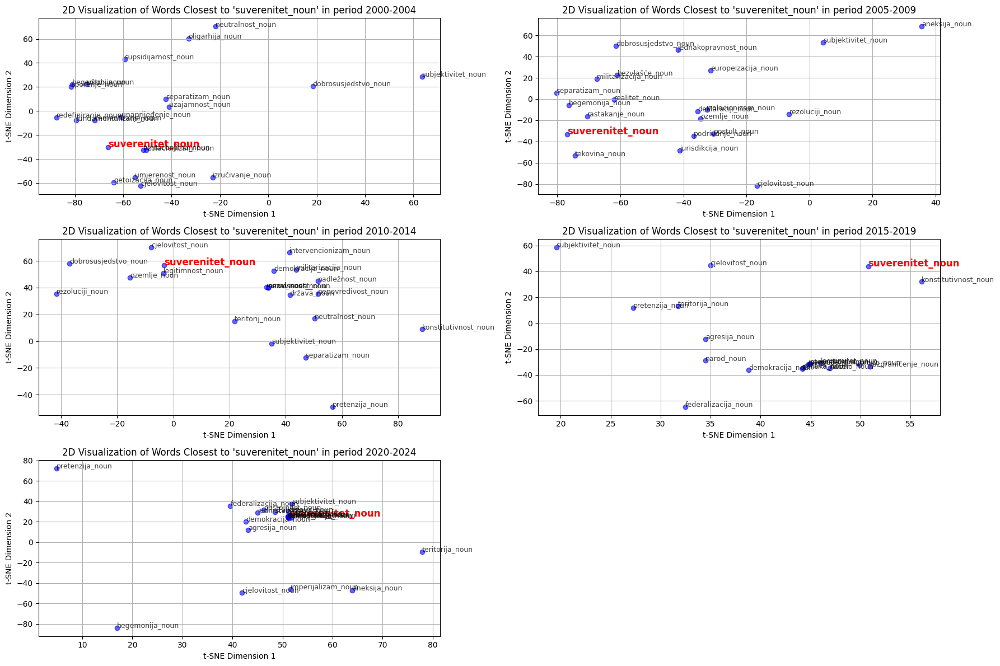




Word: integracija_noun
Most similar to integracija_noun in wave 1 are  ['harmonizacija_noun', 'psp_noun', 'kolind_noun', 'agenda_noun', 'aspirant_noun', 'iskoraka_noun', 'kohezija_noun', 'organizaciju_noun', 'unija_noun', 'oživotvorenje_noun', 'koordiniranje_noun', 'stečevina_noun', 'dobrosusjedstvo_noun', 'neophodnost_noun', 'opredijeljenost_noun', 'poboljšavanje_noun', 'unaprijeđenje_noun', 'reformiranje_noun', 'institucionalizacija_noun', 'implementacija_noun']
Most similar to integracija_noun in wave 2 are  ['unija_noun', 'agenda_noun', 'kolind_noun', 'fragmentacija_noun', 'dobrosusjedstvo_noun', 'ulasak_noun', 'formuliranje_noun', 'uključenost_noun', 'harmonizacija_noun', 'izgrađivanje_noun', 'institucionalizacija_noun', 'međuovisnost_noun', 'jednakopravnost_noun', 'politika_noun', 'delegacije_noun', 'reformiranje_noun', 'skorija_noun', 'nastavljanje_noun', 'ozemlje_noun', 'kancelarke_noun']
Most similar to integracija_noun in wave 3 are  ['unija_noun', 'implementacija_noun', '

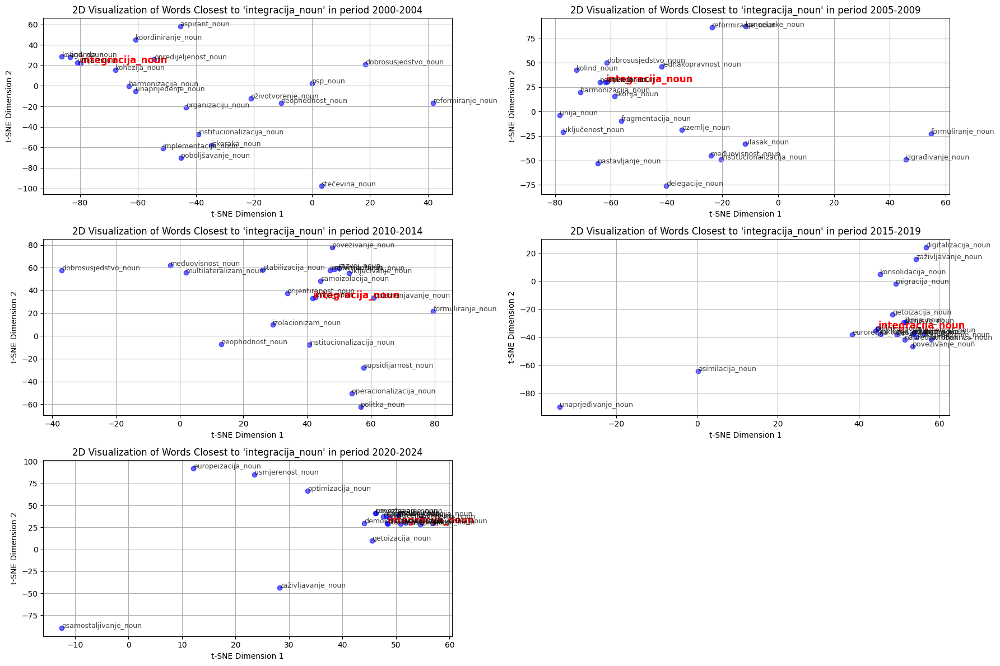




Word: bruxelles_propn
Most similar to bruxelles_propn in wave 1 are  ['petnaestorica_noun', 'javier_noun', 'samit_noun', 'sobranje_noun', 'solana_noun', 'summit_noun', 'agenda_noun', 'unija_noun', 'rop_noun', 'kopenhagen_noun', 'ulasak_noun', 'margina_noun', 'aspirant_noun', 'žužul_noun', 'nečlanica_noun', 'ocijena_noun', 'ratificiranje_noun', 'sugovornicima_noun', 'parafiranje_noun', 'dobrosusjedstvo_noun']
Most similar to bruxelles_propn in wave 2 are  ['unija_noun', 'delegacije_noun', 'ljubljana_noun', 'samit_noun', 'deblokiranje_noun', 'pučan_noun', 'solana_noun', 'parlamentarc_noun', 'agenda_noun', 'republikom_noun', 'ozemlje_noun', 'arbitražom_noun', 'ulasak_noun', 'nečlanica_noun', 'ultimatume_noun', 'kancelarak_noun', 'zaključcima_noun', 'ratificiranje_noun', 'komisija_noun', 'operacionalizacija_noun']
Most similar to bruxelles_propn in wave 3 are  ['unija_noun', 'komisija_noun', 'delegacije_noun', 'ratificiranje_noun', 'summit_noun', 'pridruženje_noun', 'ustupc_noun', 'parl

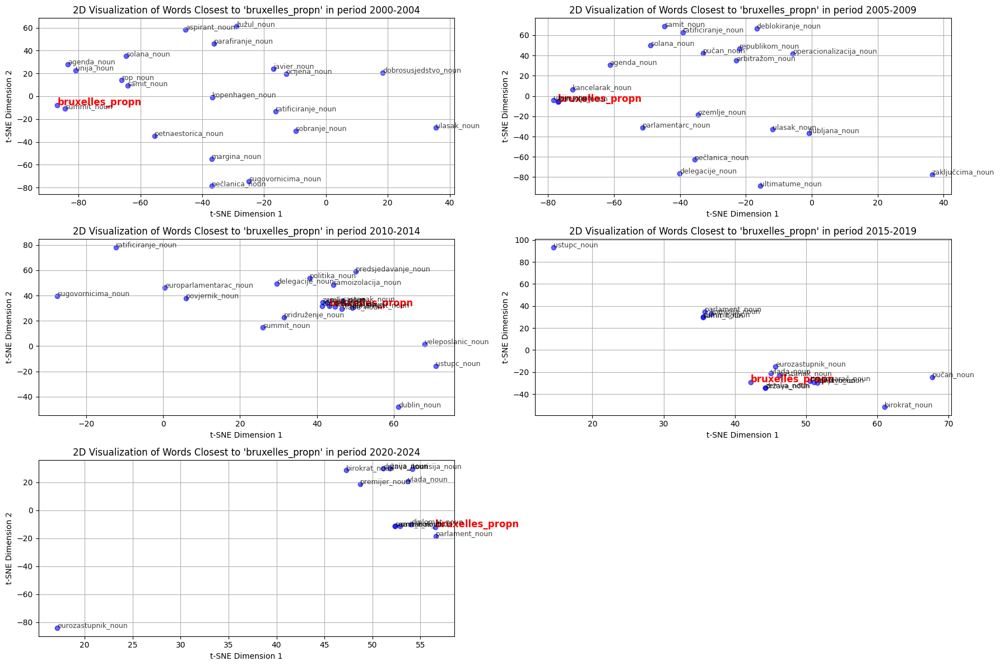




Word: npoo_noun
Most similar to npoo_noun in wave 1 are  []
Most similar to npoo_noun in wave 2 are  []
Most similar to npoo_noun in wave 3 are  []
Most similar to npoo_noun in wave 4 are  []
Most similar to npoo_noun in wave 5 are  ['otpornost_noun', 'alokacija_noun', 'sufinanciranje_noun', 'investicija_noun', 'sredstvo_noun', 'oporavak_noun', 'avans_noun', 'projekt_noun', 'rebalans_noun', 'ulaganje_noun', 'financiranje_noun', 'kohezija_noun', 'obnova_noun', 'rasterećenje_noun', 'tranša_noun', 'konkurentnost_noun', 'samofinanciranje_noun', 'natječaj_noun', 'mlrd_noun', 'zajmov_noun']


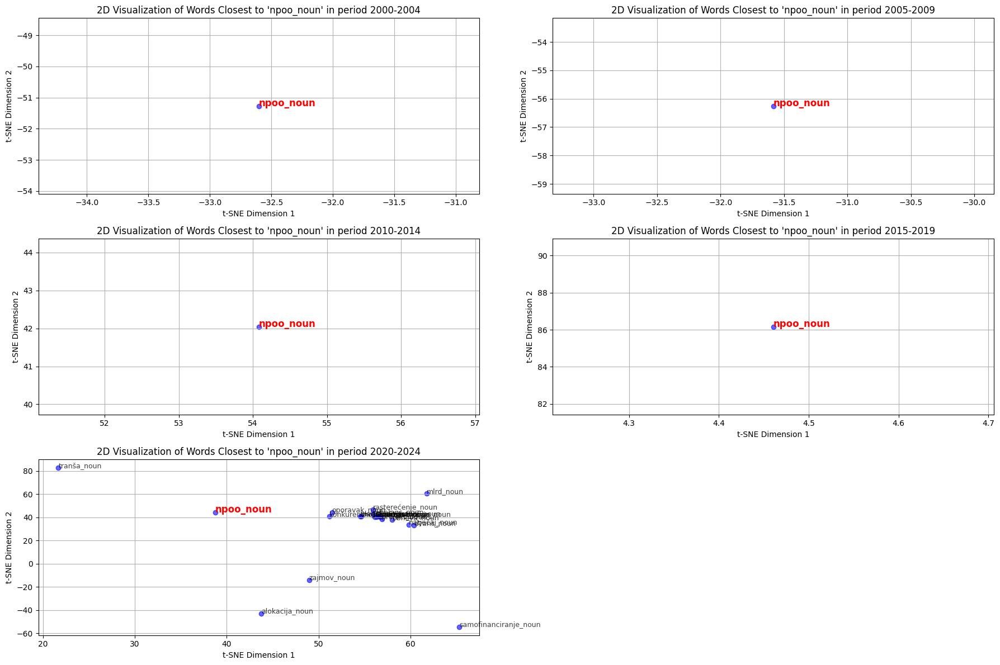




Word: članstvo_noun
Most similar to članstvo_noun in wave 1 are  ['aspirant_noun', 'agenda_noun', 'vladajuć_noun', 'učlanjivanje_noun', 'ratificiranje_noun', 'nedolasak_noun', 'samit_noun', 'opredijeljenost_noun', 'aklamacija_noun', 'unija_noun', 'zaključivanje_noun', 'sssh_noun', 'psp_noun', 'temelje_noun', 'harmonizacija_noun', 'plebiscit_noun', 'rezerviranost_noun', 'suglasje_noun', 'zahtj_noun', 'skorija_noun']
Most similar to članstvo_noun in wave 2 are  ['unija_noun', 'otpočinjanje_noun', 'agenda_noun', 'učlanjivanje_noun', 'reformiranje_noun', 'nečlanica_noun', 'vodstava_noun', 'suodlučivanje_noun', 'politak_noun', 'savezom_noun', 'bojkotu_noun', 'skorija_noun', 'neulazak_noun', 'veleposlanic_noun', 'plebiscit_noun', 'reprezentativnost_noun', 'protuprijedlog_noun', 'opredijeljenost_noun', 'mobiliziranje_noun', 'pučan_noun']
Most similar to članstvo_noun in wave 3 are  ['unija_noun', 'učlanjivanje_noun', 'otpočinjanje_noun', 'nečlanica_noun', 'samoizolacija_noun', 'država_noun

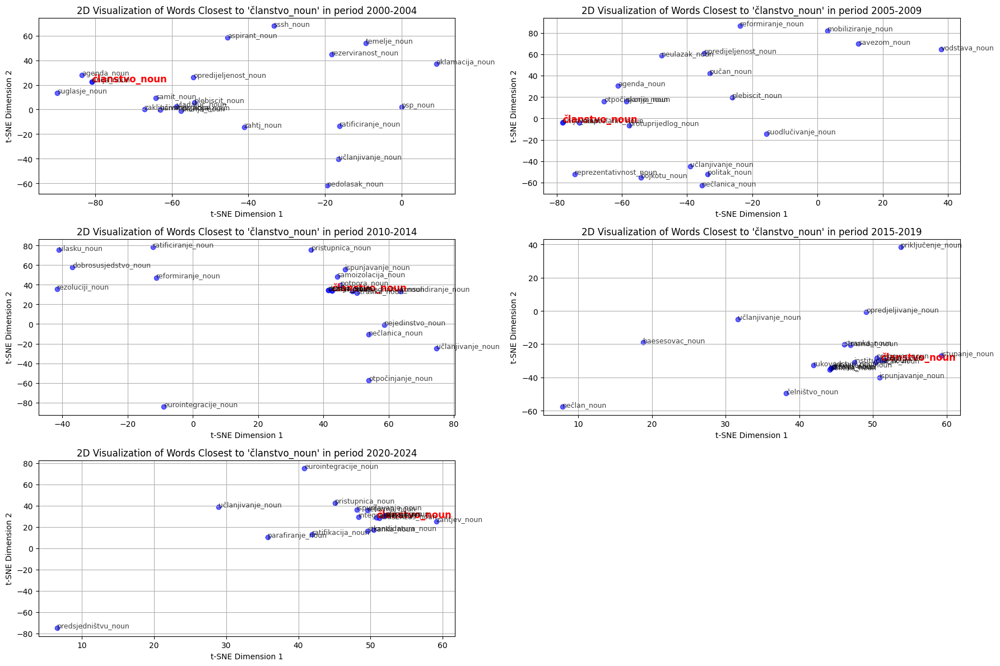




Word: komisija_noun
Most similar to komisija_noun in wave 1 are  ['ombudsman_noun', 'sukladnost_noun', 'delegacije_noun', 'unija_noun', 'screening_noun', 'nacrta_noun', 'ratificiranje_noun', 'potvrđivanje_noun', 'useljeništvo_noun', 'tijele_noun', 'petnaestorica_noun', 'aklamacija_noun', 'direktorij_noun', 'temelje_noun', 'psp_noun', 'federalizacija_noun', 'instanac_noun', 'agenda_noun', 'meritum_noun', 'donijet_noun']
Most similar to komisija_noun in wave 2 are  ['delegacije_noun', 'unija_noun', 'mjerodavnost_noun', 'arbitražom_noun', 'instancija_noun', 'posredništvo_noun', 'pravnici_noun', 'operacionalizacija_noun', 'otpočinjanje_noun', 'harmonizacija_noun', 'izaslanstva_noun', 'protuprijedlog_noun', 'ratificiranje_noun', 'izrijeak_noun', 'eksperti_noun', 'deblokiranje_noun', 'screening_noun', 'medijator_noun', 'raspraviti_noun', 'ulasak_noun']
Most similar to komisija_noun in wave 3 are  ['unija_noun', 'monitoring_noun', 'politak_noun', 'ombudsman_noun', 'povjerenic_noun', 'vijeć

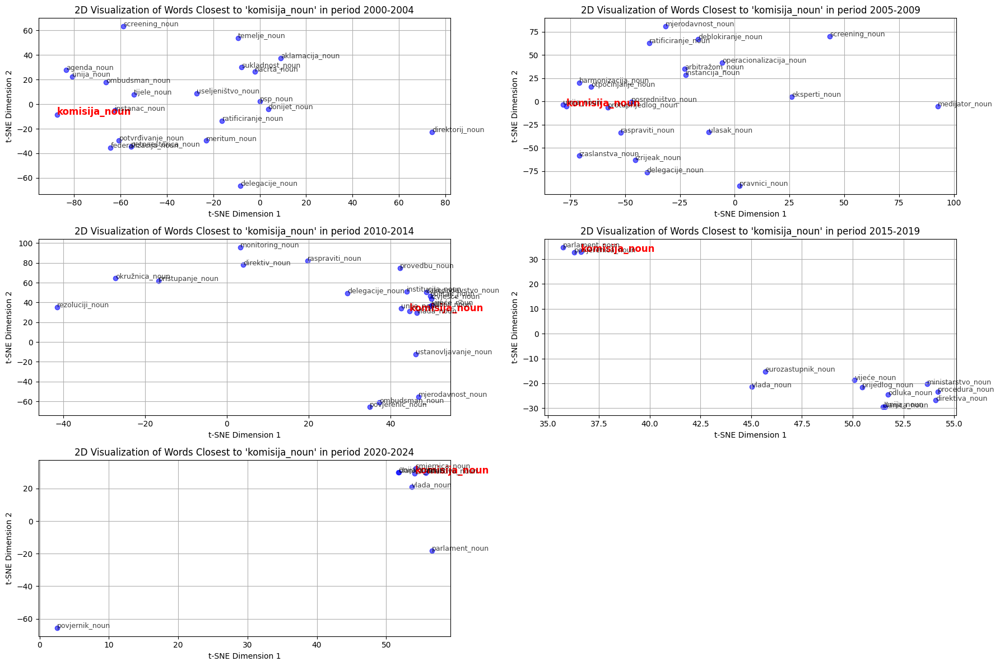




Word: fond_noun
Most similar to fond_noun in wave 1 are  ['portfelj_noun', 'kotacija_noun', 'benefit_noun', 'refinanciranje_noun', 'uloz_noun', 'socijala_noun', 'udjela_noun', 'umirovljeniac_noun', 'poljoprivredniac_noun', 'dotacija_noun', 'učešće_noun', 'zajam_noun', 'prvokupa_noun', 'stjecatelj_noun', 'planov_noun', 'štedionica_noun', 'nekretnin_noun', 'otkupati_noun', 'dospijeće_noun', 'reprogram_noun']
Most similar to fond_noun in wave 2 are  ['alokacija_noun', 'benefit_noun', 'tranša_noun', 'manager_noun', 'dab_noun', 'uplaćivanje_noun', 'stipendiranje_noun', 'finaciranje_noun', 'ipo_noun', 'depozit_noun', 'bnp_noun', 'kapital_noun', 'zajm_noun', 'nominale_noun', 'disperzija_noun', 'startup_noun', 'stjecatelj_noun', 'uloz_noun', 'donošenjem_noun', 'namirenje_noun']
Most similar to fond_noun in wave 3 are  ['alokacija_noun', 'namicanje_noun', 'kapital_noun', 'dividende_noun', 'banka_noun', 'sufinanciranje_noun', 'poduzeće_noun', 'investicija_noun', 'novac_noun', 'iznos_noun', 'u

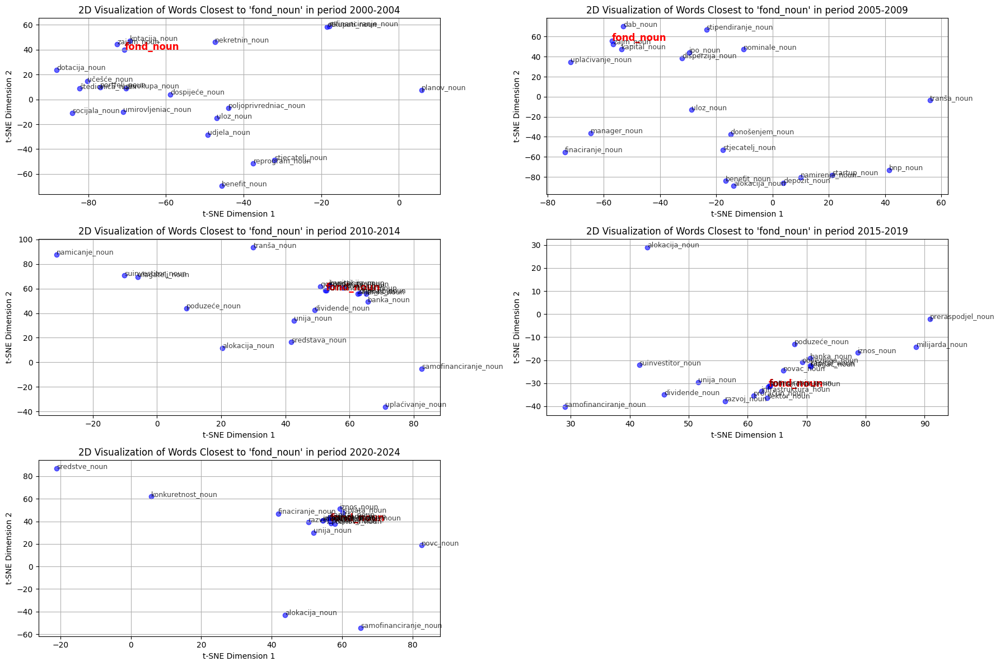




Word: parlament_noun
Most similar to parlament_noun in wave 1 are  ['knesset_noun', 'većinom_noun', 'elektor_noun', 'izglasavanje_noun', 'plebiscit_noun', 'federalizacija_noun', 'pučan_noun', 'sobranje_noun', 'dss_noun', 'zastupnik_noun', 'ombudsman_noun', 'ujedinjene_noun', 'nesudjelovanje_noun', 'koštunica_noun', 'stranka_noun', 'tumačenjima_noun', 'mandatar_noun', 'ukaz_noun', 'socijalist_noun', 'konstituiranje_noun']
Most similar to parlament_noun in wave 2 are  ['sobranje_noun', 'knesset_noun', 'pučan_noun', 'plebiscit_noun', 'vlada_noun', 'raspraviti_noun', 'ozemlje_noun', 'europarlament_noun', 'ratifikacija_noun', 'stranka_noun', 'internacionale_noun', 'janez_noun', 'unionist_noun', 'zaključke_noun', 'većinom_noun', 'suodlučivanje_noun', 'veleposlanic_noun', 'izrijeak_noun', 'aklamacija_noun', 'izglasavanje_noun']
Most similar to parlament_noun in wave 3 are  ['stranka_noun', 'saziv_noun', 'knesset_noun', 'izglasavanje_noun', 'pučan_noun', 'sobranje_noun', 'rezoluciji_noun', 

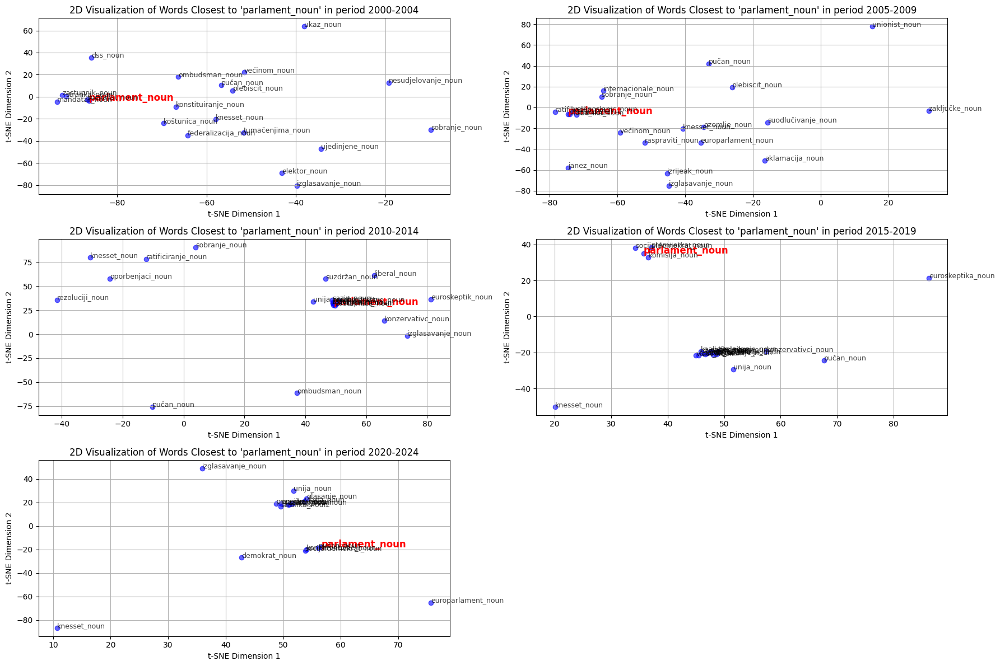




Word: pregovor_noun
Most similar to pregovor_noun in wave 1 are  ['zaključivanje_noun', 'deal_noun', 'nenapadanje_noun', 'otpočinjanje_noun', 'ratificiranje_noun', 'nadnevak_noun', 'ulasak_noun', 'operacionalizacija_noun', 'povjerenic_noun', 'riješavanje_noun', 'šestorke_noun', 'sastancima_noun', 'napretk_noun', 'sporazum_noun', 'skorija_noun', 'usuglašavanje_noun', 'nepotpisivanje_noun', 'izaslanic_noun', 'samit_noun', 'unedogled_noun']
Most similar to pregovor_noun in wave 2 are  ['ratificiranje_noun', 'usuglašavanje_noun', 'otpočinjanje_noun', 'skorija_noun', 'denuklearizacija_noun', 'operacionalizacija_noun', 'dogovoriti_noun', 'deblokada_noun', 'neulazak_noun', 'republikom_noun', 'konkretizacija_noun', 'poslodavcem_noun', 'screening_noun', 'obvezivanje_noun', 'veleposlanic_noun', 'unija_noun', 'suglazaj_noun', 'ultimatume_noun', 'ozemlje_noun', 'modalitet_noun']
Most similar to pregovor_noun in wave 3 are  ['parafiranje_noun', 'potpisivanje_noun', 'sastanak_noun', 'otpočinjanje

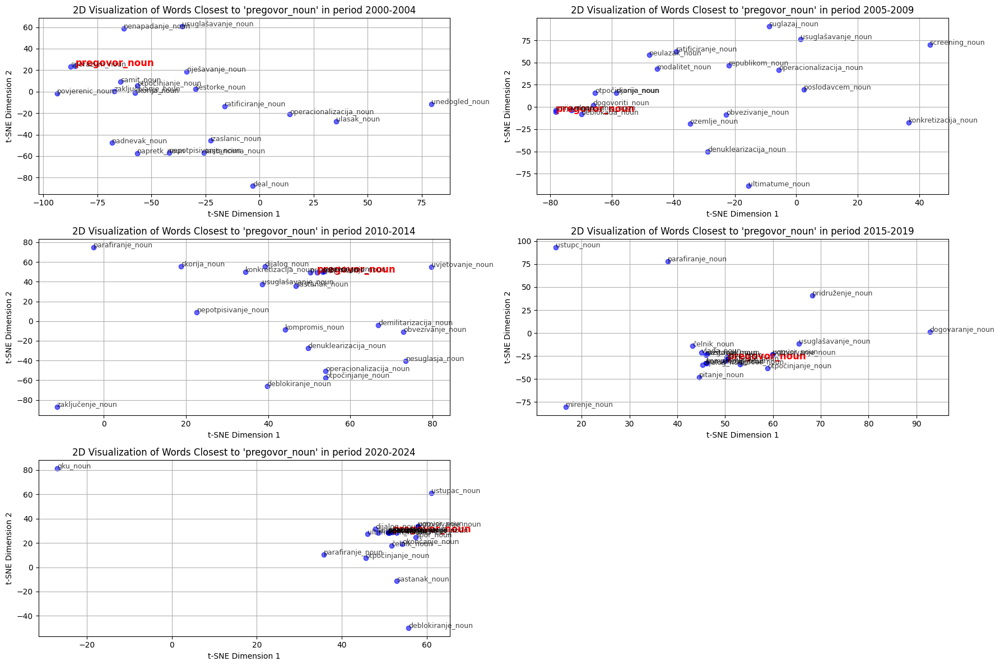




Word: unija_noun
Most similar to unija_noun in wave 1 are  ['agenda_noun', 'ulasak_noun', 'petnaestorica_noun', 'nečlanica_noun', 'harmonizacija_noun', 'psp_noun', 'stečevina_noun', 'dobrosusjedstvo_noun', 'neutralnost_noun', 'ocijena_noun', 'ratificiranje_noun', 'diplomata_noun', 'otpočinjanje_noun', 'useljavanje_noun', 'imigracija_noun', 'vlad_noun', 'kopenhagen_noun', 'opredijeljenost_noun', 'pučan_noun', 'oživotvorenje_noun']
Most similar to unija_noun in wave 2 are  ['ulasak_noun', 'nečlanica_noun', 'ratificiranje_noun', 'agenda_noun', 'zemlja_noun', 'dobrosusjedstvo_noun', 'ozemlje_noun', 'članica_noun', 'legislativa_noun', 'otpočinjanje_noun', 'republikom_noun', 'skorija_noun', 'veleposlanic_noun', 'pučan_noun', 'harmonizacija_noun', 'kancelarak_noun', 'delegacije_noun', 'učlanjenje_noun', 'federaciju_noun', 'operacionalizacija_noun']
Most similar to unija_noun in wave 3 are  ['zemlja_noun', 'članica_noun', 'država_noun', 'delegacije_noun', 'nečlanica_noun', 'integracija_noun

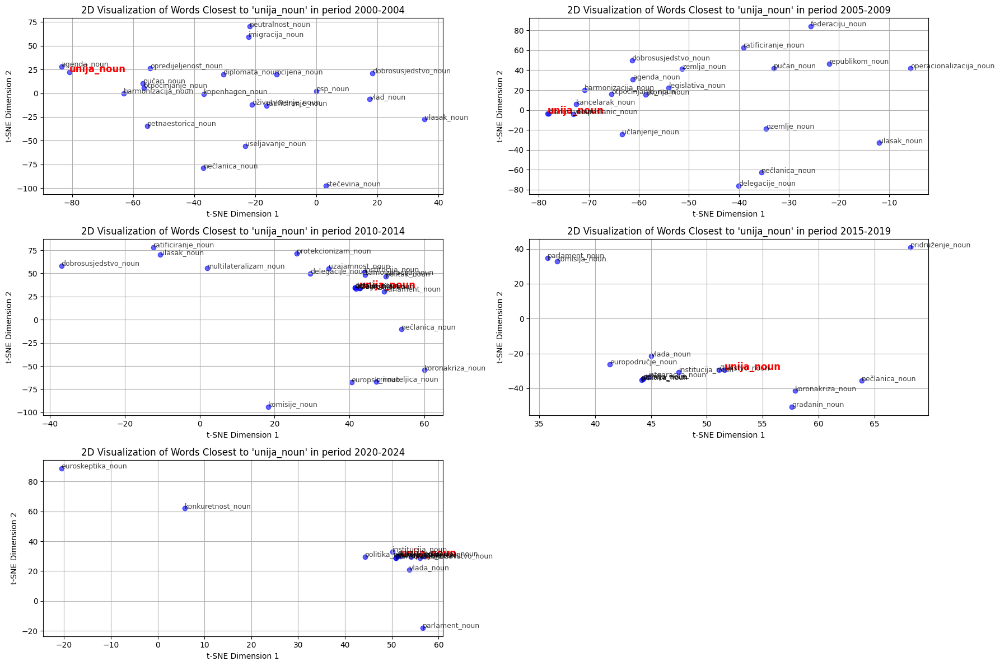




Word: članica_noun
Most similar to članica_noun in wave 1 are  ['nečlanica_noun', 'unija_noun', 'petnaestorica_noun', 'ulasak_noun', 'organizaciju_noun', 'sudionica_noun', 'potpisnica_noun', 'aklamacija_noun', 'neutralnost_noun', 'zemlja_noun', 'konvergencija_noun', 'učlanjivanje_noun', 'kopenhagen_noun', 'ratificiranje_noun', 'javier_noun', 'samit_noun', 'rastakanje_noun', 'šefov_noun', 'agenda_noun', 'ocijena_noun']
Most similar to članica_noun in wave 2 are  ['unija_noun', 'nečlanica_noun', 'zemlja_noun', 'ulasak_noun', 'ratificiranje_noun', 'potpisnica_noun', 'sudionica_noun', 'država_noun', 'pristupanje_noun', 'zaključcima_noun', 'bojkotu_noun', 'pododbor_noun', 'zagovornica_noun', 'veleposlanic_noun', 'predsjedavanje_noun', 'organizaciju_noun', 'sljednica_noun', 'učlanjivanje_noun', 'konvergencija_noun', 'alokacija_noun']
Most similar to članica_noun in wave 3 are  ['unija_noun', 'zemlja_noun', 'država_noun', 'mjerodavnost_noun', 'potpisnica_noun', 'institucija_noun', 'rezoluc

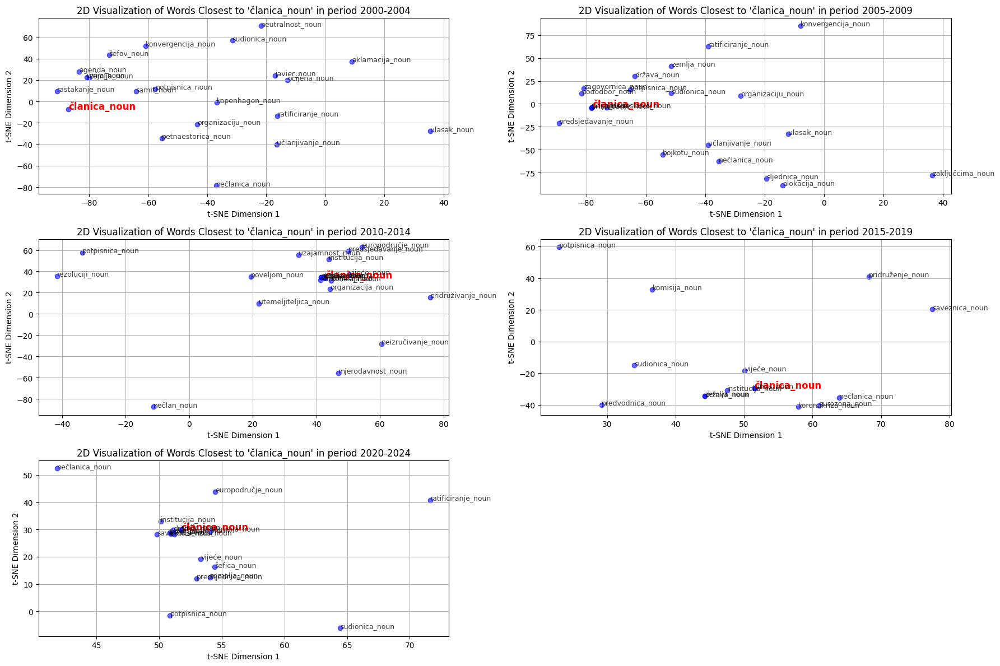




Word: europa_propn
Most similar to europa_propn in wave 1 are  ['azija_noun', 'zemlja_noun', 'svijet_noun', 'nečlanica_noun', 'zamlja_noun', 'regija_noun', 'afrika_noun', 'hemisfera_noun', 'velesila_noun', 'poljaac_noun', 'dobrosusjedstvo_noun', 'svrstavati_noun', 'sloma_noun', 'kopenhagen_noun', 'angažiran_noun', 'unija_noun', 'kak_noun', 'ocijena_noun', 'atlantik_noun', 'organizaciju_noun']
Most similar to europa_propn in wave 2 are  ['zemlja_noun', 'regija_noun', 'azija_noun', 'svijet_noun', 'nečlanica_noun', 'nazadovanje_noun', 'unija_noun', 'širom_noun', 'ulasak_noun', 'velesila_noun', 'brazil_noun', 'sredozemlj_noun', 'agenda_noun', 'republikom_noun', 'ukrajina_noun', 'simbolički_noun', 'nukleark_noun', 'zamlja_noun', 'organizaciju_noun', 'federaciju_noun']
Most similar to europa_propn in wave 3 are  ['zemlja_noun', 'kontinent_noun', 'regija_noun', 'svijet_noun', 'unija_noun', 'država_noun', 'berlin_noun', 'istok_noun', 'zamlja_noun', 'budućnost_noun', 'azija_noun', 'tržište_n

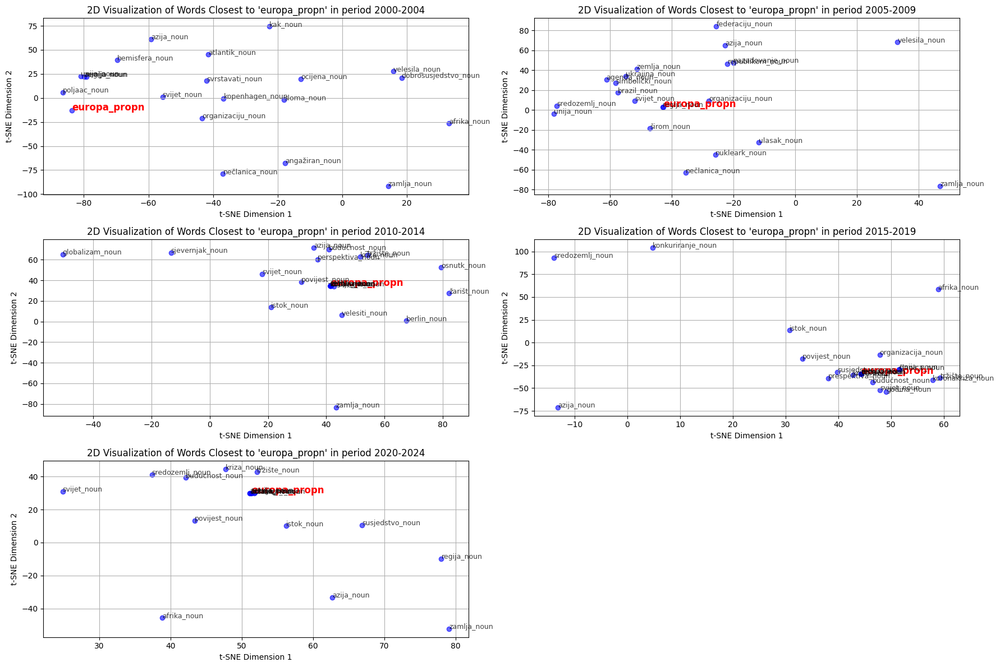




Word: eu_propn
Most similar to eu_propn in wave 1 are  ['nečlanica_noun', 'agenda_noun', 'psp_noun', 'ratificiranje_noun', 'harmonizacija_noun', 'dobrosusjedstvo_noun', 'vlad_noun', 'petnaestorica_noun', 'ocijena_noun', 'izazoviti_noun', 'otpočinjanje_noun', 'opredijeljenost_noun', 'aspirant_noun', 'rezerviranost_noun', 'dinamiziranje_noun', 'omekšavanje_noun', 'udvostručenje_noun', 'javier_noun', 'zemalja_noun', 'koronakriza_noun']
Most similar to eu_propn in wave 2 are  ['unija_noun', 'nečlanica_noun', 'ulasak_noun', 'zemlja_noun', 'ratificiranje_noun', 'dobrosusjedstvo_noun', 'legislativa_noun', 'agenda_noun', 'uvjetovanje_noun', 'članstvo_noun', 'otpočinjanje_noun', 'ozemlje_noun', 'referenduam_noun', 'veleposlanic_noun', 'skorija_noun', 'direktiv_noun', 'ustupac_noun', 'operacionalizacija_noun', 'zaključcima_noun', 'kancelarke_noun']
Most similar to eu_propn in wave 3 are  ['zemlja_noun', 'članica_noun', 'nečlanica_noun', 'država_noun', 'ratificiranje_noun', 'delegacije_noun', 

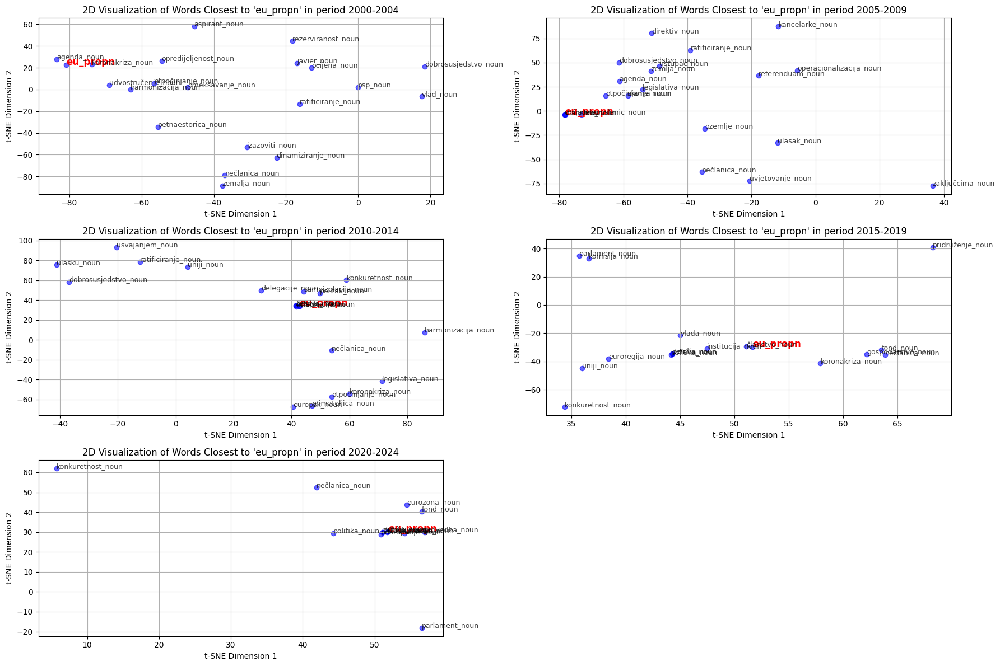




Word: euro_noun
Most similar to euro_noun in wave 1 are  ['protuvrijednost_noun', 'kuna_noun', 'maraka_noun', 'tolar_noun', 'dem_noun', 'šiling_noun', 'rupija_noun', 'jena_noun', 'rubalj_noun', 'polog_noun', 'forinta_noun', 'chf_noun', 'cifra_noun', 'kotizacija_noun', 'uračunat_noun', 'bilijun_noun', 'ušteđevina_noun', 'funta_noun', 'keš_noun', 'zelembaća_noun']
Most similar to euro_noun in wave 2 are  ['kuna_noun', 'protuvrijednost_noun', 'funta_noun', 'forinta_noun', 'tolar_noun', 'šiling_noun', 'chf_noun', 'dem_noun', 'marak_noun', 'tisuća_noun', 'akontacija_noun', 'rupija_noun', 'rubalj_noun', 'cifra_noun', 'jena_noun', 'iznositi_noun', 'bilijun_noun', 'svoti_noun', 'čekovo_noun', 'amortizacija_noun']
Most similar to euro_noun in wave 3 are  ['kuna_noun', 'funta_noun', 'dolar_noun', 'tolar_noun', 'protuvrijednost_noun', 'tisuća_noun', 'marak_noun', 'forinta_noun', 'rubalja_noun', 'svot_noun', 'milijard_noun', 'cifra_noun', 'usd_noun', 'jena_noun', 'zelembaća_noun', 'iznost_noun'

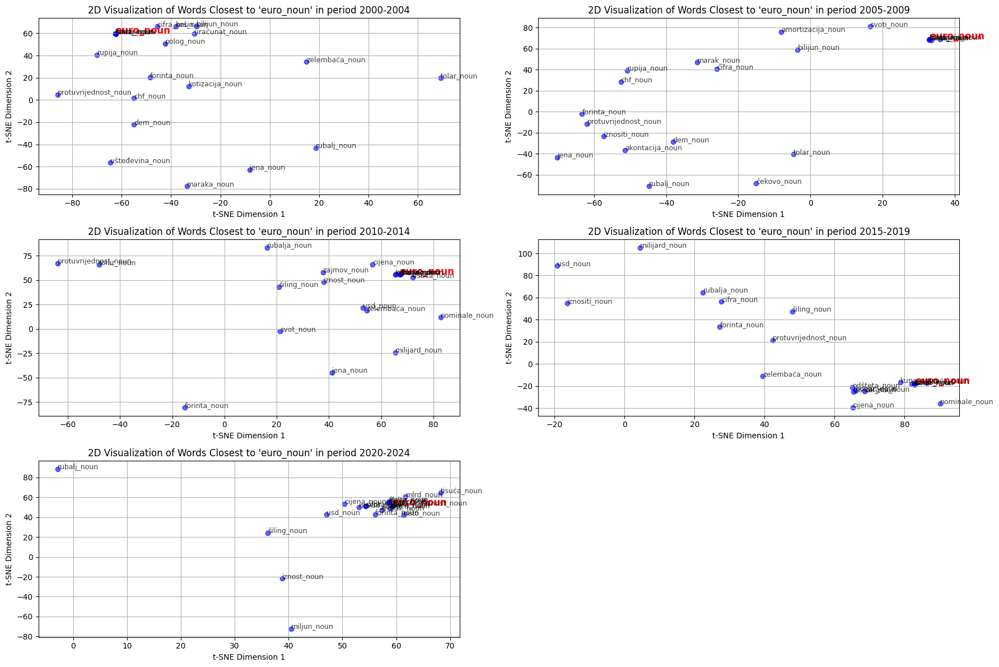

In [22]:
for target_word in [
    "euroskepticizam_noun",
    "tranzicija_noun",
    "schengen_propn",
    "ek_propn",
    "proširenje_noun",
    "eurozona_noun",
    "suverenitet_noun",
    "integracija_noun",
    "bruxelles_propn",
    "npoo_noun",
    "članstvo_noun",
    "komisija_noun",
    "fond_noun",
    "parlament_noun",
    "pregovor_noun",
    "unija_noun",
    "članica_noun",
    "europa_propn",
    "eu_propn",
    "euro_noun",
]:
    print(f"Word: {target_word}")
    print("==" * 20)
    plot_tsne_visualization(
        get_most_similar_by_pos(target_word, "noun", 1000, 200),
        target_word,
        periods,
        waves,
        period_labels={
            0: "2000-2004",
            1: "2005-2009",
            2: "2010-2014",
            3: "2015-2019",
            4: "2020-2024",
        },
    )
    print("\n\n")

### Analyze the shifts for known words

In [34]:
def plot_cumulative_shift(words):
    TOP_N = len(words)

    common_vocab = [x + "_noun" for x in words]

    drift_scores = {}
    drift_scores_cumulative = {word: [] for word in common_vocab}

    for i in range(len(models) - 1):
        for word in common_vocab:
            vec1 = models[i].wv[word]
            vec2 = models[i + 1].wv[word]
            dist = cosine_distance(vec1, vec2)
            if word not in drift_scores:
                drift_scores[word] = 0
            drift_scores[word] += dist
            drift_scores_cumulative[word].append(dist)

    top_drifters_cumulative = [
        (word, drift_scores_cumulative[word]) for word in common_vocab
    ][:TOP_N]

    # Plot drift for top words
    period_labels = {
        0: "2000-2004",
        1: "2005-2009",
        2: "2010-2014",
        3: "2015-2019",
        4: "2020-2024",
    }
    plt.figure(figsize=(10, 6))

    for word, dists in top_drifters_cumulative:
        plt.plot(
            [period_labels[p] for p in periods[1:]],
            dists,
            label=word,
            marker="o",
            alpha=0.8,
        )

    plt.title(
        f"Top Shift Noun Words Based on the Cumulative Shift Score"
    )
    plt.xlabel("Period")
    plt.ylabel(f"Cosine Distance Between Neighboring Periods")
    plt.ylim(0, 0.25)
    plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1), fontsize="small")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

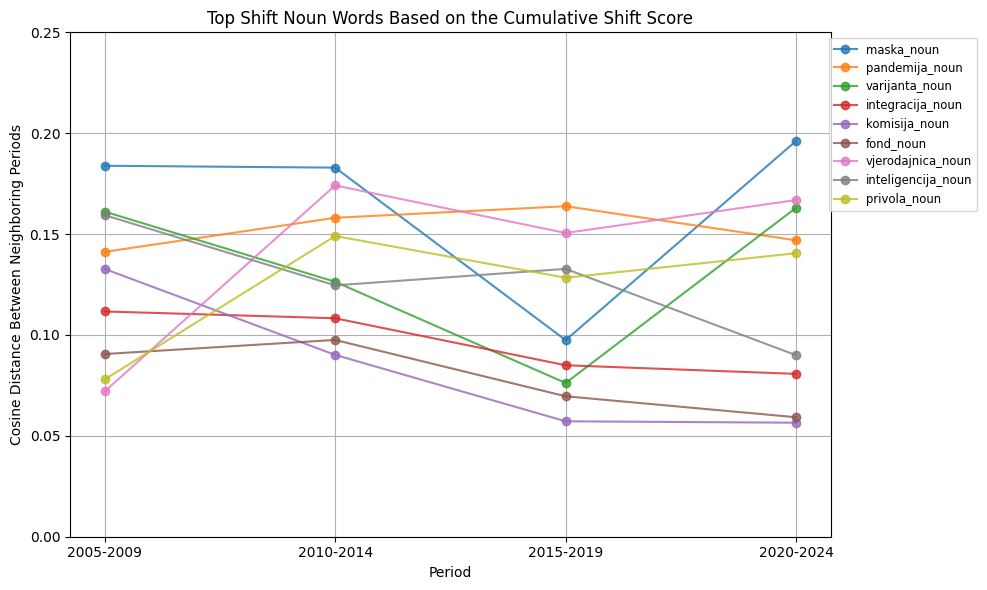

In [35]:
plot_cumulative_shift(
    words=[
        "maska",
        "pandemija",
        "varijanta",
        "integracija",
        "komisija",
        "fond",
        "vjerodajnica",
        "inteligencija",
        "privola",
    ]
)